<ipython-input-10-73bac0e30d25>:64: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim([0, 5000])


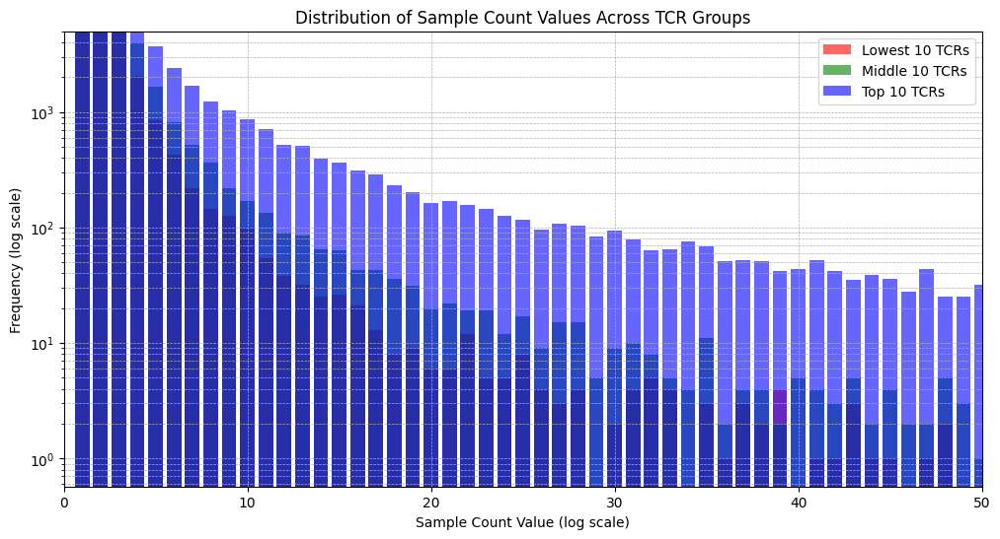

In [ ]:
# Re-import necessary libraries since execution state was reset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ast

# Reload the dataset
file_path = "subset123_tcr_counts_and_cloness.csv"
df = pd.read_csv(file_path)

# Filter TCRs with sample_appearance_count between 1000 and 1500
filtered_df = df[(df["sample_appearance_count"] >= 1000) &
                 (df["sample_appearance_count"] <= 1500)].copy()

# Sort by consistency_area to get top 10, middle 10, and lowest 10
filtered_df.sort_values(by="consistency_area", inplace=True)

lowest_10_df = filtered_df.head(100)
top_10_df = filtered_df.tail(100)

# For the middle 10, take 100 rows around the halfway point
total_rows = len(filtered_df)
mid_start = (total_rows // 2) - 50
mid_end = mid_start + 100
middle_10_df = filtered_df.iloc[mid_start:mid_end]

# Function to parse sample_counts
def parse_sample_counts(counts_str):
    """Parse a string like '[1, 2, 3]' into a numpy array of ints."""
    counts_list = ast.literal_eval(counts_str)
    return np.array(counts_list, dtype=int)

# Function to extract and count sample counts for distribution plotting
def get_sample_counts_distribution(tcr_df):
    """
    Extracts all sample counts from a DataFrame, flattens them into a 1D array,
    and returns a dictionary containing value frequencies.
    """
    all_counts = []
    for _, row in tcr_df.iterrows():
        counts_arr = parse_sample_counts(row["sample_counts"])
        all_counts.extend(counts_arr.tolist())

    # Convert to a NumPy array and count occurrences of each value
    all_counts = np.array(all_counts)
    unique_values, counts = np.unique(all_counts, return_counts=True)

    return unique_values, counts

# Get distributions for each group
lowest_values, lowest_counts = get_sample_counts_distribution(lowest_10_df)
middle_values, middle_counts = get_sample_counts_distribution(middle_10_df)
top_values, top_counts = get_sample_counts_distribution(top_10_df)

# Plot the distributions
plt.figure(figsize=(12, 6))
plt.bar(lowest_values, lowest_counts, alpha=0.6, label="Lowest 10 TCRs", color="red")
plt.bar(middle_values, middle_counts, alpha=0.6, label="Middle 10 TCRs", color="green")
plt.bar(top_values, top_counts, alpha=0.6, label="Top 10 TCRs", color="blue")

#plt.xscale("log")  # Log scale for better visibility of rare values
plt.yscale("log")  # Log scale for count distribution
plt.xlim([0, 50])
plt.ylim([0, 5000])
plt.xlabel("Sample Count Value (log scale)")
plt.ylabel("Frequency (log scale)")
plt.title("Distribution of Sample Count Values Across TCR Groups")
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()


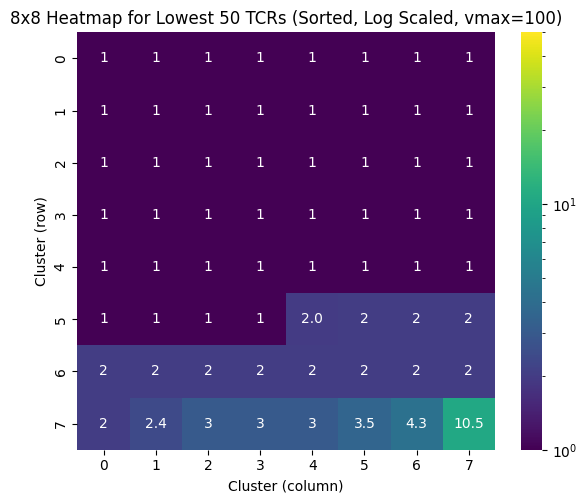

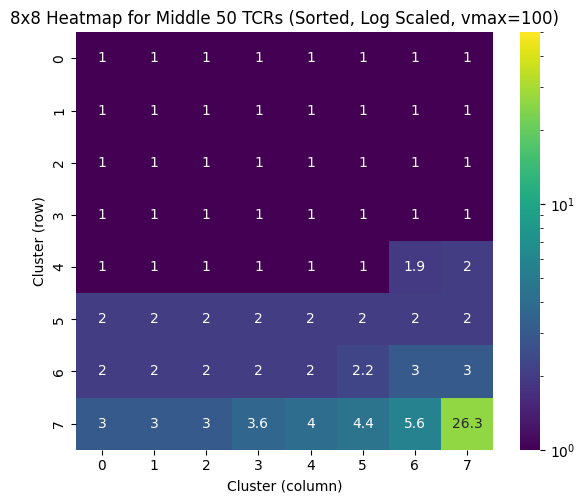

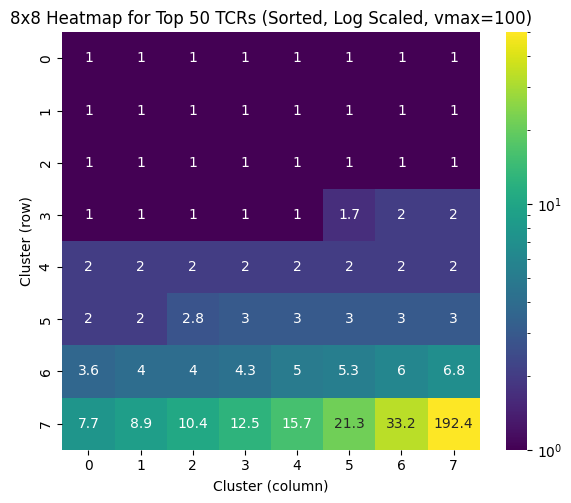

In [ ]:
# Re-import necessary libraries since execution state was reset
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import ast
import matplotlib.colors as mcolors

# Reload the dataset
file_path = "subset123_tcr_counts_and_cloness.csv"
df = pd.read_csv(file_path)

# Filter TCRs with sample_appearance_count between 1000 and 1500
filtered_df = df[(df["sample_appearance_count"] >= 1000) &
                 (df["sample_appearance_count"] <= 1500)].copy()

# Sort by consistency_area to get top 50, middle 50, and lowest 50
filtered_df.sort_values(by="consistency_area", inplace=True)

lowest_50_df = filtered_df.head(50)
top_50_df = filtered_df.tail(50)

# For the middle 50, take 50 rows around the halfway point
total_rows = len(filtered_df)
mid_start = (total_rows // 2) - 25
mid_end = mid_start + 50
middle_50_df = filtered_df.iloc[mid_start:mid_end]

# Function to parse sample_counts
def parse_sample_counts(counts_str):
    """Parse a string like '[1, 2, 3]' into a numpy array of ints."""
    counts_list = ast.literal_eval(counts_str)
    return np.array(counts_list, dtype=int)

# Function to compute sorted mean clusters for heatmap visualization
def get_sorted_means(tcr_df):
    """
    1. Extract & flatten sample_counts.
    2. Sort the values in ascending order.
    3. Divide into 64 equal bins.
    4. Return an 8x8 array of cluster mean values.
    """
    # Flatten all sample_counts
    all_counts = []
    for _, row in tcr_df.iterrows():
        counts_arr = parse_sample_counts(row["sample_counts"])
        all_counts.extend(counts_arr.tolist())

    # Convert to numpy array and sort values
    all_counts = np.array(all_counts)
    all_counts.sort()

    # Ensure we have at least 64 values; if not, pad with NaNs
    if len(all_counts) < 64:
        all_counts = np.pad(all_counts, (0, 64 - len(all_counts)), constant_values=np.nan)

    # Split into 64 equal-sized groups and compute the mean for each
    sorted_means = np.array_split(all_counts, 64)
    sorted_means = np.array([np.nanmean(group) for group in sorted_means])  # Compute mean per group

    # Reshape into 8x8 matrix
    sorted_means_8x8 = sorted_means.reshape(8, 8)
    return sorted_means_8x8

# Compute sorted cluster means for each group
lowest_sorted_8x8 = get_sorted_means(lowest_50_df)
middle_sorted_8x8 = get_sorted_means(middle_50_df)
top_sorted_8x8    = get_sorted_means(top_50_df)

# Find global min/max across all sorted cluster means
all_sorted_means = np.concatenate([lowest_sorted_8x8.flatten(),
                                   middle_sorted_8x8.flatten(),
                                   top_sorted_8x8.flatten()])
global_min_sorted = np.nanmin(all_sorted_means)
global_max_sorted = np.nanmax(all_sorted_means)

# Set a fixed upper limit for the color bar (ylim) to 100
fixed_vmax = 50

# Function to format heatmap annotations
def format_value(val):
    """Format heatmap values: Remove .0 but keep decimal for non-integer values."""
    if np.isnan(val):
        return ""
    elif val == int(val):  # If it's an integer, remove decimal
        return f"{int(val)}"
    else:  # Otherwise, keep one decimal place
        return f"{val:.1f}"

# Function to plot heatmaps with log-scaled color bar and custom annotations, limiting the color range
def plot_heatmap_log_fixed(cluster_means_8x8, group_name, vmin):
    """Plot an 8x8 heatmap with a log-scaled color bar, capping vmax at 100."""
    plt.figure(figsize=(6, 5))
    norm = mcolors.LogNorm(vmin=max(vmin, 1e-6), vmax=fixed_vmax)  # Log scale normalization

    # Create formatted annotations
    formatted_annotations = np.vectorize(format_value)(cluster_means_8x8)

    sns.heatmap(cluster_means_8x8,
                annot=formatted_annotations,
                fmt="",
                cmap="viridis",
                cbar=True,
                square=True,
                norm=norm)  # Apply log scaling

    plt.title(f"8x8 Heatmap for {group_name} (Sorted, Log Scaled, vmax=100)")
    plt.xlabel("Cluster (column)")
    plt.ylabel("Cluster (row)")
    plt.tight_layout()
    plt.show()

# Plot heatmaps with fixed color range (vmax=100) and log-scaled color bar
plot_heatmap_log_fixed(lowest_sorted_8x8, "Lowest 50 TCRs", global_min_sorted)
plot_heatmap_log_fixed(middle_sorted_8x8, "Middle 50 TCRs", global_min_sorted)
plot_heatmap_log_fixed(top_sorted_8x8, "Top 50 TCRs", global_min_sorted)


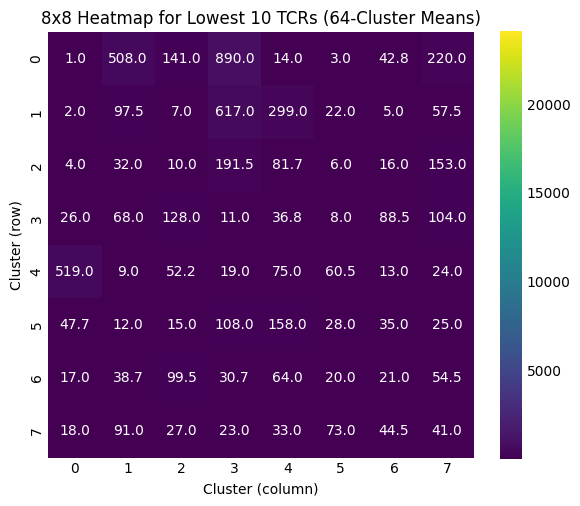

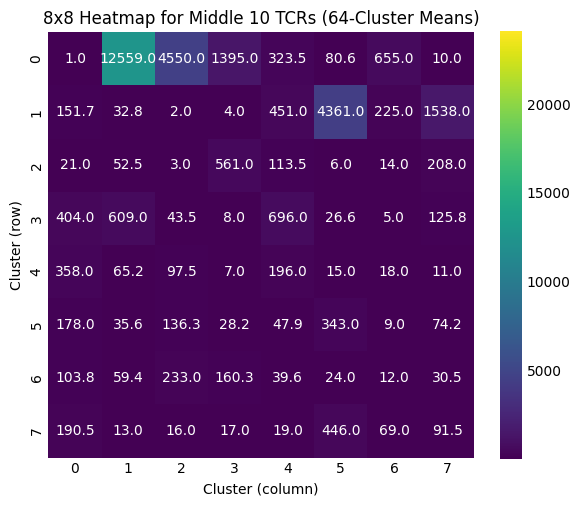

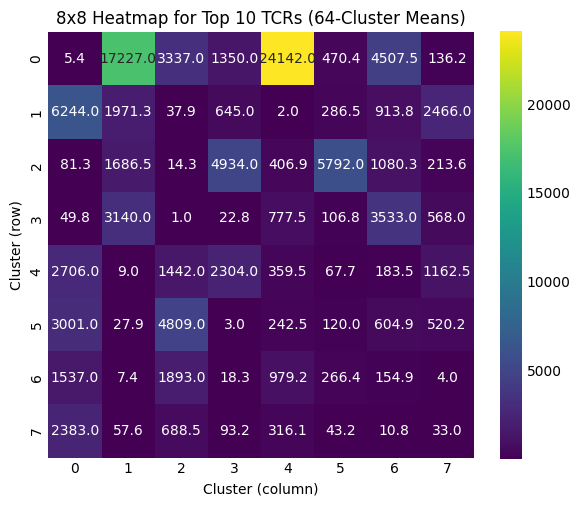

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import ast

# 1. LOAD THE CSV FILE
csv_path = "subset123_tcr_counts_and_cloness.csv"
df = pd.read_csv(csv_path)

# 2. FILTER TCRs WITH 1000 <= sample_appearance_count <= 1500
filtered_df = df[(df["sample_appearance_count"] >= 1000) &
                 (df["sample_appearance_count"] <= 1500)].copy()

# 3. SORT BY consistency_area TO GET TOP 10, MIDDLE 10, LOWEST 10
filtered_df.sort_values(by="consistency_area", inplace=True)

lowest_10_df = filtered_df.head(100)
top_10_df = filtered_df.tail(100)

# For the middle 10, take 10 rows around the halfway point
total_rows = len(filtered_df)
mid_start = (total_rows // 2) - 50
mid_end = mid_start + 100
middle_10_df = filtered_df.iloc[mid_start:mid_end]

def parse_sample_counts(counts_str):
    """Parse a string like '[1, 2, 3]' into a numpy array of ints."""
    counts_list = ast.literal_eval(counts_str)
    return np.array(counts_list, dtype=int)

def get_cluster_means(tcr_df):
    """
    1. Extract & flatten sample_counts.
    2. KMeans clustering into 64 groups.
    3. Return an 8x8 array of cluster mean values.
    """
    # Flatten all sample_counts for K-Means
    all_counts = []
    for _, row in tcr_df.iterrows():
        counts_arr = parse_sample_counts(row["sample_counts"])
        all_counts.extend(counts_arr.tolist())

    all_counts = np.array(all_counts).reshape(-1, 1)  # shape = (n,1)

    # KMeans with 64 clusters
    kmeans = KMeans(n_clusters=64, random_state=42)
    labels = kmeans.fit_predict(all_counts)

    # Compute mean per cluster
    cluster_means = []
    for cluster_id in range(64):
        cluster_points = all_counts[labels == cluster_id]
        mean_val = cluster_points.mean() if len(cluster_points) > 0 else 0
        cluster_means.append(mean_val)

    # Reshape the 64 means into 8x8
    cluster_means = np.array(cluster_means).reshape(8, 8)
    return cluster_means

# 4. PRE-COMPUTE CLUSTER MEANS FOR ALL GROUPS
lowest_means_8x8 = get_cluster_means(lowest_10_df)
middle_means_8x8 = get_cluster_means(middle_10_df)
top_means_8x8    = get_cluster_means(top_10_df)

# 5. FIND GLOBAL MIN/MAX ACROSS ALL CLUSTER MEANS
all_means = np.concatenate([lowest_means_8x8.flatten(),
                            middle_means_8x8.flatten(),
                            top_means_8x8.flatten()])
global_min = all_means.min()
global_max = all_means.max()

def plot_heatmap(cluster_means_8x8, group_name, vmin, vmax):
    """Plot an 8x8 heatmap with a shared color scale."""
    plt.figure(figsize=(6, 5))
    sns.heatmap(cluster_means_8x8,
                annot=True,
                fmt=".1f",
                cmap="viridis",
                cbar=True,
                square=True,
                vmin=vmin,  # use global min
                vmax=vmax)  # use global max

    plt.title(f"8x8 Heatmap for {group_name} (64-Cluster Means)")
    plt.xlabel("Cluster (column)")
    plt.ylabel("Cluster (row)")
    plt.tight_layout()
    plt.show()

# 6. PLOT HEATMAPS WITH THE SAME COLOR RANGE
plot_heatmap(lowest_means_8x8, "Lowest 10 TCRs", global_min, global_max)
plot_heatmap(middle_means_8x8, "Middle 10 TCRs", global_min, global_max)
plot_heatmap(top_means_8x8,    "Top 10 TCRs",    global_min, global_max)


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import ast

# 1. LOAD THE CSV FILE
csv_path = "subset123_tcr_counts_and_cloness.csv"
df = pd.read_csv(csv_path)

# 2. FILTER TCRs WITH 1000 <= sample_appearance_count <= 1500
filtered_df = df[(df["sample_appearance_count"] >= 1000) &
                 (df["sample_appearance_count"] <= 1500)].copy()

# 3. SORT BY consistency_area TO GET TOP 10, MIDDLE 10, LOWEST 10
filtered_df.sort_values(by="consistency_area", inplace=True)

lowest_10_df = filtered_df.head(100)
top_10_df = filtered_df.tail(100)

# For the middle 10, take 10 rows around the halfway point
total_rows = len(filtered_df)
mid_start = (total_rows // 2) - 50
mid_end = mid_start + 100
middle_10_df = filtered_df.iloc[mid_start:mid_end]

def parse_sample_counts(counts_str):
    """Parse a string like '[1, 2, 3]' into a numpy array of ints."""
    counts_list = ast.literal_eval(counts_str)
    return np.array(counts_list, dtype=int)


# Function to compute sorted mean clusters for heatmap visualization
def get_sorted_means(tcr_df):
    """
    1. Extract & flatten sample_counts.
    2. Sort the values in ascending order.
    3. Divide into 64 equal bins.
    4. Return an 8x8 array of cluster mean values.
    """
    # Flatten all sample_counts
    all_counts = []
    for _, row in tcr_df.iterrows():
        counts_arr = parse_sample_counts(row["sample_counts"])
        all_counts.extend(counts_arr.tolist())

    # Convert to numpy array and sort values
    all_counts = np.array(all_counts)
    all_counts.sort()

    # Ensure we have at least 64 values; if not, pad with NaNs
    if len(all_counts) < 64:
        all_counts = np.pad(all_counts, (0, 64 - len(all_counts)), constant_values=np.nan)

    # Split into 64 equal-sized groups and compute the mean for each
    sorted_means = np.array_split(all_counts, 64)
    sorted_means = np.array([np.nanmean(group) for group in sorted_means])  # Compute mean per group

    # Reshape into 8x8 matrix
    sorted_means_8x8 = sorted_means.reshape(8, 8)
    return sorted_means_8x8

# 4. PRE-COMPUTE SORTED CLUSTER MEANS FOR ALL GROUPS
lowest_sorted_8x8 = get_sorted_means(lowest_10_df)
middle_sorted_8x8 = get_sorted_means(middle_10_df)
top_sorted_8x8    = get_sorted_means(top_10_df)

# 5. FIND GLOBAL MIN/MAX ACROSS ALL SORTED CLUSTER MEANS
all_sorted_means = np.concatenate([lowest_sorted_8x8.flatten(),
                                   middle_sorted_8x8.flatten(),
                                   top_sorted_8x8.flatten()])
global_min_sorted = np.nanmin(all_sorted_means)
global_max_sorted = np.nanmax(all_sorted_means)

# 6. PLOT HEATMAPS WITH THE SAME COLOR RANGE (SORTED MEANS)
plot_heatmap(lowest_sorted_8x8, "Lowest 10 TCRs (Sorted)", global_min_sorted, global_max_sorted)
plot_heatmap(middle_sorted_8x8, "Middle 10 TCRs (Sorted)", global_min_sorted, global_max_sorted)
plot_heatmap(top_sorted_8x8,    "Top 10 TCRs (Sorted)", global_min_sorted, global_max_sorted)


NameError: name 'plot_heatmap' is not defined

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
import ast

# Suppose these are your 8×8 cluster-mean arrays for each group
lowest_means_8x8 = np.random.rand(8,8)   # placeholder
middle_means_8x8 = np.random.rand(8,8)   # placeholder
top_means_8x8    = np.random.rand(8,8)   # placeholder

# Put them in a dictionary for easy access
cluster_means_dict = {
    'Lowest 10': lowest_means_8x8,
    'Middle 10': middle_means_8x8,
    'Top 10':    top_means_8x8
}

# Also suppose you have raw sample counts for each group (flattened or appended)
# For demo, we create random data; replace with your real arrays
lowest_counts  = np.random.randint(0, 500, size=3000)
middle_counts  = np.random.randint(0, 500, size=3000)
top_counts     = np.random.randint(0, 500, size=3000)

raw_counts_dict = {
    'Lowest 10': lowest_counts,
    'Middle 10': middle_counts,
    'Top 10':    top_counts
}


<ipython-input-19-139198eba877>:11: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_for_plot, labels=group_labels)


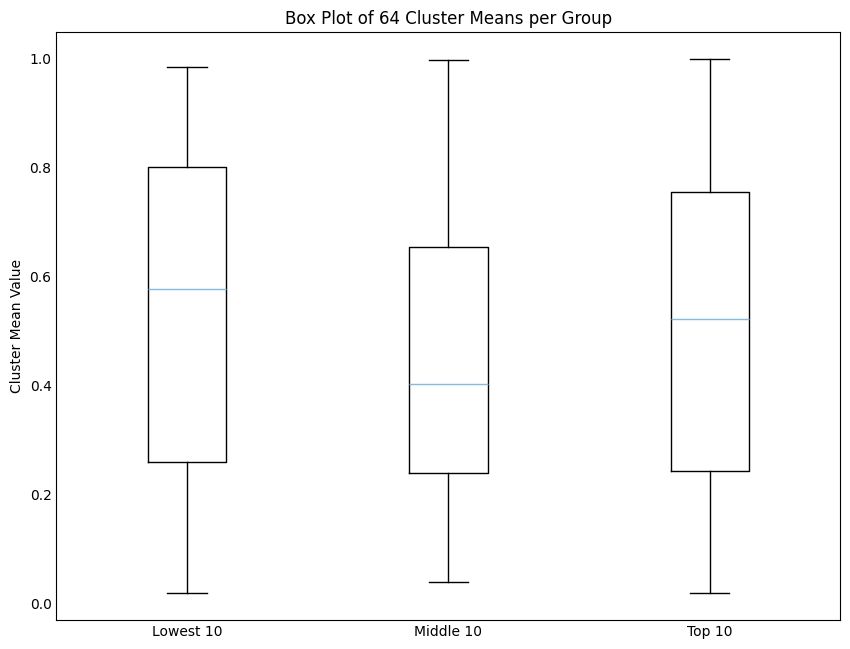

In [ ]:
def plot_box_of_cluster_means(cluster_means_dict):
    data_for_plot = []
    group_labels  = []

    for group_name, means_8x8 in cluster_means_dict.items():
        flattened_means = means_8x8.flatten()
        data_for_plot.append(flattened_means)
        group_labels.append(group_name)

    plt.figure(figsize=(8, 6))
    plt.boxplot(data_for_plot, labels=group_labels)
    plt.title("Box Plot of 64 Cluster Means per Group")
    plt.ylabel("Cluster Mean Value")
    plt.show()

plot_box_of_cluster_means(cluster_means_dict)


<ipython-input-20-f8150da94e81>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_plot, x="group", y="sample_count", inner="box", palette="Set2")


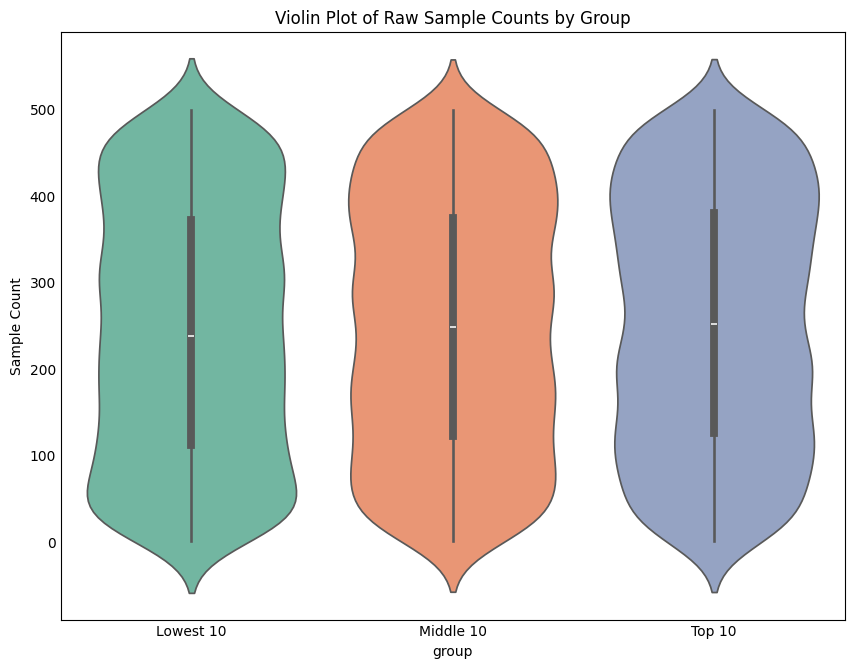

In [ ]:
def plot_violin_of_raw_counts(raw_counts_dict):
    # Build a dataframe for Seaborn
    plot_data = []
    for group_name, counts in raw_counts_dict.items():
        plot_data.extend([(count, group_name) for count in counts])

    df_plot = pd.DataFrame(plot_data, columns=["sample_count", "group"])

    plt.figure(figsize=(8, 6))
    sns.violinplot(data=df_plot, x="group", y="sample_count", inner="box", palette="Set2")
    plt.title("Violin Plot of Raw Sample Counts by Group")
    plt.ylabel("Sample Count")
    plt.show()

plot_violin_of_raw_counts(raw_counts_dict)


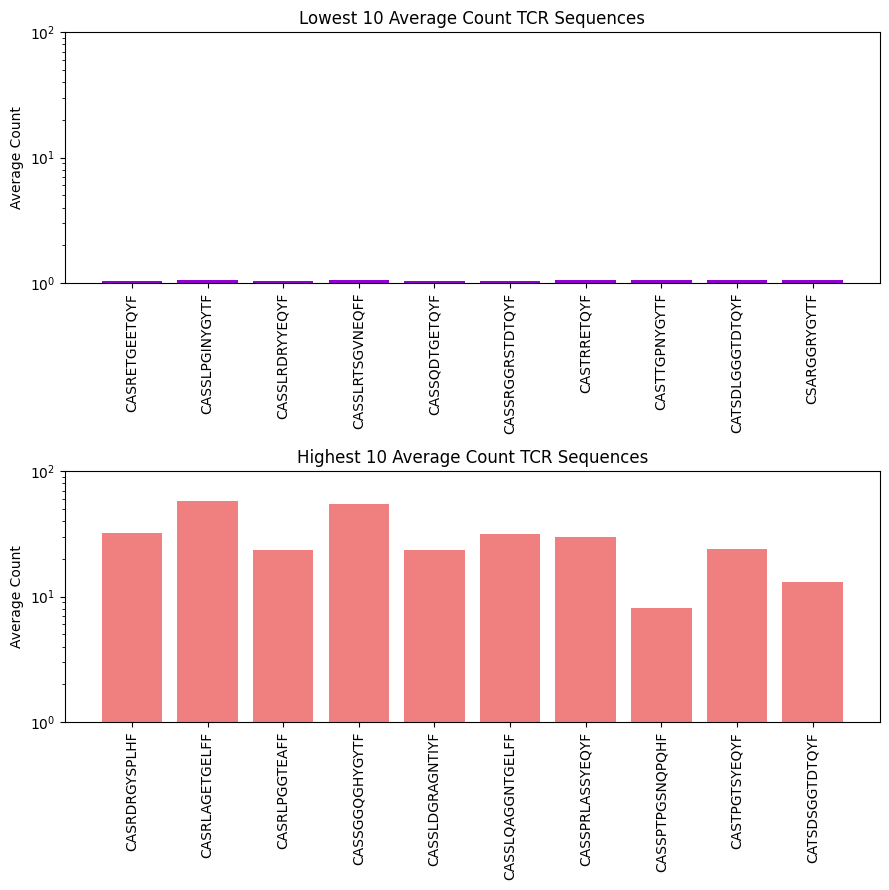

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the CSV file into a DataFrame
#file_path = 'subset123_tcr_counts_and_cloness.csv'  # Update with your actual file path
#df = pd.read_csv(file_path)

# Subset the data where sample_appearance_count is 123
df_subset = df[df['sample_appearance_count'] == 123]

# Group 1: 10 rows with the lowest 'average_count'
lowest_average_count = df_subset.nsmallest(10, 'average_count').sort_values(by='amino_acid')

# Group 2: 10 rows with the highest 'average_count'
highest_average_count = df_subset.nlargest(10, 'average_count').sort_values(by='amino_acid')

# Find the min and max for the y-axis limits to keep them consistent
y_min = min(lowest_average_count['average_count'].min(), highest_average_count['average_count'].min())
y_max = max(lowest_average_count['average_count'].max(), highest_average_count['average_count'].max())

# Plotting the lowest and highest average count
plt.figure(figsize=(9, 9))

# Use distinct solid colors for each group
color_lowest = 'darkviolet'
color_highest = 'lightcoral'

# Plot the lowest 10 average count amino_acids (alphabetically sorted)
plt.subplot(2, 1, 1)
plt.bar(lowest_average_count['amino_acid'], lowest_average_count['average_count'], color=color_lowest)
plt.yscale('log')
plt.ylim(y_min, y_max)
plt.ylabel('Average Count')
plt.title('Lowest 10 Average Count TCR Sequences')
plt.xticks(rotation=90)
#plt.grid(True, which='both', axis='y', linestyle='--', linewidth=0.5)
plt.yticks([10**i for i in range(int(np.floor(np.log10(y_min))), int(np.ceil(np.log10(y_max))) + 1)])

# Plot the highest 10 average count amino_acids (alphabetically sorted)
plt.subplot(2, 1, 2)
plt.bar(highest_average_count['amino_acid'], highest_average_count['average_count'], color=color_highest)
plt.yscale('log')
plt.ylim(y_min, y_max)
plt.ylabel('Average Count')
plt.title('Highest 10 Average Count TCR Sequences')
plt.xticks(rotation=90)
#plt.grid(True, which='both', axis='y', linestyle='--', linewidth=0.5)
plt.yticks([10**i for i in range(int(np.floor(np.log10(y_min))), int(np.ceil(np.log10(y_max))) + 1)])

plt.tight_layout()
plt.show()


<ipython-input-13-f5ae04d798f5>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['sample_counts'] = df_subset['sample_counts'].apply(eval)


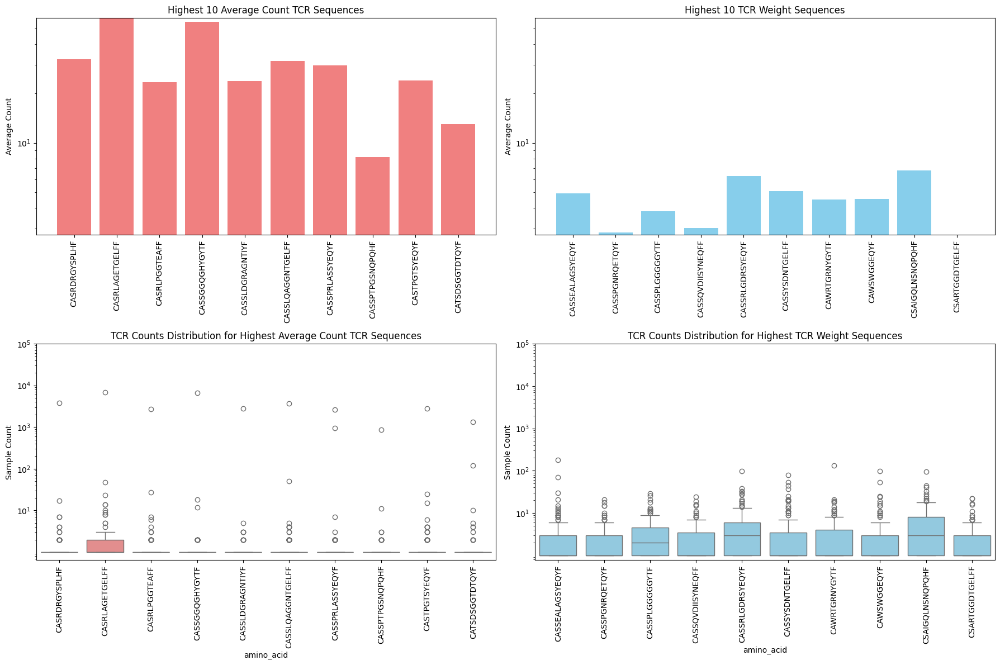

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the CSV file into a DataFrame
file_path = 'subset123_tcr_counts_and_cloness.csv'  # Update with your actual file path
df = pd.read_csv(file_path)

# Subset the data where sample_appearance_count is 123
df_subset = df[df['sample_appearance_count'] == 123]

# Convert 'sample_counts' from string to list for box plots
df_subset['sample_counts'] = df_subset['sample_counts'].apply(eval)

# Group 1: 10 rows with the highest 'average_count'
highest_average_count = df_subset.nlargest(10, 'average_count').sort_values(by='amino_acid')

# Group 2: 10 rows with the highest 'consistency_area'
highest_consistency_area = df_subset.nlargest(10, 'consistency_area').sort_values(by='amino_acid')

# Flatten the sample counts and create a DataFrame for box plot
data = []

# Append data for highest_average_count
for index, row in highest_average_count.iterrows():
    for count in row['sample_counts']:
        data.append({'Group': 'Highest Average Count', 'amino_acid': row['amino_acid'], 'Sample Count': count})

# Append data for highest_consistency_area
for index, row in highest_consistency_area.iterrows():
    for count in row['sample_counts']:
        data.append({'Group': 'Highest Consistency Area', 'amino_acid': row['amino_acid'], 'Sample Count': count})

# Convert the list of dictionaries to a DataFrame for box plot
plot_df = pd.DataFrame(data)

# Find the min and max for the y-axis limits to keep them consistent
y_min = min(highest_average_count['average_count'].min(), highest_consistency_area['average_count'].min())
y_max = max(highest_average_count['average_count'].max(), highest_consistency_area['average_count'].max())

# Set up the figure size
fig, axs = plt.subplots(2, 2, figsize=(18, 12))

# Bar Plot 1: Highest Average Count TCR Sequences
axs[0, 0].bar(highest_average_count['amino_acid'], highest_average_count['average_count'], color='lightcoral')
axs[0, 0].set_yscale('log')
axs[0, 0].set_ylim(y_min, y_max)
axs[0, 0].set_ylabel('Average Count')
axs[0, 0].set_title('Highest 10 Average Count TCR Sequences')
axs[0, 0].tick_params(axis='x', rotation=90)

# Bar Plot 2: Highest Consistency Area TCR Sequences
axs[0, 1].bar(highest_consistency_area['amino_acid'], highest_consistency_area['average_count'], color='skyblue')
axs[0, 1].set_yscale('log')
axs[0, 1].set_ylim(y_min, y_max)
axs[0, 1].set_ylabel('Average Count')
axs[0, 1].set_title('Highest 10 TCR Weight Sequences')
axs[0, 1].tick_params(axis='x', rotation=90)

# Define the consistent y-axis grid for the box plots
y_ticks = [10**i for i in range(1, 6)]

# Box Plot 1: Sample Counts for Highest Average Count TCR Sequences
sns.boxplot(x='amino_acid', y='Sample Count', data=plot_df[plot_df['Group'] == 'Highest Average Count'], ax=axs[1, 0], color='lightcoral')
axs[1, 0].set_yscale('log')
axs[1, 0].set_title('TCR Counts Distribution for Highest Average Count TCR Sequences')
axs[1, 0].tick_params(axis='x', rotation=90)
axs[1, 0].set_yticks(y_ticks)

# Box Plot 2: Sample Counts for Highest Consistency Area TCR Sequences
sns.boxplot(x='amino_acid', y='Sample Count', data=plot_df[plot_df['Group'] == 'Highest Consistency Area'], ax=axs[1, 1], color='skyblue')
axs[1, 1].set_yscale('log')
axs[1, 1].set_title('TCR Counts Distribution for Highest TCR Weight Sequences')
axs[1, 1].tick_params(axis='x', rotation=90)
axs[1, 1].set_yticks(y_ticks)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

<ipython-input-2-9829b9ef2bef>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['sample_counts'] = df_subset['sample_counts'].apply(eval)


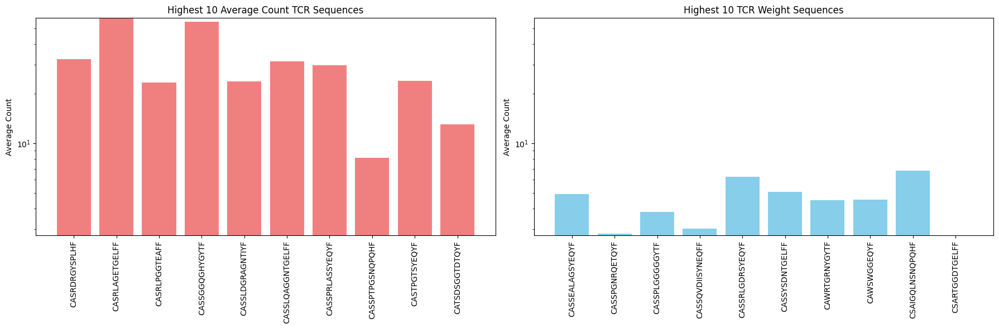

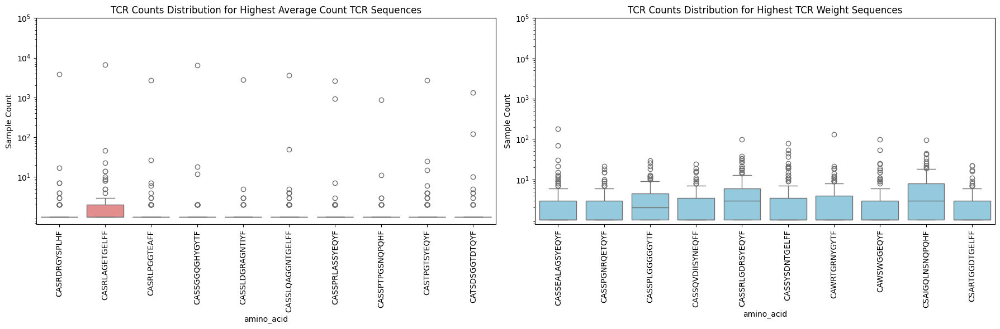

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the CSV file into a DataFrame
file_path = 'subset123_tcr_counts_and_cloness.csv'  # Update with your actual file path
df = pd.read_csv(file_path)

# Subset the data where sample_appearance_count is 123
df_subset = df[df['sample_appearance_count'] == 123]

# Convert 'sample_counts' from string to list for box plots
df_subset['sample_counts'] = df_subset['sample_counts'].apply(eval)

# Group 1: 10 rows with the highest 'average_count'
highest_average_count = df_subset.nlargest(10, 'average_count').sort_values(by='amino_acid')

# Group 2: 10 rows with the highest 'consistency_area'
highest_consistency_area = df_subset.nlargest(10, 'consistency_area').sort_values(by='amino_acid')

# Flatten the sample counts and create a DataFrame for box plot
data = []

# Append data for highest_average_count
for index, row in highest_average_count.iterrows():
    for count in row['sample_counts']:
        data.append({'Group': 'Highest Average Count', 'amino_acid': row['amino_acid'], 'Sample Count': count})

# Append data for highest_consistency_area
for index, row in highest_consistency_area.iterrows():
    for count in row['sample_counts']:
        data.append({'Group': 'Highest Consistency Area', 'amino_acid': row['amino_acid'], 'Sample Count': count})

# Convert the list of dictionaries to a DataFrame for box plot
plot_df = pd.DataFrame(data)

# Find the min and max for the y-axis limits to keep them consistent
y_min = min(highest_average_count['average_count'].min(), highest_consistency_area['average_count'].min())
y_max = max(highest_average_count['average_count'].max(), highest_consistency_area['average_count'].max())

# Define the consistent y-axis grid for the box plots
y_ticks = [10**i for i in range(1, 6)]

# First Figure: Bar Plots
fig1, axs1 = plt.subplots(1, 2, figsize=(18, 6))

# Bar Plot 1: Highest Average Count TCR Sequences
axs1[0].bar(highest_average_count['amino_acid'], highest_average_count['average_count'], color='lightcoral')
axs1[0].set_yscale('log')
axs1[0].set_ylim(y_min, y_max)
axs1[0].set_ylabel('Average Count')
axs1[0].set_title('Highest 10 Average Count TCR Sequences')
axs1[0].tick_params(axis='x', rotation=90)

# Bar Plot 2: Highest Consistency Area TCR Sequences
axs1[1].bar(highest_consistency_area['amino_acid'], highest_consistency_area['average_count'], color='skyblue')
axs1[1].set_yscale('log')
axs1[1].set_ylim(y_min, y_max)
axs1[1].set_ylabel('Average Count')
axs1[1].set_title('Highest 10 TCR Weight Sequences')
axs1[1].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

# Second Figure: Box Plots
fig2, axs2 = plt.subplots(1, 2, figsize=(18, 6))

# Box Plot 1: Sample Counts for Highest Average Count TCR Sequences
sns.boxplot(x='amino_acid', y='Sample Count', data=plot_df[plot_df['Group'] == 'Highest Average Count'], ax=axs2[0], color='lightcoral')
axs2[0].set_yscale('log')
axs2[0].set_title('TCR Counts Distribution for Highest Average Count TCR Sequences')
axs2[0].tick_params(axis='x', rotation=90)
axs2[0].set_yticks(y_ticks)

# Box Plot 2: Sample Counts for Highest Consistency Area TCR Sequences
sns.boxplot(x='amino_acid', y='Sample Count', data=plot_df[plot_df['Group'] == 'Highest Consistency Area'], ax=axs2[1], color='skyblue')
axs2[1].set_yscale('log')
axs2[1].set_title('TCR Counts Distribution for Highest TCR Weight Sequences')
axs2[1].tick_params(axis='x', rotation=90)
axs2[1].set_yticks(y_ticks)

plt.tight_layout()
plt.show()


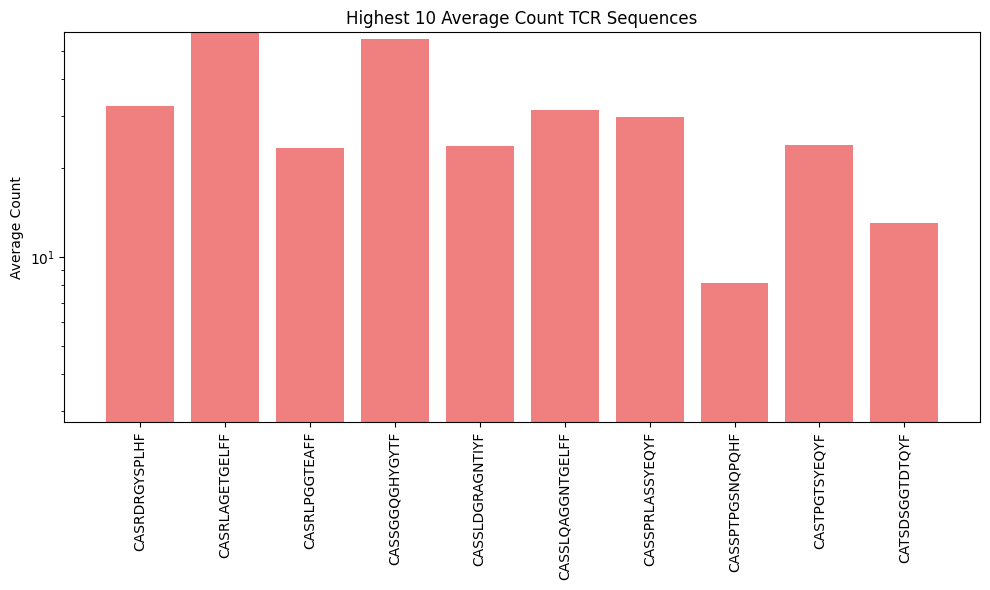

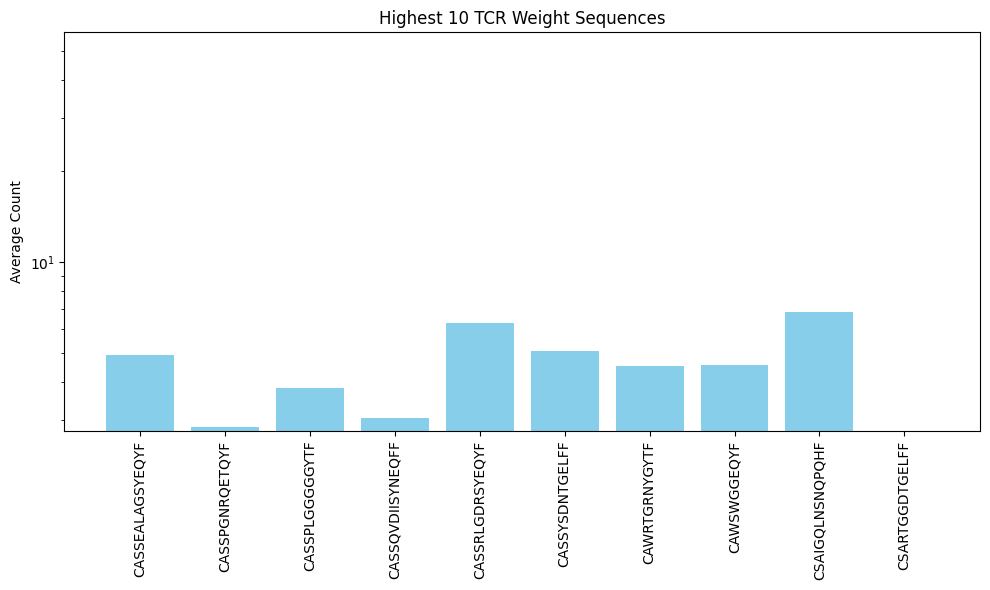

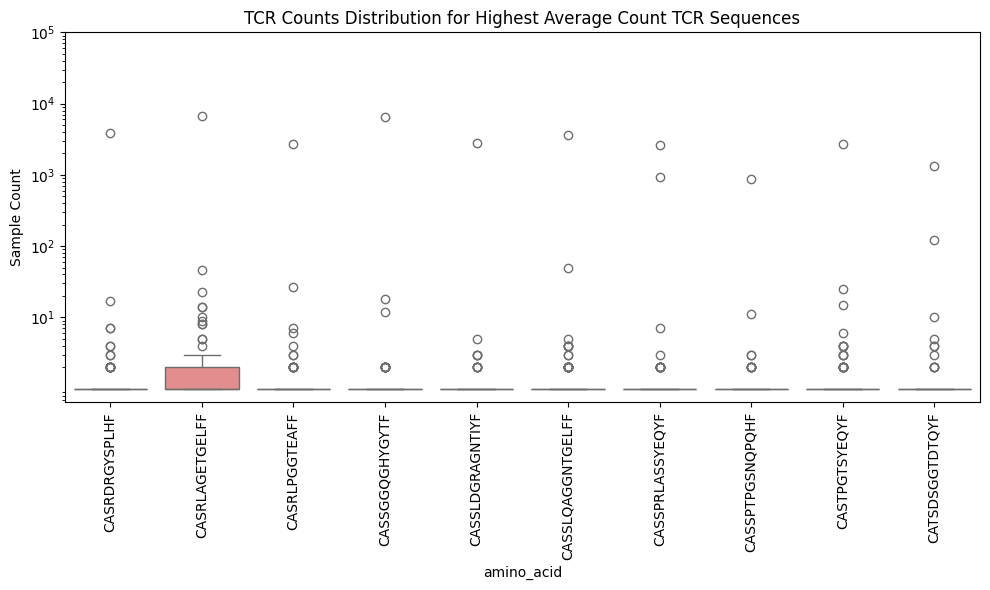

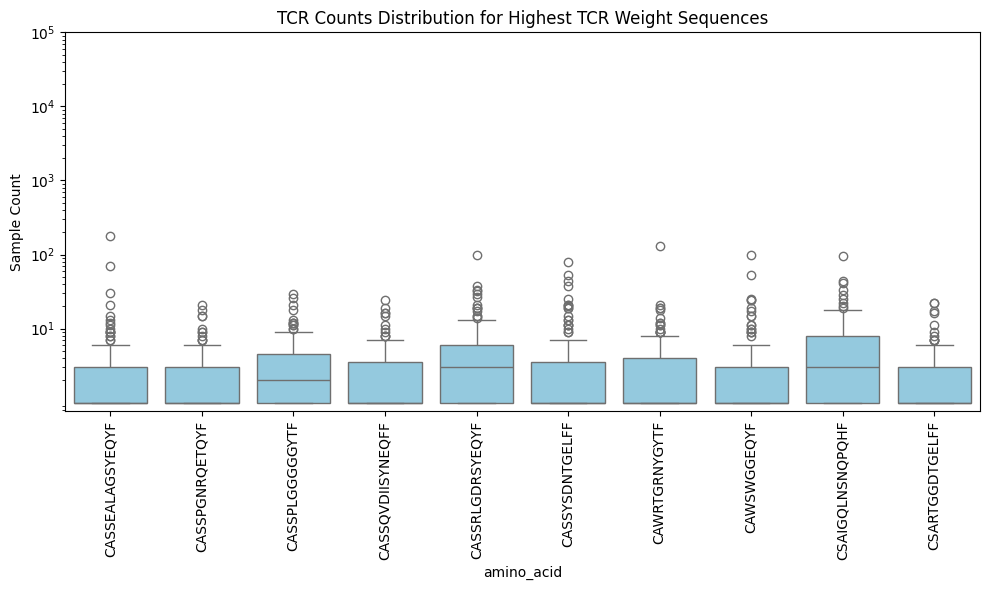

In [ ]:
# First Figure: Bar Plot - Highest Average Count TCR Sequences
fig1, ax1 = plt.subplots(figsize=(10, 6))
ax1.bar(highest_average_count['amino_acid'], highest_average_count['average_count'], color='lightcoral')
ax1.set_yscale('log')
ax1.set_ylim(y_min, y_max)
ax1.set_ylabel('Average Count')
ax1.set_title('Highest 10 Average Count TCR Sequences')
ax1.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

# Second Figure: Bar Plot - Highest Consistency Area TCR Sequences
fig2, ax2 = plt.subplots(figsize=(10, 6))
ax2.bar(highest_consistency_area['amino_acid'], highest_consistency_area['average_count'], color='skyblue')
ax2.set_yscale('log')
ax2.set_ylim(y_min, y_max)
ax2.set_ylabel('Average Count')
ax2.set_title('Highest 10 TCR Weight Sequences')
ax2.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

# Third Figure: Box Plot - Sample Counts for Highest Average Count TCR Sequences
fig3, ax3 = plt.subplots(figsize=(10, 6))
sns.boxplot(x='amino_acid', y='Sample Count', data=plot_df[plot_df['Group'] == 'Highest Average Count'], ax=ax3, color='lightcoral')
ax3.set_yscale('log')
ax3.set_title('TCR Counts Distribution for Highest Average Count TCR Sequences')
ax3.tick_params(axis='x', rotation=90)
ax3.set_yticks(y_ticks)

plt.tight_layout()
plt.show()

# Fourth Figure: Box Plot - Sample Counts for Highest Consistency Area TCR Sequences
fig4, ax4 = plt.subplots(figsize=(10, 6))
sns.boxplot(x='amino_acid', y='Sample Count', data=plot_df[plot_df['Group'] == 'Highest Consistency Area'], ax=ax4, color='skyblue')
ax4.set_yscale('log')
ax4.set_title('TCR Counts Distribution for Highest TCR Weight Sequences')
ax4.tick_params(axis='x', rotation=90)
ax4.set_yticks(y_ticks)

plt.tight_layout()
plt.show()


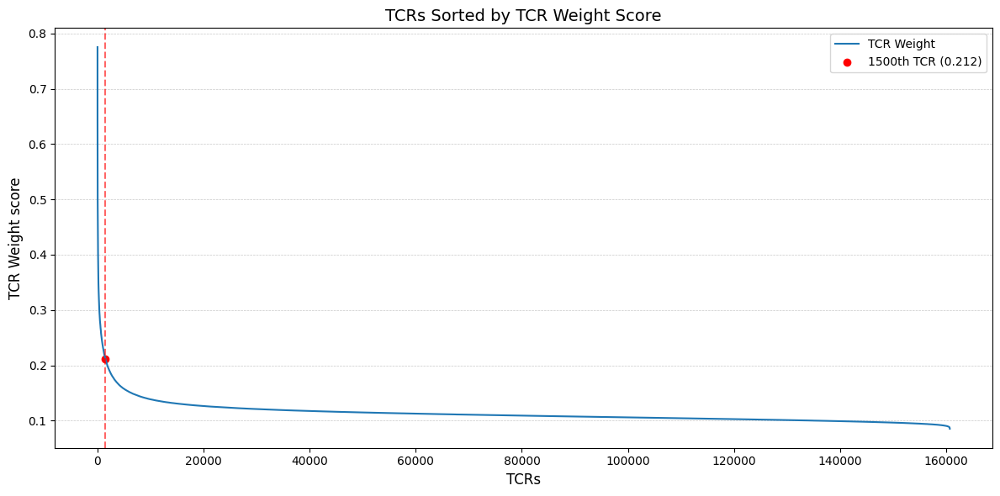

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file into a DataFrame
file_path = 'subset123_tcr_counts_and_cloness.csv'  # Update with your actual file path
df = pd.read_csv(file_path)

# Sort the DataFrame by 'consistency_area' in descending order
df_sorted = df.sort_values(by='consistency_area', ascending=False).reset_index()

# Plot the sorted 'consistency_area' values
plt.figure(figsize=(12, 6))
plt.plot(df_sorted.index + 1, df_sorted['consistency_area'], label='TCR Weight')

# Highlight the 1500th TCR
highlight_index = 1500
plt.scatter(highlight_index, df_sorted.loc[highlight_index - 1, 'consistency_area'],
            color='red', label=f'1500th TCR ({df_sorted.loc[highlight_index - 1, "consistency_area"]:.3f})')

# Add labels, title, and legend
plt.title('TCRs Sorted by TCR Weight Score', fontsize=14)
plt.xlabel('TCRs', fontsize=12)
plt.ylabel('TCR Weight score', fontsize=12)
plt.axvline(highlight_index, color='red', linestyle='--', alpha=0.6)
plt.legend()
plt.grid(axis='y', linestyle='--', linewidth=0.5, alpha=0.7)

# Display the plot
plt.tight_layout()
plt.show()


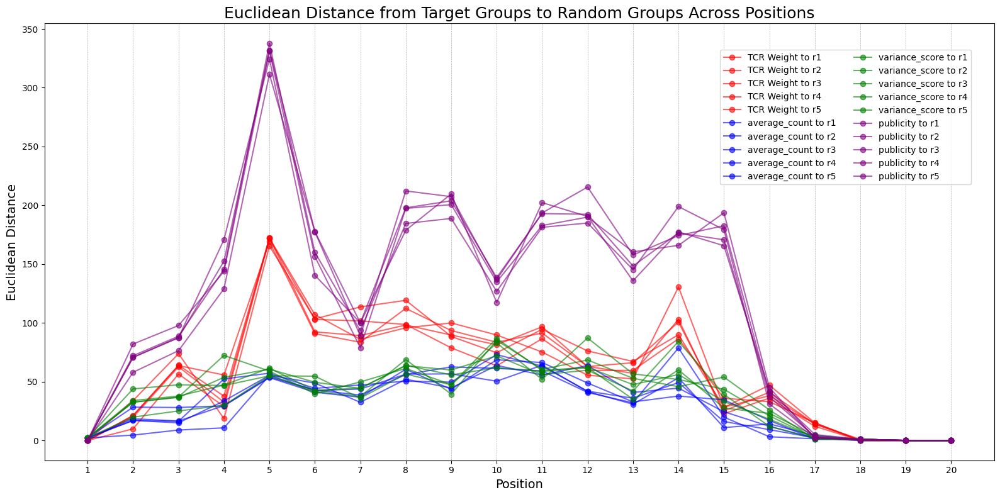

In [ ]:
#########################
# all length
#########################

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance

# Load the CSV file into a DataFrame
file_path = 'f_final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Extract relevant columns
df = df[['amino_acid', 'selection_group']]

# Update group names to match the new naming convention
df['selection_group'] = df['selection_group'].replace({
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity'
})

# Dynamically generate a list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().head(1000) for group in unique_groups}

# Process and remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = groups[group_name][~groups[group_name].str.contains('\*', na=False)].tolist()

def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        if len(seq) >= position:
            aa = seq[position - 1]
            presence_counts[aa] += 1
    return presence_counts

# Define groups of interest with the updated naming
target_groups = ['TCR Weight', 'average_count', 'variance_score', 'publicity']
random_groups = [f'r{i}' for i in range(1, 6)]

# Initialize a dictionary to hold distances
distances = {tg: {rg: [] for rg in random_groups} for tg in target_groups}

# Loop through positions 1 to 20
for position in range(1, 21):
    aa_presence = {group: amino_acid_presence_at_position(seqs, position) for group, seqs in groups.items()}
    data = pd.DataFrame.from_dict(aa_presence, orient='index').fillna(0)

    # Calculate distances from each target group to each random group
    for tg in target_groups:
        for rg, original_rg in zip(random_groups, [f'random_selection_{i}' for i in range(1, 6)]):
            if tg in data.index and original_rg in data.index:
                distance_value = distance.euclidean(data.loc[tg], data.loc[original_rg])
                distances[tg][rg].append(distance_value)

# Plotting the distances
plt.figure(figsize=(16, 8))  # Adjust figure size for better layout

# Define colors for different groups with updated names
colors = {
    'TCR Weight': 'red',
    'average_count': 'blue',
    'variance_score': 'green',
    'publicity': 'purple'
}

# Plot distances for each target group
for tg in target_groups:
    for rg in random_groups:
        plt.plot(range(1, 21), distances[tg][rg], marker='o', label=f'{tg} to {rg}', color=colors[tg], alpha=0.6)

plt.xlabel('Position', fontsize=14)
plt.ylabel('Euclidean Distance', fontsize=14)
plt.title('Euclidean Distance from Target Groups to Random Groups Across Positions', fontsize=18)

# Move legend inside the plot, top right
plt.legend(loc='upper right', fontsize=10, ncol=2, frameon=True, bbox_to_anchor=(0.98, 0.95))

# Set the x-axis grid with a major interval of 1
plt.xticks(range(1, 21))
plt.grid(True, which='both', axis='x', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


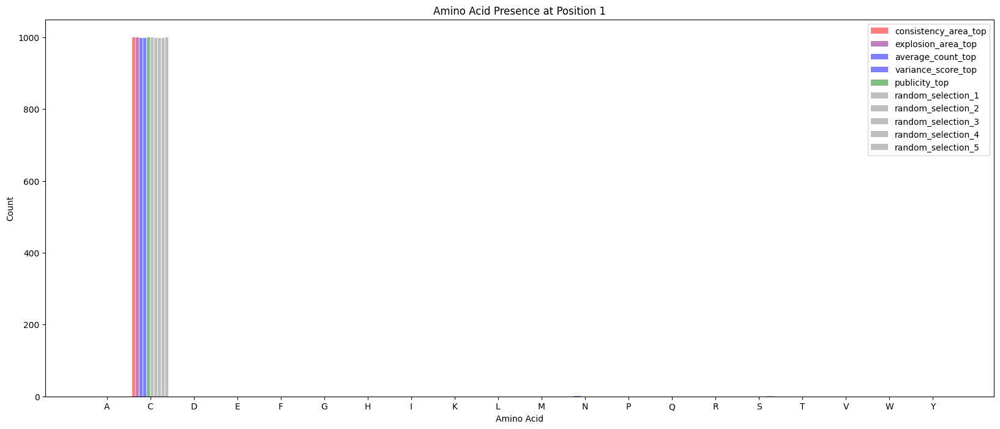

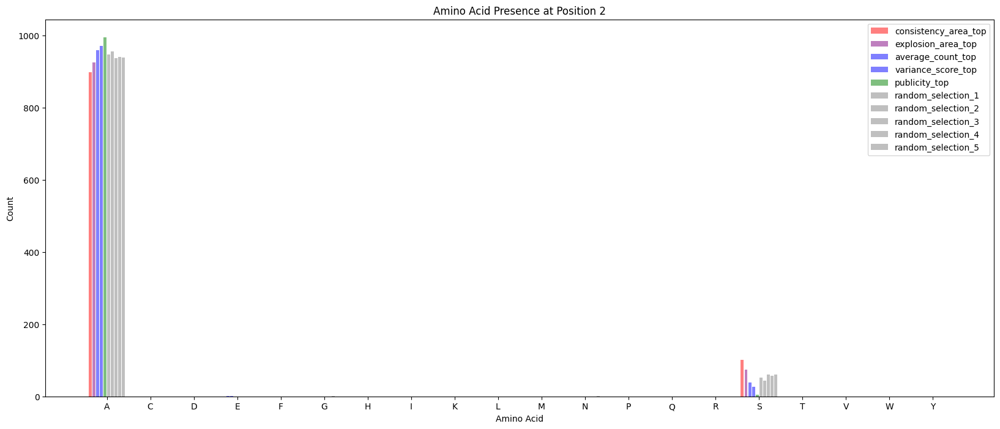

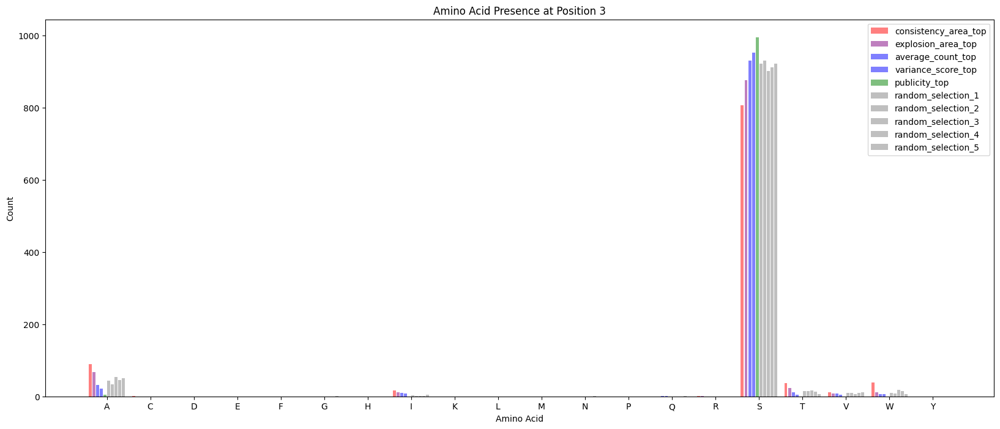

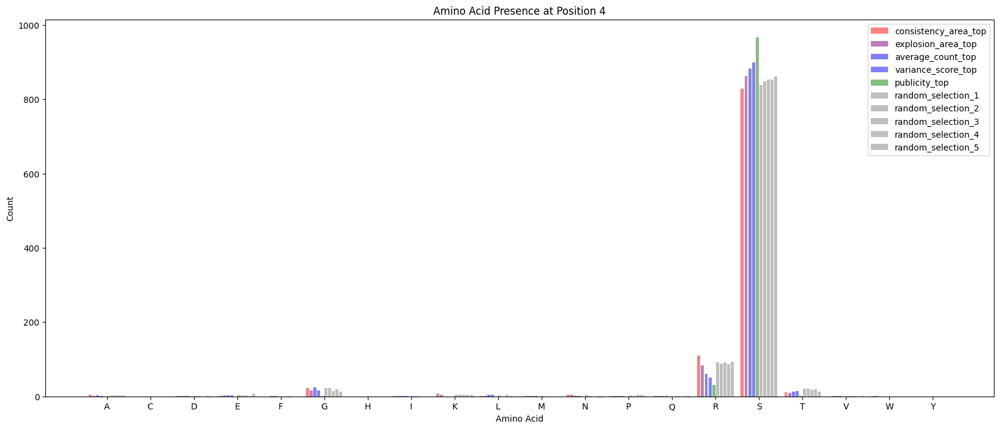

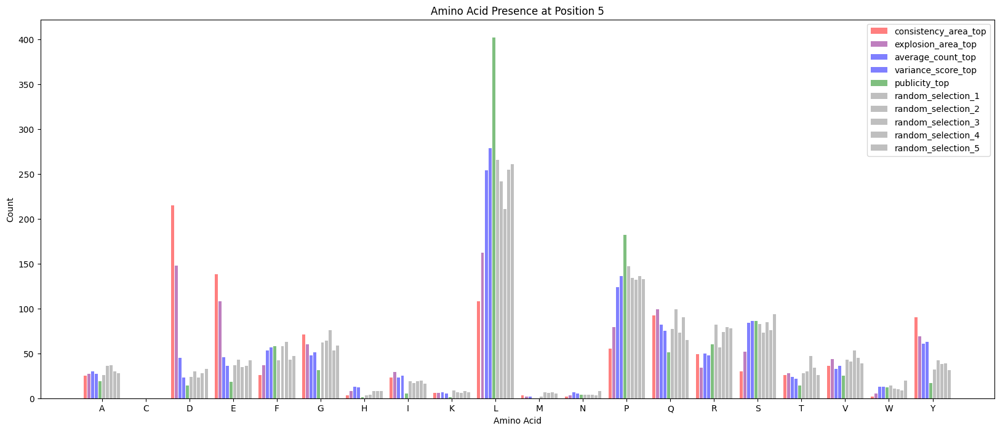

...

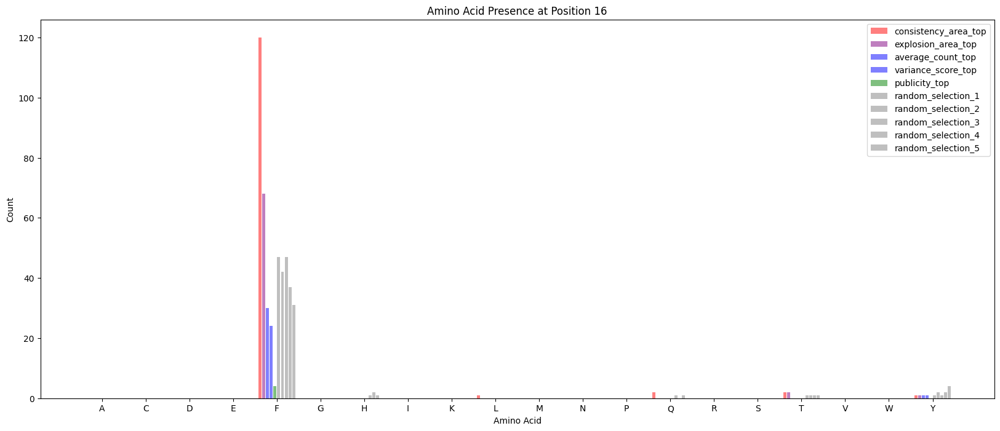

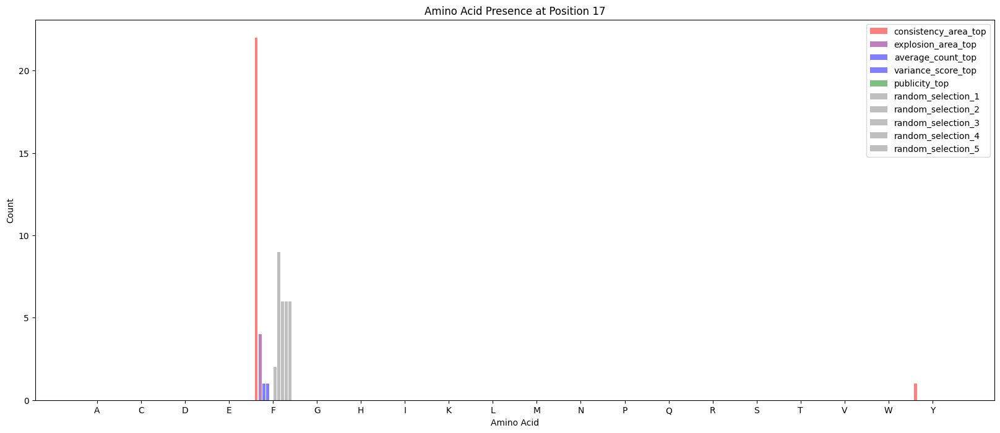

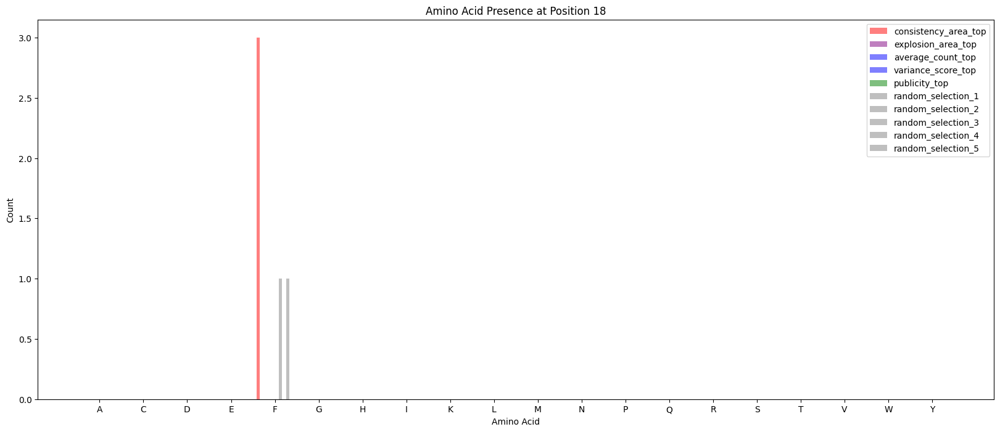

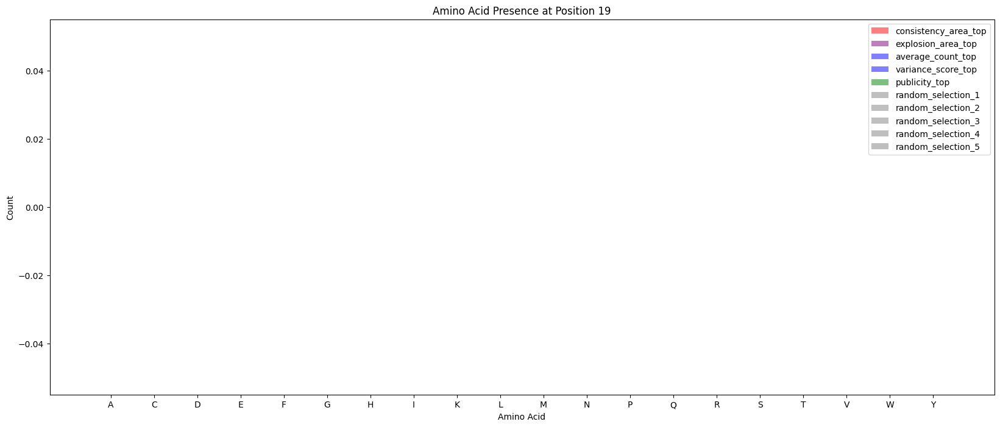

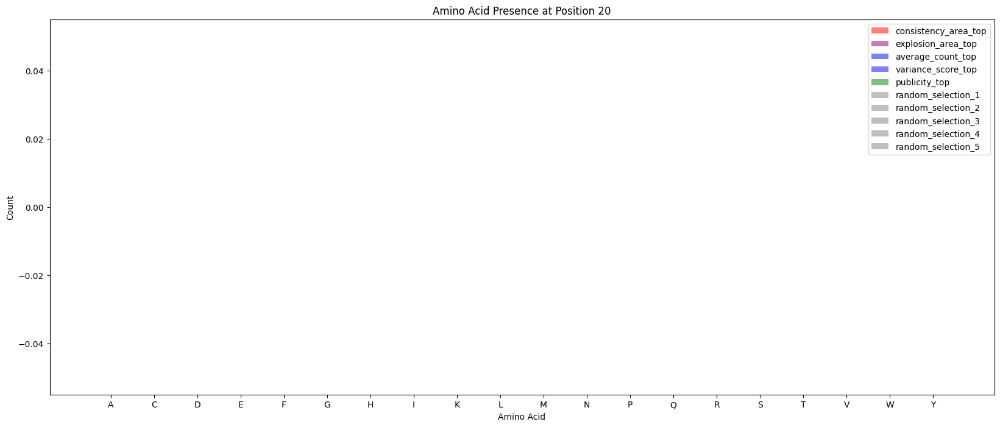

In [ ]:
#########################
# all length
#########################

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the CSV file into a DataFrame
file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)


df = df[df['selection_group'] != 'consistency_area2_top']


# Define the maximum CDR3 length (adjust this based on your data)
max_cdr3_length = 20

# Function to count amino acid presence for a group at a specific position
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        if len(seq) >= position:
            aa = seq[position - 1]
            presence_counts[aa] += 1
    return presence_counts

# Dynamically generate list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().head(1000) for group in unique_groups}

# Process and remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = groups[group_name][~groups[group_name].str.contains('\*', na=False)].tolist()

# Pre-define colors for different groups
colors = {
    'average_count_top': 'blue',
    'explosion_area_top': 'purple',
    'consistency_area_top': 'red',
    #'consistency_area2_top': 'red',
    'variance_score_top': 'blue',
    'publicity_top': 'green'
}
random_group_color = 'grey'  # Use this color for all random groups

# Define the desired order of groups
desired_order = [
    'consistency_area_top',
    #'consistency_area2_top',
    'explosion_area_top',
    'average_count_top',
    'variance_score_top',
    'publicity_top'
]

# Adjust the group names to match the order
ordered_groups = {key: groups[key] for key in desired_order if key in groups}
ordered_groups.update({key: groups[key] for key in groups if 'random_selection' in key})

# Width of each bar and the spacing between groups of bars
bar_width = 0.07
group_spacing = 0.015

# Create a separate plot for each position (location in CDR3)
for position in range(1, max_cdr3_length + 1):
    plt.figure(figsize=(20, 8))

    # Calculate the base x position for each amino acid's group of bars
    base_x_positions = np.arange(len('ACDEFGHIKLMNPQRSTVWY'))

    # Count amino acid presence for each group at the specified position and plot
    for i, (group_name, seqs) in enumerate(ordered_groups.items()):
        aa_counts = amino_acid_presence_at_position(seqs, position)

        # Determine color for the group
        if 'random_selection' in group_name:
            color = random_group_color
        else:
            color = colors.get(group_name, 'grey')  # Default color for other groups if not specified

        # Adjust x positions for this group's bars
        x_positions = base_x_positions + i * (bar_width + group_spacing)

        plt.bar(x_positions, aa_counts.values(), width=bar_width, label=group_name, alpha=0.5, color=color)

    plt.title(f'Amino Acid Presence at Position {position}')
    plt.xlabel('Amino Acid')
    plt.xticks(base_x_positions + (len(ordered_groups) - 1) * (bar_width + group_spacing) / 2, 'ACDEFGHIKLMNPQRSTVWY')
    plt.ylabel('Count')
    plt.legend(loc='upper right')
    plt.show()


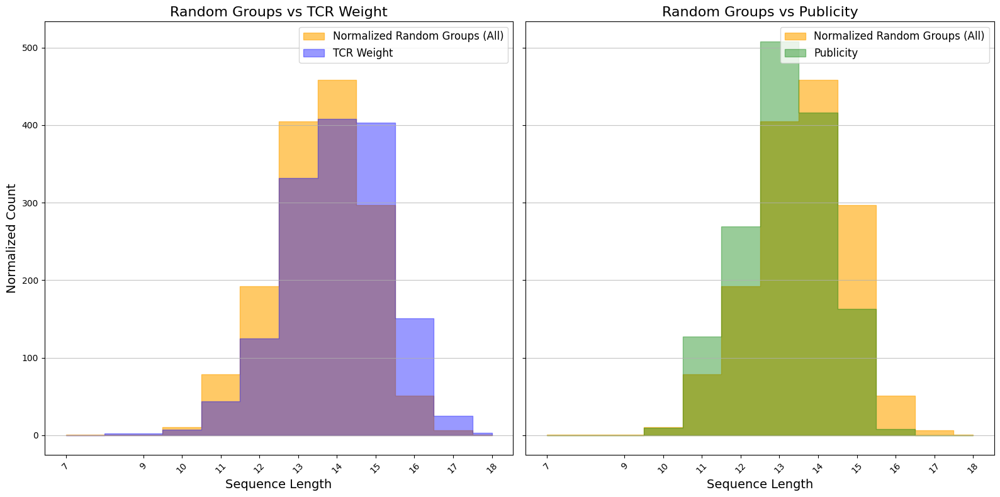

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file into a DataFrame
file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Extract the groups
consistency_group = df[df['selection_group'] == 'consistency_area_top']['amino_acid'].str.len()
random_groups = df[df['selection_group'].str.contains('random_selection')]['amino_acid'].str.len()
publicity_group = df[df['selection_group'] == 'publicity_top']['amino_acid'].str.len()

# Compute the frequency counts for sequence lengths
consistency_counts = consistency_group.value_counts().sort_index()
random_counts = random_groups.value_counts().sort_index() / 5  # Normalize the counts by dividing by 5
publicity_counts = publicity_group.value_counts().sort_index()

# Align all series to the same index for consistent plotting
all_lengths = sorted(
    set(consistency_counts.index).union(set(random_counts.index)).union(set(publicity_counts.index))
)
consistency_counts = consistency_counts.reindex(all_lengths, fill_value=0)
random_counts = random_counts.reindex(all_lengths, fill_value=0)
publicity_counts = publicity_counts.reindex(all_lengths, fill_value=0)

# Plot: Two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

# Subplot 1: Random vs Consistency
axes[0].fill_between(
    random_counts.index, random_counts.values, step='mid',
    label='Normalized Random Groups (All)', alpha=0.6, color='orange'
)
axes[0].fill_between(
    consistency_counts.index, consistency_counts.values, step='mid',
    label='TCR Weight', alpha=0.4, color='blue'
)
axes[0].set_title('Random Groups vs TCR Weight', fontsize=16)
axes[0].set_xlabel('Sequence Length', fontsize=14)
axes[0].set_ylabel('Normalized Count', fontsize=14)
axes[0].legend(fontsize=12)
axes[0].grid(axis='y', alpha=0.75)

# Subplot 2: Random vs Publicity
axes[1].fill_between(
    random_counts.index, random_counts.values, step='mid',
    label='Normalized Random Groups (All)', alpha=0.6, color='orange'
)
axes[1].fill_between(
    publicity_counts.index, publicity_counts.values, step='mid',
    label='Publicity', alpha=0.4, color='green'
)
axes[1].set_title('Random Groups vs Publicity', fontsize=16)
axes[1].set_xlabel('Sequence Length', fontsize=14)
axes[1].legend(fontsize=12)
axes[1].grid(axis='y', alpha=0.75)

# Set x-axis ticks for both subplots
for ax in axes:
    ax.set_xticks(all_lengths)
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


# 14 **length**

Subsampling all groups to 318 sequences.


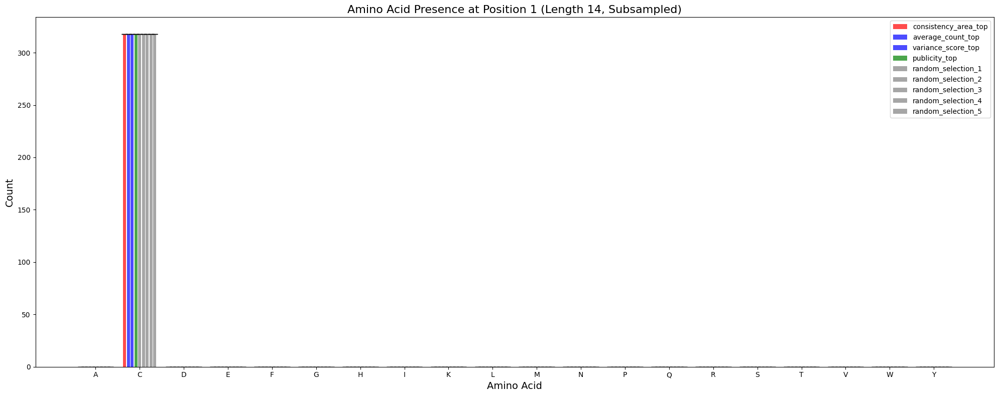

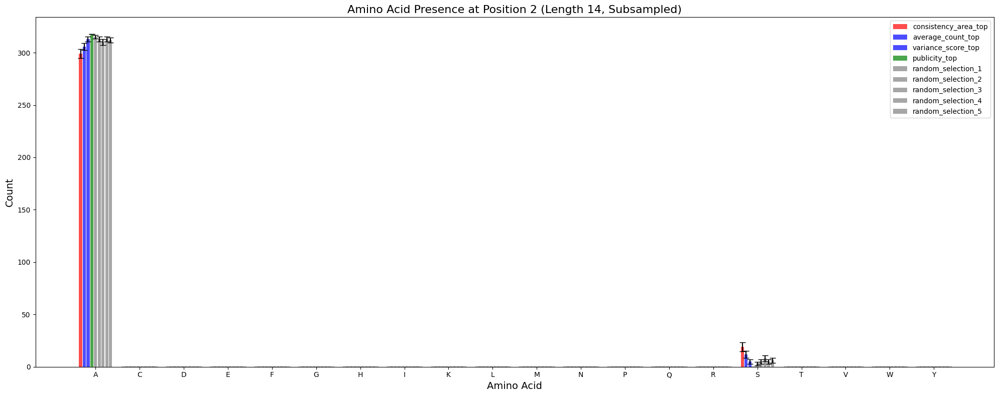

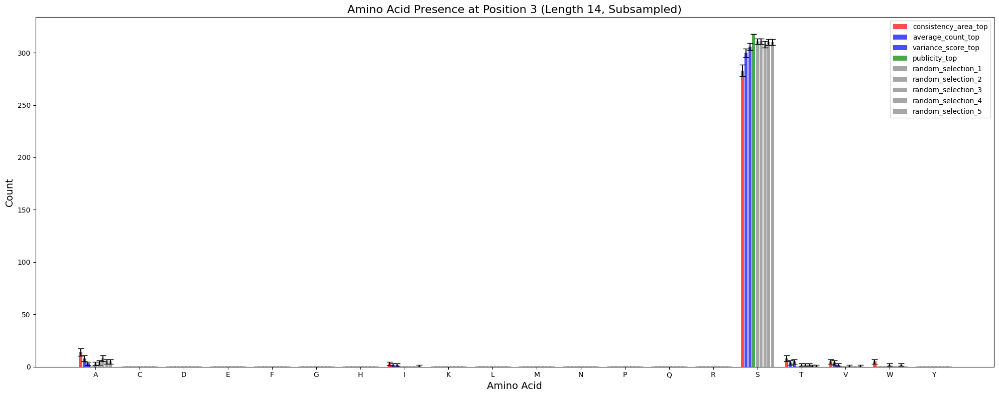

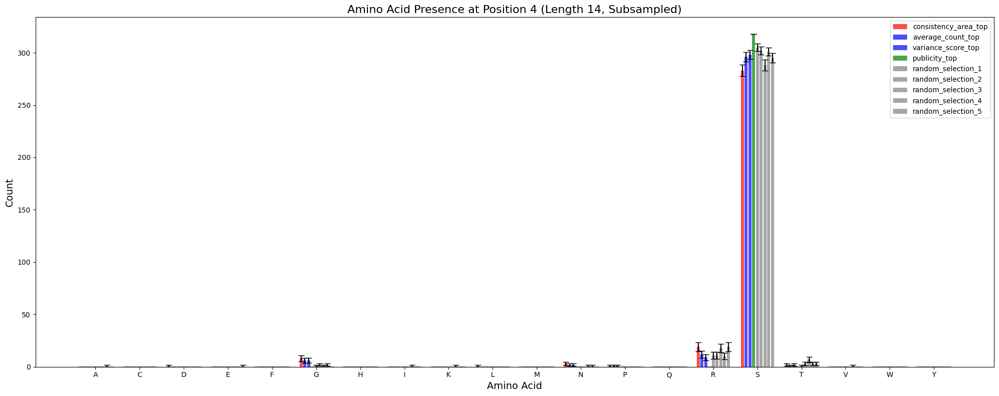

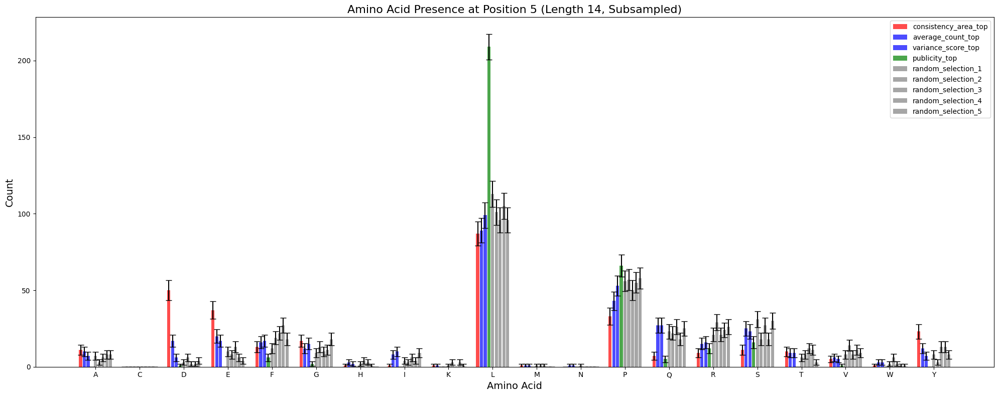

...

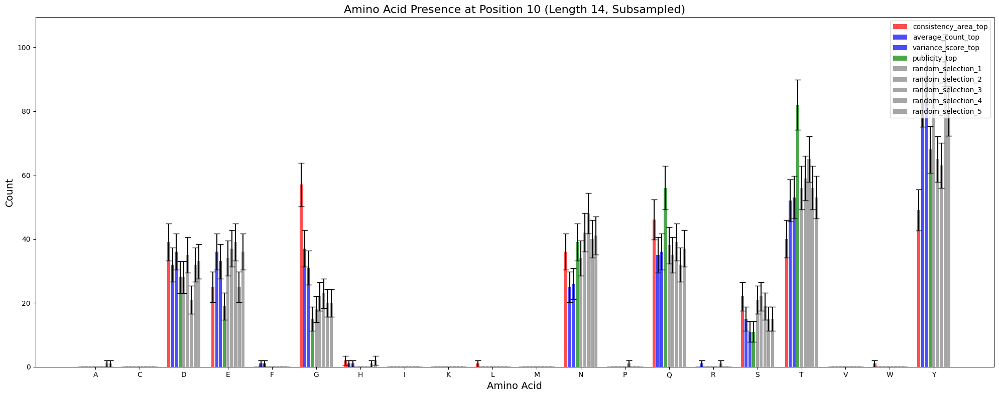

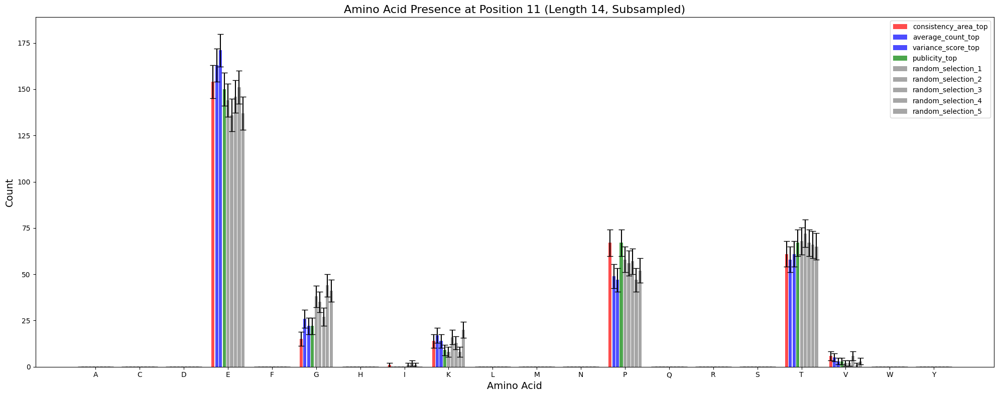

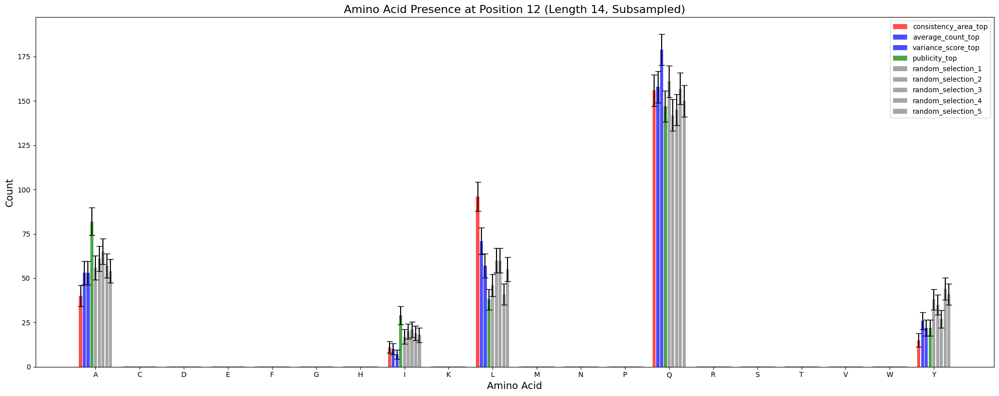

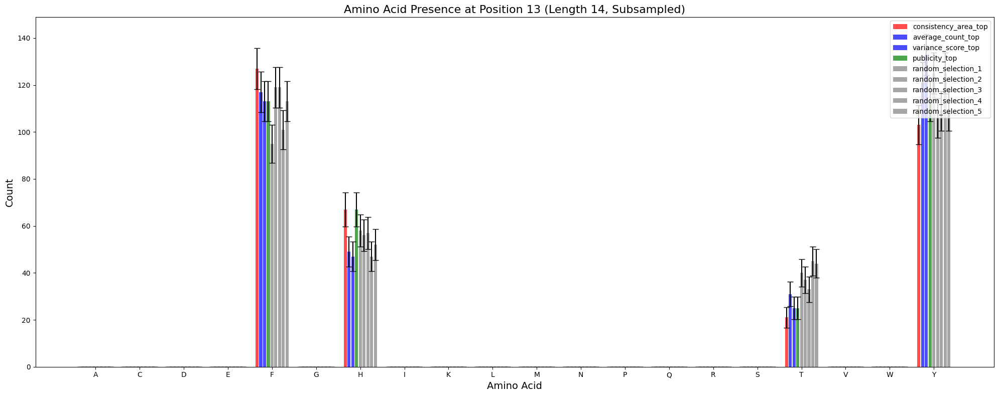

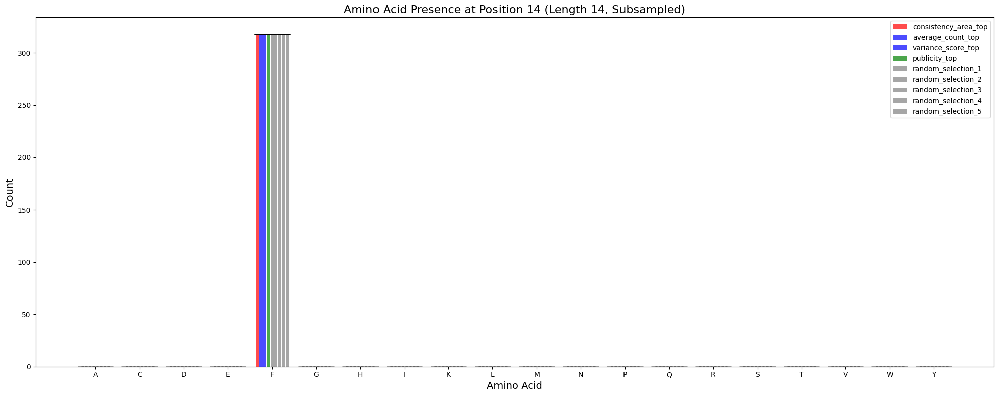

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the CSV file into a DataFrame
file_path = 'f_final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Filter out the 'consistency_area2_top' and 'explosion_area_top' groups and sequences with invalid length
df = df[~df['selection_group'].isin(['consistency_area2_top', 'explosion_area_top'])]
df = df[df['amino_acid'].str.len() == 14]

# Function to count amino acid presence and calculate error bars
def amino_acid_presence_and_error(group_seqs, position, total_sequences):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        aa = seq[position - 1]  # Position is 1-based
        presence_counts[aa] += 1
    # Calculate error bars
    errors = {}
    for aa, count in presence_counts.items():
        p = count / total_sequences
        errors[aa] = np.sqrt(p * (1 - p) / total_sequences) * total_sequences
    return presence_counts, errors

# Dynamically generate list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}

# Process and remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = [seq for seq in groups[group_name] if '*' not in seq]

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.")
for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Pre-define colors for different groups
colors = {
    'average_count_top': 'blue',
    'explosion_area_top': 'purple',
    'consistency_area_top': 'red',
    'variance_score_top': 'blue',
    'publicity_top': 'green'
}
random_group_color = 'grey'  # Use this color for all random groups

# Define the desired order of groups
desired_order = [
    'consistency_area_top',
    'explosion_area_top',
    'average_count_top',
    'variance_score_top',
    'publicity_top'
]

# Adjust the group names to match the order
ordered_groups = {key: groups[key] for key in desired_order if key in groups}
ordered_groups.update({key: groups[key] for key in groups if 'random_selection' in key})

# Width of each bar and the spacing between groups of bars
bar_width = 0.07
group_spacing = 0.015
max_cdr3_length = 14  # Fixed length for the sequences

# Create a separate plot for each position (location in CDR3)
for position in range(1, max_cdr3_length + 1):
    plt.figure(figsize=(20, 8))

    # Calculate the base x position for each amino acid's group of bars
    base_x_positions = np.arange(len('ACDEFGHIKLMNPQRSTVWY'))

    # Count amino acid presence and calculate error bars for each group
    for i, (group_name, seqs) in enumerate(ordered_groups.items()):
        total_sequences = len(seqs)
        aa_counts, aa_errors = amino_acid_presence_and_error(seqs, position, total_sequences)

        # Determine color for the group
        if 'random_selection' in group_name:
            color = random_group_color
        else:
            color = colors.get(group_name, 'grey')  # Default color for other groups if not specified

        # Adjust x positions for this group's bars
        x_positions = base_x_positions + i * (bar_width + group_spacing)

        # Plot bars with error bars
        plt.bar(x_positions, aa_counts.values(), yerr=aa_errors.values(), width=bar_width,
                label=group_name, alpha=0.7, color=color, capsize=4)

    plt.title(f'Amino Acid Presence at Position {position} (Length 14, Subsampled)', fontsize=16)
    plt.xlabel('Amino Acid', fontsize=14)
    plt.xticks(base_x_positions + (len(ordered_groups) - 1) * (bar_width + group_spacing) / 2,
               'ACDEFGHIKLMNPQRSTVWY')
    plt.ylabel('Count', fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.tight_layout()
    plt.show()


Subsampling all groups to 318 sequences.


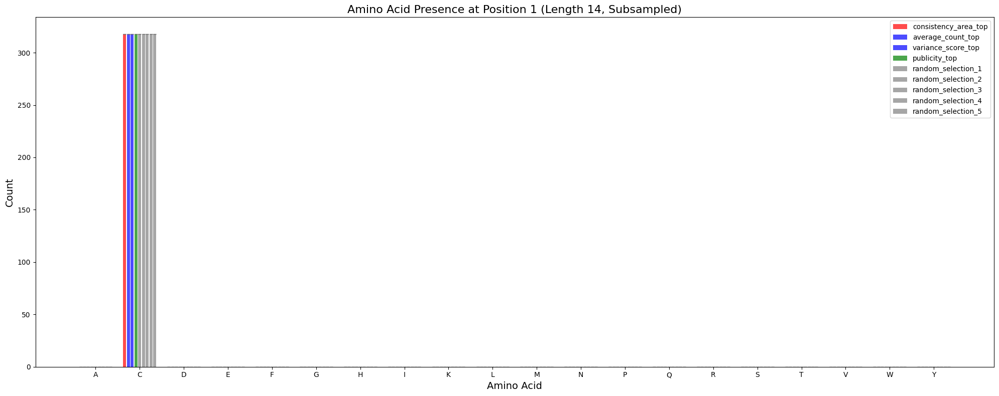

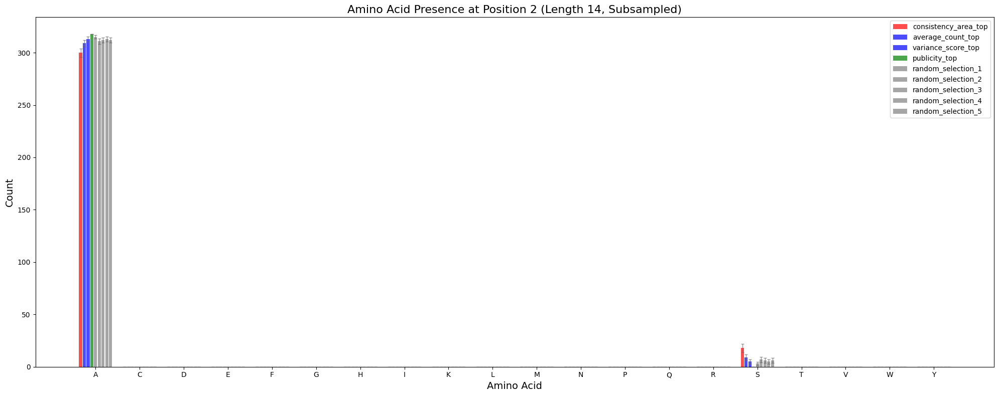

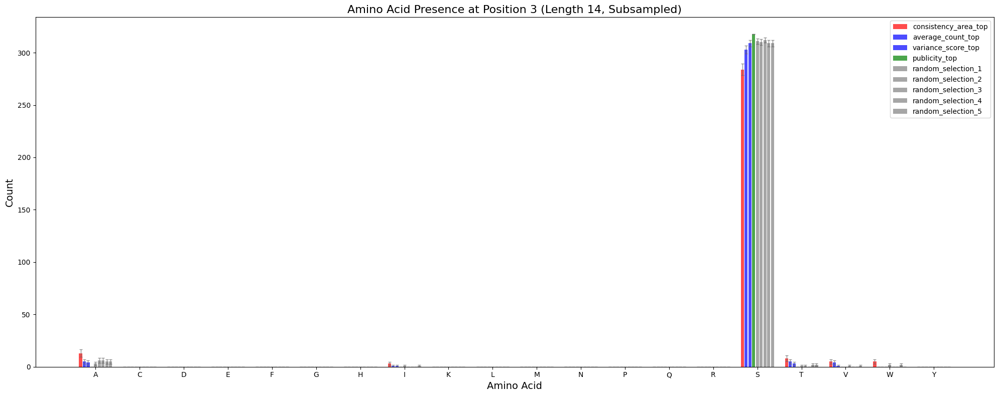

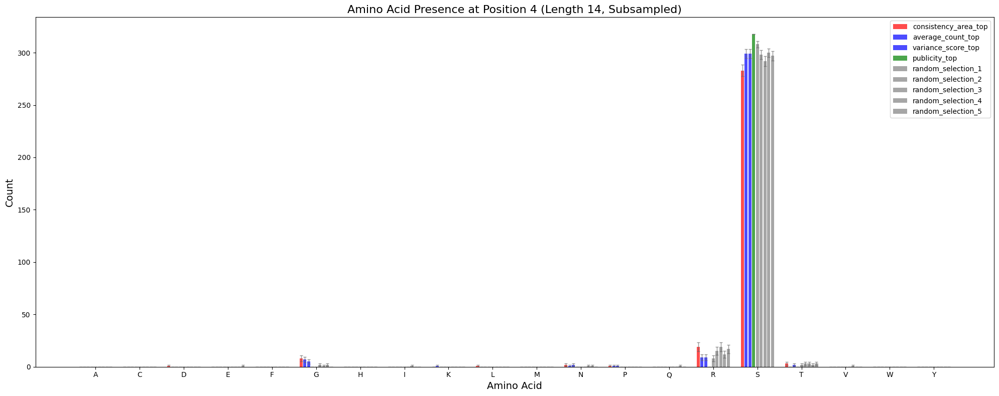

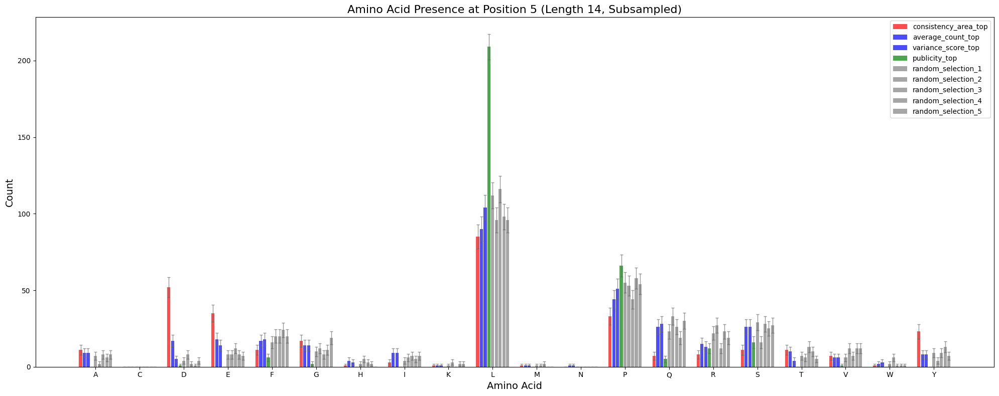

...

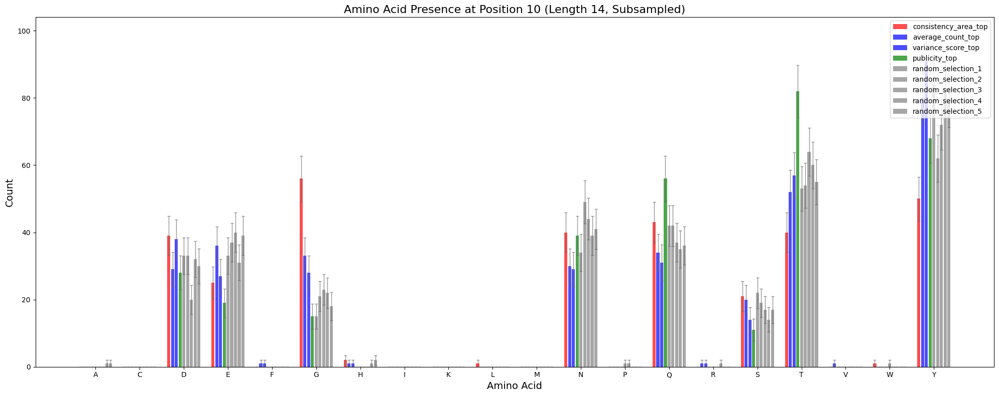

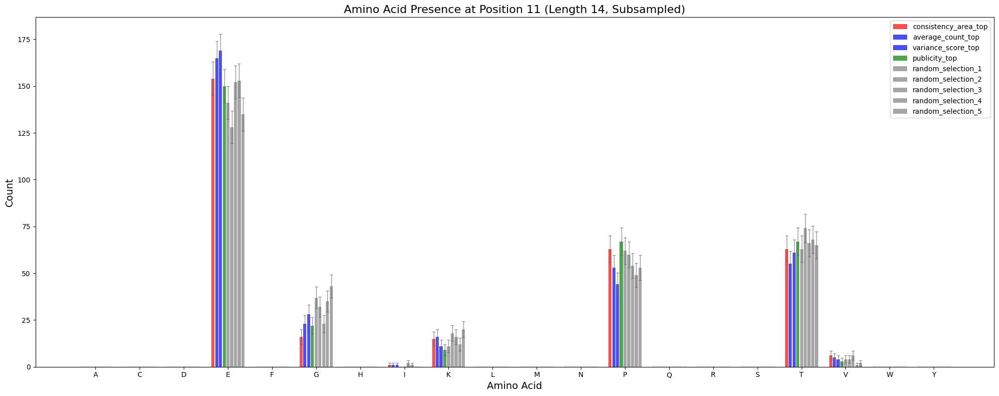

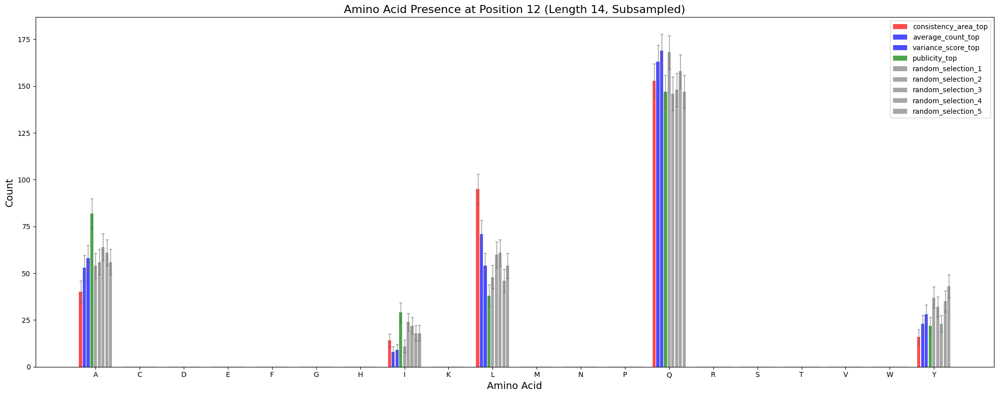

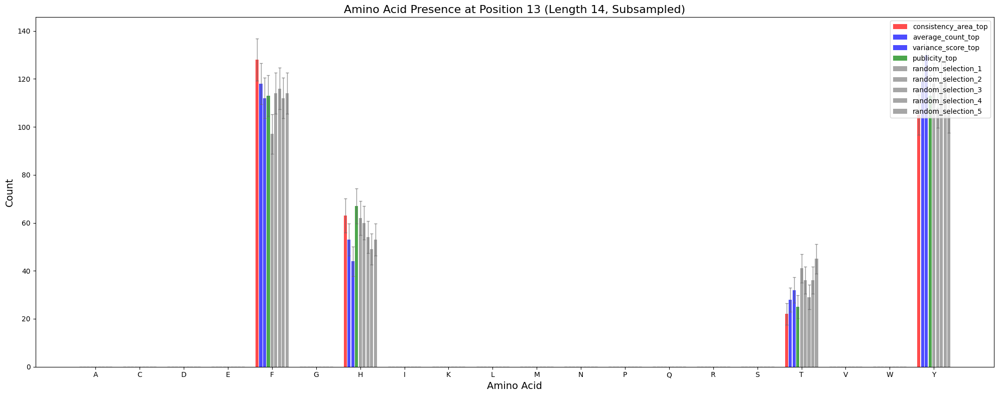

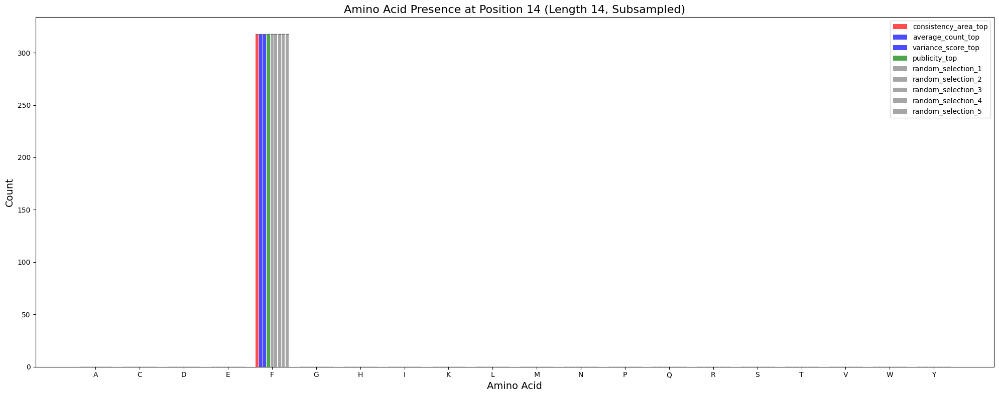

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the CSV file into a DataFrame
file_path = 'f_final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Filter out specific groups and sequences with invalid length
df = df[~df['selection_group'].isin(['consistency_area2_top', 'explosion_area_top'])]
df = df[df['amino_acid'].str.len() == 14]

# Function to count amino acid presence and calculate error bars
def amino_acid_presence_and_error(group_seqs, position, total_sequences):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # All 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        aa = seq[position - 1]  # Position is 1-based
        presence_counts[aa] += 1
    # Calculate error bars
    errors = {}
    for aa, count in presence_counts.items():
        p = count / total_sequences
        errors[aa] = np.sqrt(p * (1 - p) / total_sequences) * total_sequences
    return presence_counts, errors

# Generate list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}

# Remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = [seq for seq in groups[group_name] if '*' not in seq]

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.")
for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Pre-define colors for different groups
colors = {
    'average_count_top': 'blue',
    'explosion_area_top': 'purple',
    'consistency_area_top': 'red',
    'variance_score_top': 'blue',
    'publicity_top': 'green'
}
random_group_color = 'grey'  # Color for all random groups

# Define the desired order of groups
desired_order = [
    'consistency_area_top',
    'explosion_area_top',
    'average_count_top',
    'variance_score_top',
    'publicity_top'
]

# Adjust the group names to match the order
ordered_groups = {key: groups[key] for key in desired_order if key in groups}
ordered_groups.update({key: groups[key] for key in groups if 'random_selection' in key})

# Width of each bar and spacing
bar_width = 0.07
group_spacing = 0.015
max_cdr3_length = 14  # Fixed sequence length

# Create a plot for each position in CDR3
for position in range(1, max_cdr3_length + 1):
    plt.figure(figsize=(20, 8))

    # Base x positions for amino acids
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'
    base_x_positions = np.arange(len(amino_acids))

    # Calculate group offsets for centering
    num_groups = len(ordered_groups)
    total_group_width = num_groups * (bar_width + group_spacing)
    group_offsets = np.linspace(
        -total_group_width / 2 + (bar_width + group_spacing) / 2,
        total_group_width / 2 - (bar_width + group_spacing) / 2,
        num_groups
    )

    # Plot bars for each group
    for i, (group_name, seqs) in enumerate(ordered_groups.items()):
        total_sequences = len(seqs)
        aa_counts, aa_errors = amino_acid_presence_and_error(seqs, position, total_sequences)

        # Determine color
        if 'random_selection' in group_name:
            color = random_group_color
        else:
            color = colors.get(group_name, 'grey')  # Default color if not specified

        # Adjust x positions
        x_positions = base_x_positions + group_offsets[i]

        # Plot bars with adjusted error bar appearance
        plt.bar(
            x_positions,
            list(aa_counts.values()),
            yerr=list(aa_errors.values()),
            width=bar_width,
            label=group_name,
            alpha=0.7,
            color=color,
            capsize=2,  # Reduced cap size
            error_kw={
                'elinewidth': 1,  # Thinner error bar lines
                'ecolor': 'dimgrey',  # Lighter color for error bars
                'alpha': 0.7        # Semi-transparent error bars
            }
        )

    plt.title(f'Amino Acid Presence at Position {position} (Length 14, Subsampled)', fontsize=16)
    plt.xlabel('Amino Acid', fontsize=14)
    plt.xticks(base_x_positions, amino_acids)
    plt.ylabel('Count', fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.tight_layout()
    plt.show()


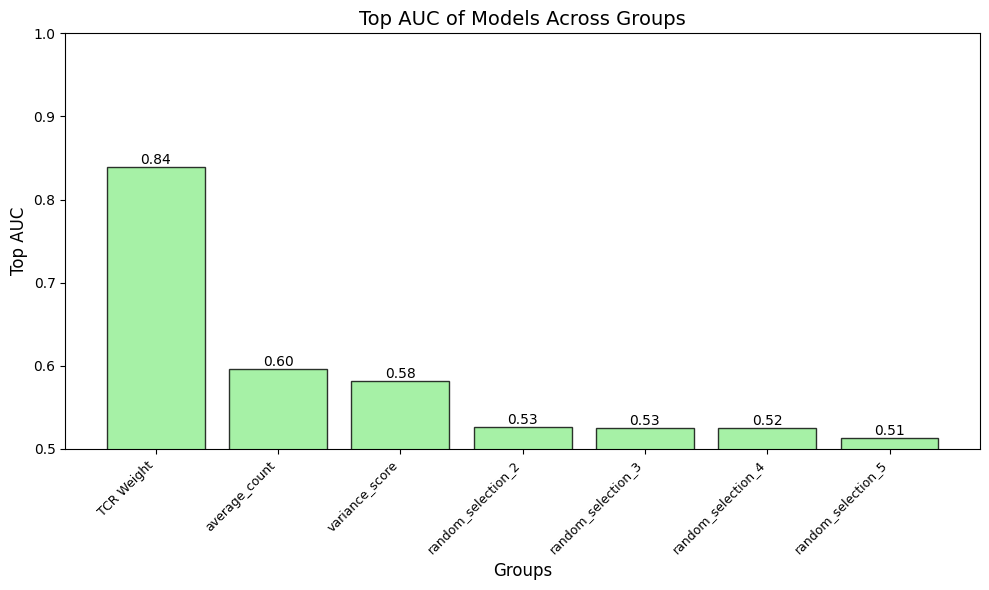

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the file paths
file_paths = {
    'TCR Weight': 'automl_results_consistency_area_top.csv',
    'average_count': 'automl_results_average_count_top.csv',
    'variance_score': 'automl_results_variance_score_top.csv',
    'random_selection_2': 'automl_results_random_selection_2.csv',
    'random_selection_3': 'automl_results_random_selection_3.csv',
    'random_selection_4': 'automl_results_random_selection_4.csv',
    'random_selection_5': 'automl_results_random_selection_5.csv'
}

# Extract the top AUC values for each group
top_auc_values = {}

for group_name, file_path in file_paths.items():
    df = pd.read_csv(file_path)
    top_auc = df['auc'].max()
    top_auc_values[group_name] = top_auc

# Create a bar plot
group_names = list(top_auc_values.keys())
auc_values = list(top_auc_values.values())

plt.figure(figsize=(10, 6))
bars = plt.bar(group_names, auc_values, color='lightgreen', alpha=0.8, edgecolor='black')
plt.ylim(0.5, 1.0)  # Set y-axis limits
plt.title('Top AUC of Models Across Groups', fontsize=14)
plt.ylabel('Top AUC', fontsize=12)
plt.xlabel('Groups', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=9)

# Add values on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.2f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


Subsampling all groups to 408 sequences.


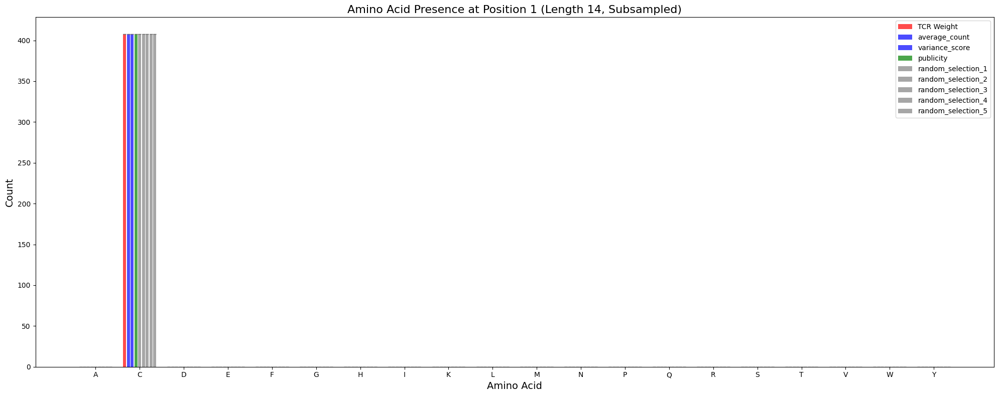

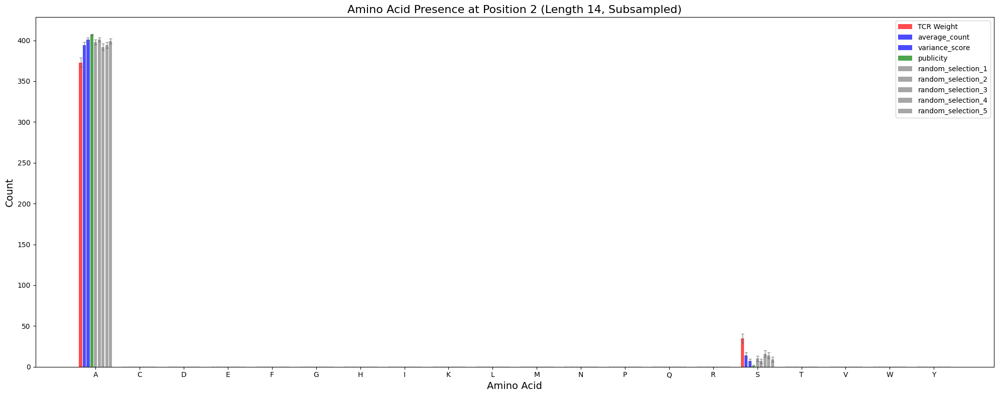

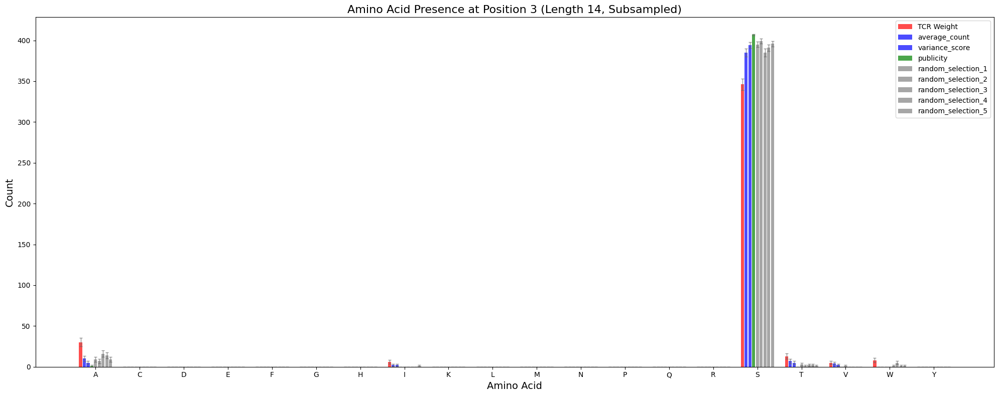

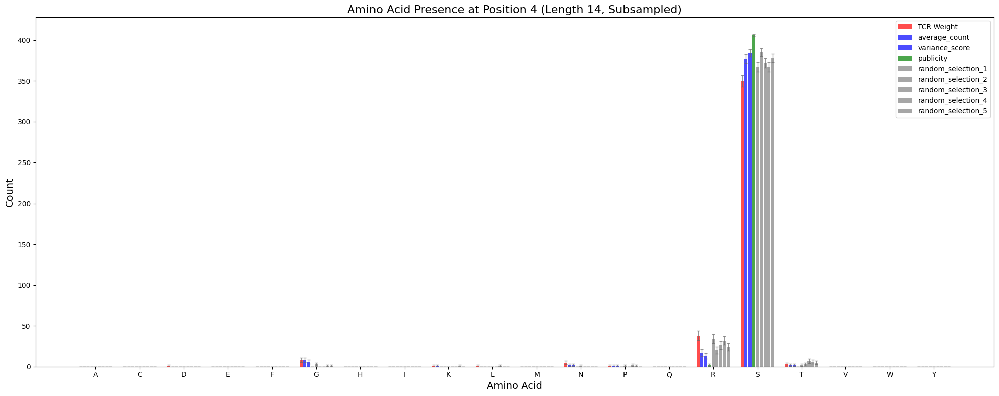

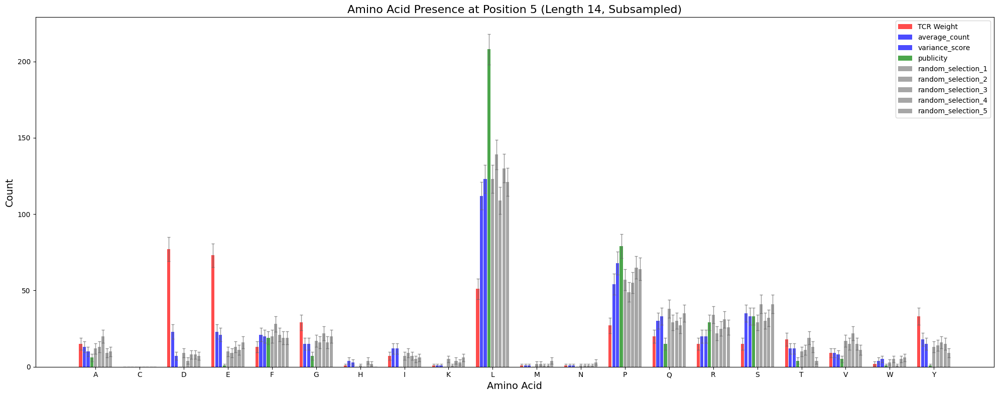

...

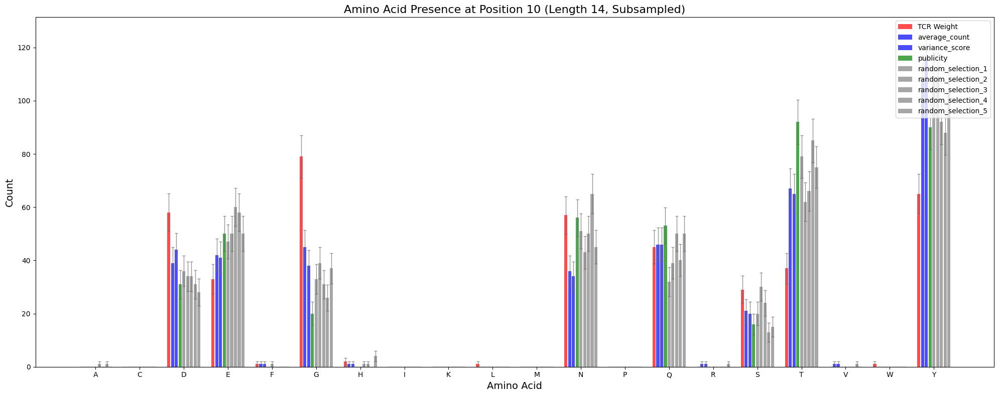

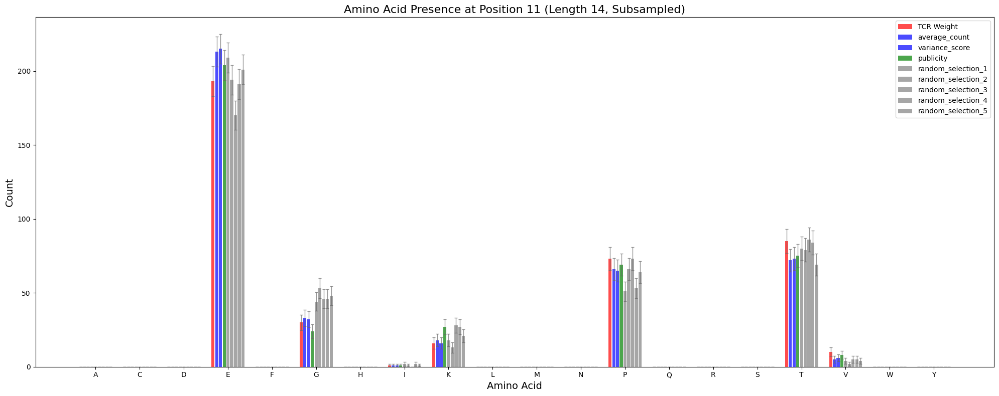

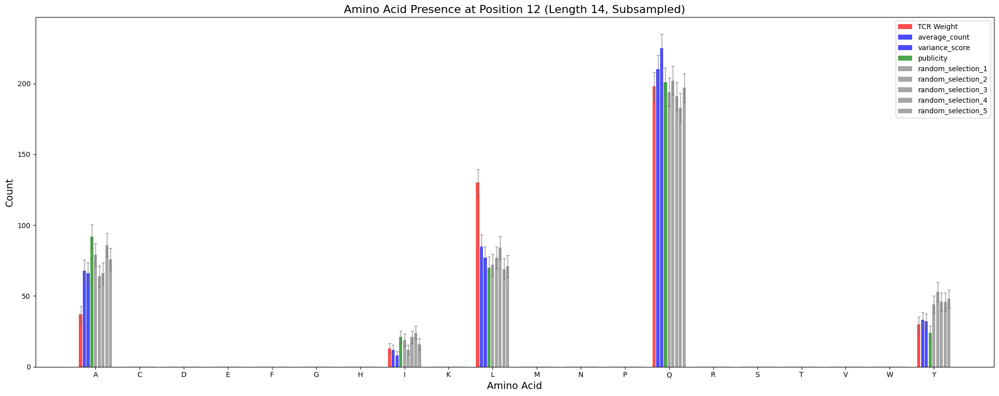

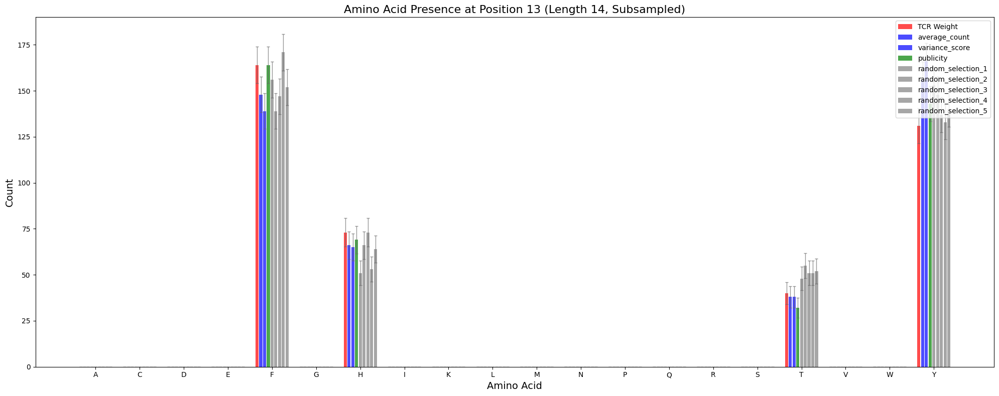

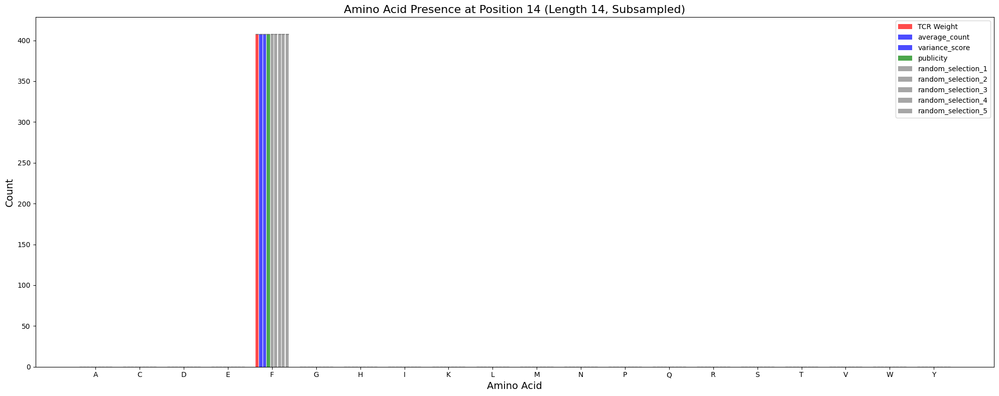

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the CSV file into a DataFrame
file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Update group names to match the new naming convention
df['selection_group'] = df['selection_group'].replace({
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity'
})

# Filter out specific groups and sequences with invalid length
df = df[~df['selection_group'].isin(['consistency_area2_top', 'explosion_area_top'])]
df = df[df['amino_acid'].str.len() == 14]

# Function to count amino acid presence and calculate error bars
def amino_acid_presence_and_error(group_seqs, position, total_sequences):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # All 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        aa = seq[position - 1]  # Position is 1-based
        presence_counts[aa] += 1
    # Calculate error bars
    errors = {}
    for aa, count in presence_counts.items():
        p = count / total_sequences
        errors[aa] = np.sqrt(p * (1 - p) / total_sequences) * total_sequences
    return presence_counts, errors

# Generate list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}

# Remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = [seq for seq in groups[group_name] if '*' not in seq]

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.")
for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Pre-define colors for different groups
colors = {
    'TCR Weight': 'red',
    'average_count': 'blue',
    'variance_score': 'blue',
    'publicity': 'green'
}
random_group_color = 'grey'  # Color for all random groups

# Define the desired order of groups
desired_order = [
    'TCR Weight',
    'average_count',
    'variance_score',
    'publicity'
]

# Adjust the group names to match the order
ordered_groups = {key: groups[key] for key in desired_order if key in groups}
ordered_groups.update({key: groups[key] for key in groups if 'random_selection' in key})

# Width of each bar and spacing
bar_width = 0.07
group_spacing = 0.015
max_cdr3_length = 14  # Fixed sequence length

# Create a plot for each position in CDR3
for position in range(1, max_cdr3_length + 1):
    plt.figure(figsize=(20, 8))

    # Base x positions for amino acids
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'
    base_x_positions = np.arange(len(amino_acids))

    # Calculate group offsets for centering
    num_groups = len(ordered_groups)
    total_group_width = num_groups * (bar_width + group_spacing)
    group_offsets = np.linspace(
        -total_group_width / 2 + (bar_width + group_spacing) / 2,
        total_group_width / 2 - (bar_width + group_spacing) / 2,
        num_groups
    )

    # Plot bars for each group
    for i, (group_name, seqs) in enumerate(ordered_groups.items()):
        total_sequences = len(seqs)
        aa_counts, aa_errors = amino_acid_presence_and_error(seqs, position, total_sequences)

        # Determine color
        if 'random_selection' in group_name:
            color = random_group_color
        else:
            color = colors.get(group_name, 'grey')  # Default color if not specified

        # Adjust x positions
        x_positions = base_x_positions + group_offsets[i]

        # Plot bars with adjusted error bar appearance
        plt.bar(
            x_positions,
            list(aa_counts.values()),
            yerr=list(aa_errors.values()),
            width=bar_width,
            label=group_name,
            alpha=0.7,
            color=color,
            capsize=2,  # Reduced cap size
            error_kw={
                'elinewidth': 1,  # Thinner error bar lines
                'ecolor': 'dimgrey',  # Lighter color for error bars
                'alpha': 0.7        # Semi-transparent error bars
            }
        )

    plt.title(f'Amino Acid Presence at Position {position} (Length 14, Subsampled)', fontsize=16)
    plt.xlabel('Amino Acid', fontsize=14)
    plt.xticks(base_x_positions, amino_acids)
    plt.ylabel('Count', fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.tight_layout()
    plt.show()


In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the CSV file into a DataFrame
file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Create output directory for plots
output_dir = 'plots_amino_acid_presence'
os.makedirs(output_dir, exist_ok=True)

# Update group names to match the new naming convention
df['selection_group'] = df['selection_group'].replace({
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity'
})

# Filter out specific groups and sequences with invalid length
df = df[~df['selection_group'].isin(['consistency_area2_top', 'explosion_area_top'])]
df = df[df['amino_acid'].str.len() == 14]

# Function to count amino acid presence and calculate error bars
def amino_acid_presence_and_error(group_seqs, position, total_sequences):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # All 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        aa = seq[position - 1]  # Position is 1-based
        presence_counts[aa] += 1
    # Calculate error bars
    errors = {}
    for aa, count in presence_counts.items():
        p = count / total_sequences
        errors[aa] = np.sqrt(p * (1 - p) / total_sequences) * total_sequences
    return presence_counts, errors

# Generate list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}

# Remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = [seq for seq in groups[group_name] if '*' not in seq]

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.")
for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Pre-define colors for different groups
colors = {
    'TCR Weight': 'red',
    'average_count': 'blue',
    'variance_score': 'blue',
    'publicity': 'green'
}
random_group_color = 'grey'  # Color for all random groups

# Define the desired order of groups
desired_order = [
    'TCR Weight',
    'average_count',
    'variance_score',
    'publicity'
]

# Adjust the group names to match the order
ordered_groups = {key: groups[key] for key in desired_order if key in groups}
ordered_groups.update({key: groups[key] for key in groups if 'random_selection' in key})

# Width of each bar and spacing
bar_width = 0.07
group_spacing = 0.015
max_cdr3_length = 14  # Fixed sequence length

# Create a plot for each position in CDR3 and save them
for position in range(1, max_cdr3_length + 1):
    plt.figure(figsize=(20, 8))

    # Base x positions for amino acids
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'
    base_x_positions = np.arange(len(amino_acids))

    # Calculate group offsets for centering
    num_groups = len(ordered_groups)
    total_group_width = num_groups * (bar_width + group_spacing)
    group_offsets = np.linspace(
        -total_group_width / 2 + (bar_width + group_spacing) / 2,
        total_group_width / 2 - (bar_width + group_spacing) / 2,
        num_groups
    )

    # Plot bars for each group
    for i, (group_name, seqs) in enumerate(ordered_groups.items()):
        total_sequences = len(seqs)
        aa_counts, aa_errors = amino_acid_presence_and_error(seqs, position, total_sequences)

        # Determine color
        if 'random_selection' in group_name:
            color = random_group_color
        else:
            color = colors.get(group_name, 'grey')  # Default color if not specified

        # Adjust x positions
        x_positions = base_x_positions + group_offsets[i]

        # Plot bars with adjusted error bar appearance
        plt.bar(
            x_positions,
            list(aa_counts.values()),
            yerr=list(aa_errors.values()),
            width=bar_width,
            label=group_name,
            alpha=0.7,
            color=color,
            capsize=2,  # Reduced cap size
            error_kw={
                'elinewidth': 1,  # Thinner error bar lines
                'ecolor': 'dimgrey',  # Lighter color for error bars
                'alpha': 0.7        # Semi-transparent error bars
            }
        )

    plt.title(f'Amino Acid Presence at Position {position} (Length 14, Subsampled)', fontsize=16)
    plt.xlabel('Amino Acid', fontsize=14)
    plt.xticks(base_x_positions, amino_acids)
    plt.ylabel('Count', fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.tight_layout()

    # Save the figure
    output_file = os.path.join(output_dir, f'amino_acid_position_{position}.png')
    plt.savefig(output_file, dpi=300)
    plt.close()

    print(f"Saved plot: {output_file}")

print("All plots saved successfully.")


Subsampling all groups to 408 sequences.
Saved plot: plots_amino_acid_presence/amino_acid_position_1.png
Saved plot: plots_amino_acid_presence/amino_acid_position_2.png
Saved plot: plots_amino_acid_presence/amino_acid_position_3.png
Saved plot: plots_amino_acid_presence/amino_acid_position_4.png
Saved plot: plots_amino_acid_presence/amino_acid_position_5.png
Saved plot: plots_amino_acid_presence/amino_acid_position_6.png
Saved plot: plots_amino_acid_presence/amino_acid_position_7.png
Saved plot: plots_amino_acid_presence/amino_acid_position_8.png
Saved plot: plots_amino_acid_presence/amino_acid_position_9.png
Saved plot: plots_amino_acid_presence/amino_acid_position_10.png
Saved plot: plots_amino_acid_presence/amino_acid_position_11.png
Saved plot: plots_amino_acid_presence/amino_acid_position_12.png
Saved plot: plots_amino_acid_presence/amino_acid_position_13.png
Saved plot: plots_amino_acid_presence/amino_acid_position_14.png
All plots saved successfully.


In [2]:
import shutil

# Define folder and zip file names
folder_to_zip = "plots_amino_acid_presence"
zip_filename = "plots_amino_acid_presence.zip"

# Zip the folder
shutil.make_archive(zip_filename.replace(".zip", ""), 'zip', folder_to_zip)

# Provide a download link
from google.colab import files
files.download(zip_filename)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Subsampling all groups to 318 sequences.


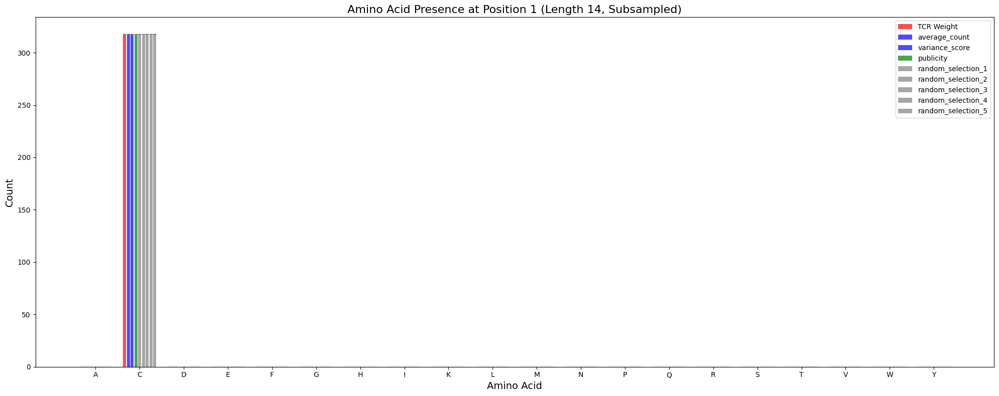

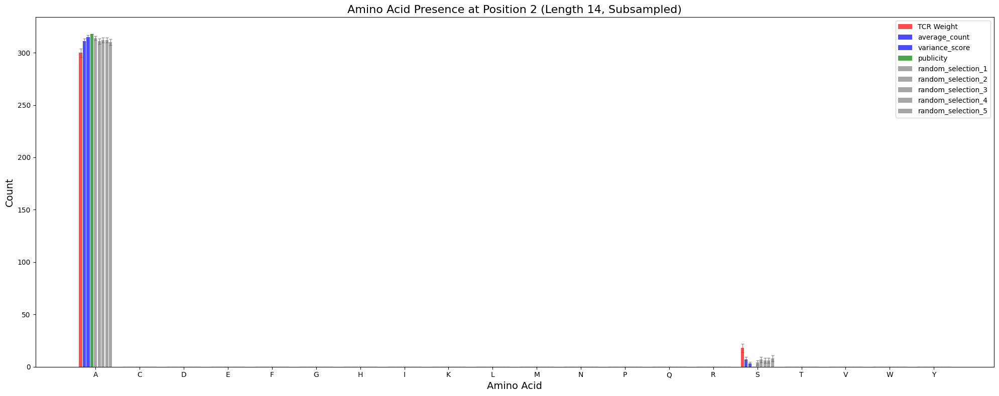

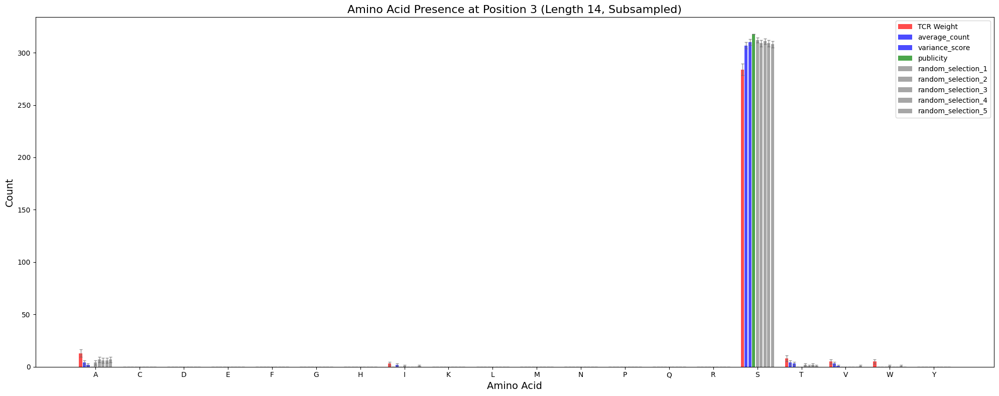

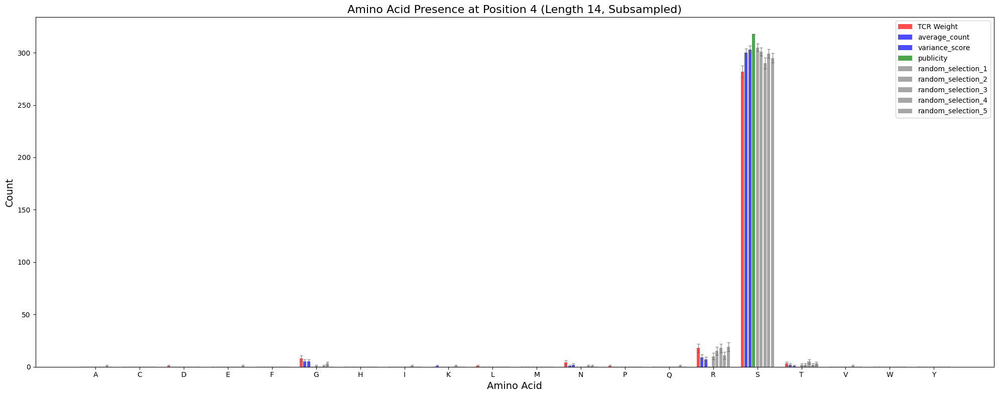

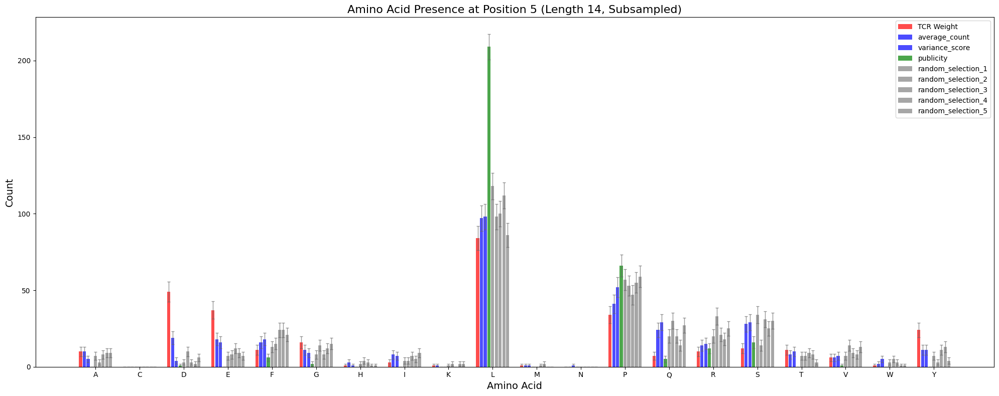

...

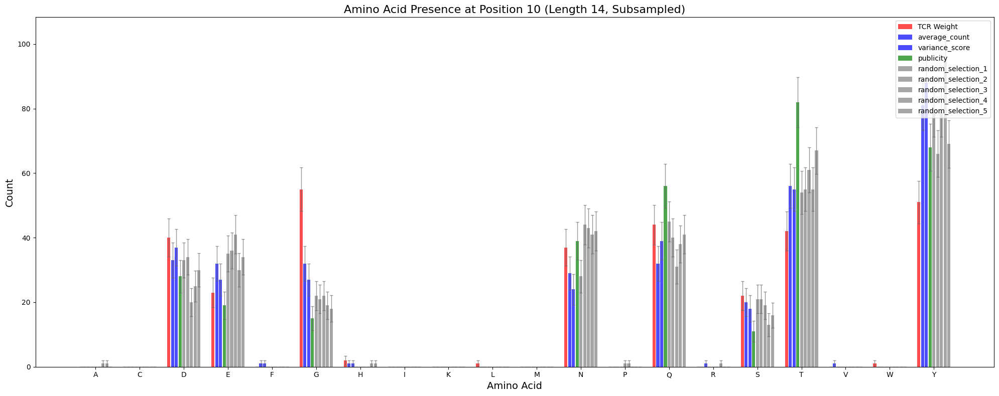

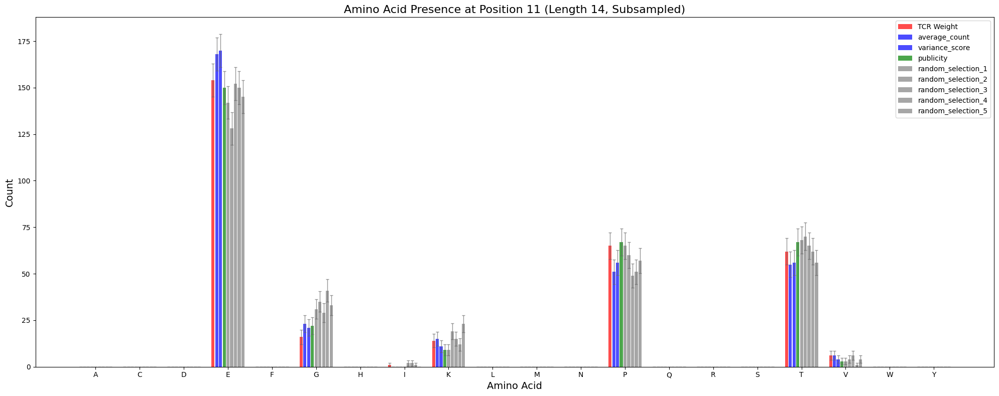

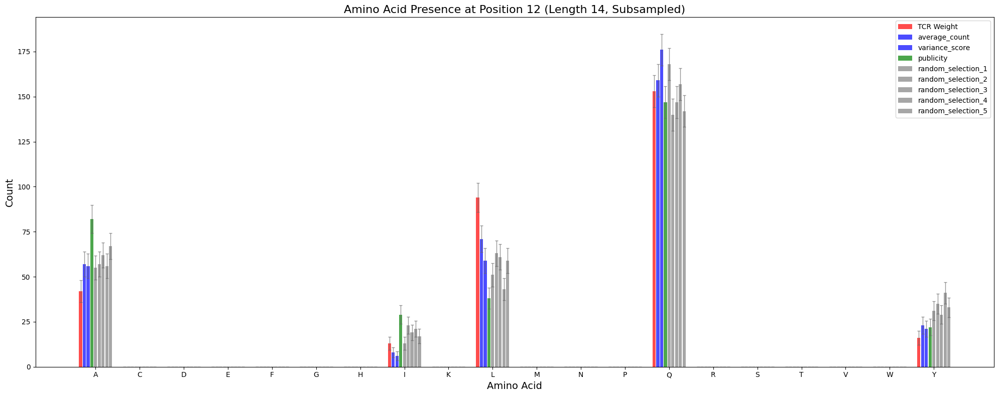

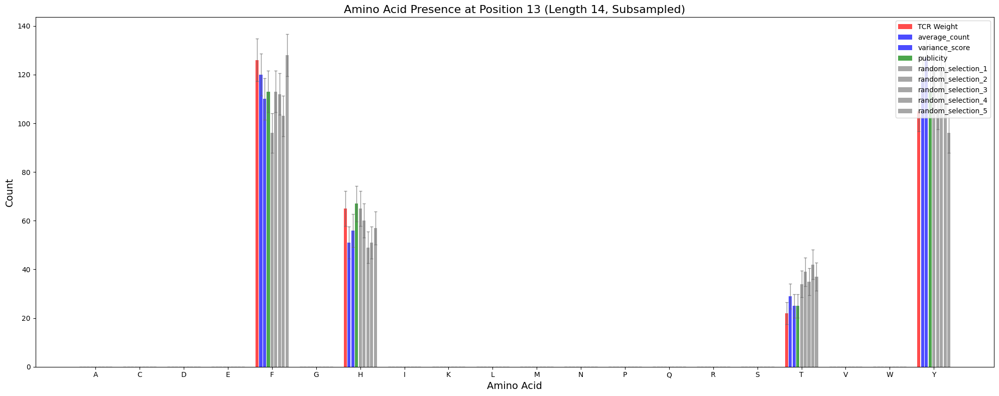

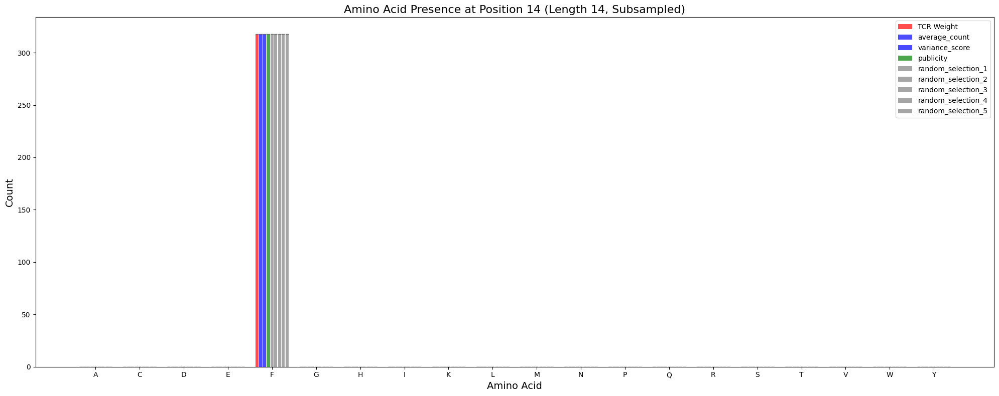

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the CSV file into a DataFrame
file_path = 'f_final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Update group names to match the new naming convention
df['selection_group'] = df['selection_group'].replace({
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity'
})

# Filter out specific groups and sequences with invalid length
df = df[~df['selection_group'].isin(['consistency_area2_top', 'explosion_area_top'])]
df = df[df['amino_acid'].str.len() == 14]

# Function to count amino acid presence and calculate error bars
def amino_acid_presence_and_error(group_seqs, position, total_sequences):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # All 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        aa = seq[position - 1]  # Position is 1-based
        presence_counts[aa] += 1
    # Calculate error bars
    errors = {}
    for aa, count in presence_counts.items():
        p = count / total_sequences
        errors[aa] = np.sqrt(p * (1 - p) / total_sequences) * total_sequences
    return presence_counts, errors

# Generate list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}

# Remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = [seq for seq in groups[group_name] if '*' not in seq]

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.")
for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Pre-define colors for different groups
colors = {
    'TCR Weight': 'red',
    'average_count': 'blue',
    'variance_score': 'blue',
    'publicity': 'green'
}
random_group_color = 'grey'  # Color for all random groups

# Define the desired order of groups
desired_order = [
    'TCR Weight',
    'average_count',
    'variance_score',
    'publicity'
]

# Adjust the group names to match the order
ordered_groups = {key: groups[key] for key in desired_order if key in groups}
ordered_groups.update({key: groups[key] for key in groups if 'random_selection' in key})

# Width of each bar and spacing
bar_width = 0.07
group_spacing = 0.015
max_cdr3_length = 14  # Fixed sequence length

# Create a plot for each position in CDR3
for position in range(1, max_cdr3_length + 1):
    plt.figure(figsize=(20, 8))

    # Base x positions for amino acids
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'
    base_x_positions = np.arange(len(amino_acids))

    # Calculate group offsets for centering
    num_groups = len(ordered_groups)
    total_group_width = num_groups * (bar_width + group_spacing)
    group_offsets = np.linspace(
        -total_group_width / 2 + (bar_width + group_spacing) / 2,
        total_group_width / 2 - (bar_width + group_spacing) / 2,
        num_groups
    )

    # Plot bars for each group
    for i, (group_name, seqs) in enumerate(ordered_groups.items()):
        total_sequences = len(seqs)
        aa_counts, aa_errors = amino_acid_presence_and_error(seqs, position, total_sequences)

        # Determine color
        if 'random_selection' in group_name:
            color = random_group_color
        else:
            color = colors.get(group_name, 'grey')  # Default color if not specified

        # Adjust x positions
        x_positions = base_x_positions + group_offsets[i]

        # Plot bars with adjusted error bar appearance
        plt.bar(
            x_positions,
            list(aa_counts.values()),
            yerr=list(aa_errors.values()),
            width=bar_width,
            label=group_name,
            alpha=0.7,
            color=color,
            capsize=2,  # Reduced cap size
            error_kw={
                'elinewidth': 1,  # Thinner error bar lines
                'ecolor': 'dimgrey',  # Lighter color for error bars
                'alpha': 0.7        # Semi-transparent error bars
            }
        )

    plt.title(f'Amino Acid Presence at Position {position} (Length 14, Subsampled)', fontsize=16)
    plt.xlabel('Amino Acid', fontsize=14)
    plt.xticks(base_x_positions, amino_acids)
    plt.ylabel('Count', fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.tight_layout()
    plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Load the CSV file into a DataFrame
file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Filter out the 'consistency_area2_top' and 'explosion_area_top' groups and sequences with invalid length
df = df[~df['selection_group'].isin(['consistency_area2_top', 'explosion_area_top'])]
df = df[df['amino_acid'].str.len() == 14]

# Focus on position 5
position = 5

def extract_position_counts(sequences, position):
    """
    Extract amino acid counts at a specific position from sequences.
    """
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'
    counts = {aa: 0 for aa in amino_acids}
    for seq in sequences:
        aa = seq[position - 1]  # Position is 1-based
        counts[aa] += 1
    return counts

# Extract data for each group
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}

# Pre-define target groups and random groups
target_groups = ['consistency_area_top', 'average_count_top', 'variance_score_top', 'publicity_top']
random_groups = [group for group in groups if 'random_selection' in group]

# Extract position counts for each group
target_counts = {group: extract_position_counts(groups[group], position) for group in target_groups}
random_counts = {group: extract_position_counts(groups[group], position) for group in random_groups}

# Total sequences for each group (used to calculate error bars)
target_totals = {group: len(groups[group]) for group in target_groups}
random_totals = {group: len(groups[group]) for group in random_groups}

# Calculate error bars for random groups
random_errors = {}
for group, counts in random_counts.items():
    errors = {}
    total = random_totals[group]
    for aa, count in counts.items():
        p = count / total
        errors[aa] = np.sqrt(p * (1 - p) / total) * total
    random_errors[group] = errors

# Check overlap between target groups and random groups
def count_in_range(target_counts, random_counts, random_errors):
    """
    Count how many amino acids in the target group fall within the error range of 1, 2, ..., n random groups.
    """
    overlap_counts = {i: 0 for i in range(1, len(random_counts) + 1)}

    for aa in target_counts:
        target_value = target_counts[aa]
        in_range_count = 0

        for group in random_counts:
            random_value = random_counts[group][aa]
            error = random_errors[group][aa]
            if random_value - error <= target_value <= random_value + error:
                in_range_count += 1

        if in_range_count > 0:
            overlap_counts[in_range_count] += 1

    return overlap_counts

# Calculate overlaps for all target groups
results = {}
for target_group in target_groups:
    results[target_group] = count_in_range(target_counts[target_group], random_counts, random_errors)

# Display results
results_df = pd.DataFrame(results).T
results_df.columns = [f'In Range of {i} Random Groups' for i in range(1, len(random_groups) + 1)]

results_df

,In Range of 1 Random Groups,In Range of 2 Random Groups,In Range of 3 Random Groups,In Range of 4 Random Groups,In Range of 5 Random Groups
consistency_area_top,4,1,1,2,2
average_count_top,4,1,8,3,1
variance_score_top,3,1,8,4,2
publicity_top,4,0,2,1,1


Subsampling all groups to 318 sequences.


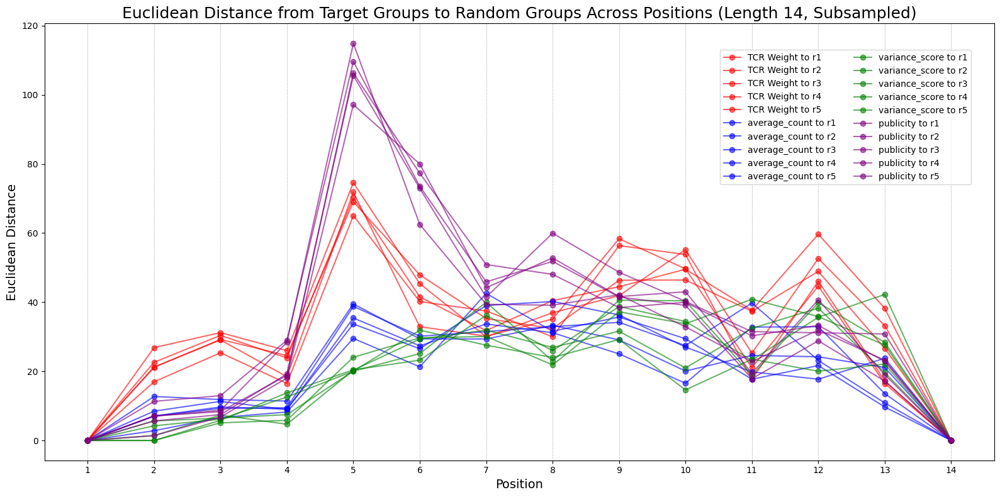

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance

# Load the CSV file into a DataFrame
file_path = 'f_final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Extract relevant columns
df = df[['amino_acid', 'selection_group']]

# Update group names to match the new naming convention
df['selection_group'] = df['selection_group'].replace({
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity'
})

# Filter for sequences of length 14
df = df[df['amino_acid'].str.len() == 14]

# Dynamically generate a list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna() for group in unique_groups}

# Process and remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = groups[group_name][~groups[group_name].str.contains('\*', na=False)].tolist()

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.")
for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Function to count amino acid presence at a specific position
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        aa = seq[position - 1]  # Position is 1-based
        presence_counts[aa] += 1
    return presence_counts

# Define groups of interest with updated names
target_groups = ['TCR Weight', 'average_count', 'variance_score', 'publicity']
random_groups = [f'r{i}' for i in range(1, 6)]

# Rename random selection groups
group_mapping = {f'random_selection_{i}': f'r{i}' for i in range(1, 6)}

# Initialize a dictionary to hold distances
distances = {tg: {rg: [] for rg in random_groups} for tg in target_groups}

# Loop through positions 1 to 14 (since sequences are length 14)
for position in range(1, 15):
    aa_presence = {group: amino_acid_presence_at_position(seqs, position) for group, seqs in groups.items()}
    data = pd.DataFrame.from_dict(aa_presence, orient='index').fillna(0)

    # Rename indices for the random selection groups
    data.rename(index=group_mapping, inplace=True)

    # Calculate distances from each target group to each random group
    for tg in target_groups:
        for rg in random_groups:
            if tg in data.index and rg in data.index:
                distance_value = distance.euclidean(data.loc[tg], data.loc[rg])
                distances[tg][rg].append(distance_value)

# Plotting the distances
plt.figure(figsize=(16, 8))  # Adjust figure size for better layout

# Define colors for different groups with updated names
colors = {
    'TCR Weight': 'red',
    'average_count': 'blue',
    'variance_score': 'green',
    'publicity': 'purple'
}

# Plot distances for each target group
for tg in target_groups:
    for rg in random_groups:
        plt.plot(range(1, 15), distances[tg][rg], marker='o', label=f'{tg} to {rg}', color=colors[tg], alpha=0.6)

plt.xlabel('Position', fontsize=14)
plt.ylabel('Euclidean Distance', fontsize=14)
plt.title('Euclidean Distance from Target Groups to Random Groups Across Positions (Length 14, Subsampled)', fontsize=18)

# Move legend inside the plot, top right
plt.legend(loc='upper right', fontsize=10, ncol=2, frameon=True, bbox_to_anchor=(0.98, 0.95))

# Set the x-axis grid with a major interval of 1
plt.xticks(range(1, 15))
plt.grid(True, which='both', axis='x', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


Subsampling all groups to 406 sequences.


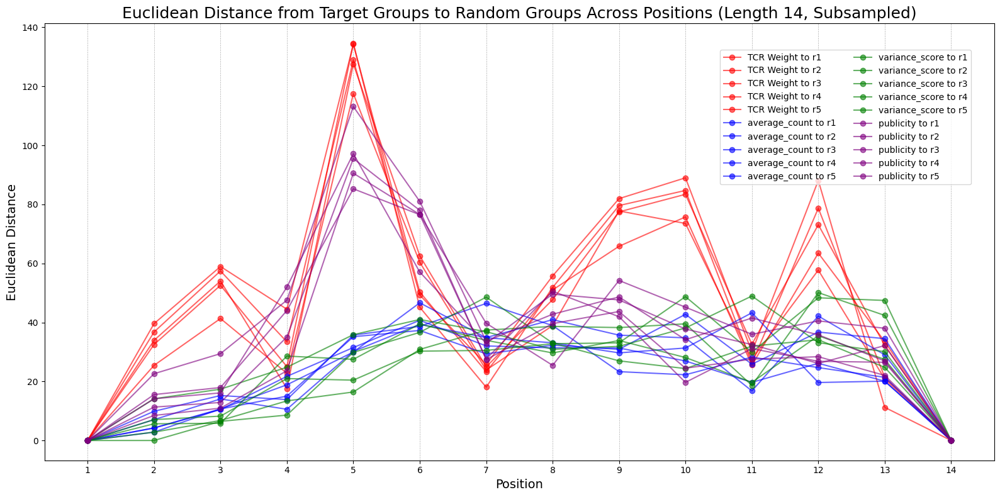

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance

# Load the CSV file into a DataFrame
file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Extract relevant columns
df = df[['amino_acid', 'selection_group']]

# Update group names to match the new naming convention
df['selection_group'] = df['selection_group'].replace({
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity'
})

# Filter for sequences of length 14
df = df[df['amino_acid'].str.len() == 14]

# Dynamically generate a list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna() for group in unique_groups}

# Process and remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = groups[group_name][~groups[group_name].str.contains('\*', na=False)].tolist()

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.")
for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Function to count amino acid presence at a specific position
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        aa = seq[position - 1]  # Position is 1-based
        presence_counts[aa] += 1
    return presence_counts

# Define groups of interest with updated names
target_groups = ['TCR Weight', 'average_count', 'variance_score', 'publicity']
random_groups = [f'r{i}' for i in range(1, 6)]

# Rename random selection groups
group_mapping = {f'random_selection_{i}': f'r{i}' for i in range(1, 6)}

# Initialize a dictionary to hold distances
distances = {tg: {rg: [] for rg in random_groups} for tg in target_groups}

# Loop through positions 1 to 14 (since sequences are length 14)
for position in range(1, 15):
    aa_presence = {group: amino_acid_presence_at_position(seqs, position) for group, seqs in groups.items()}
    data = pd.DataFrame.from_dict(aa_presence, orient='index').fillna(0)

    # Rename indices for the random selection groups
    data.rename(index=group_mapping, inplace=True)

    # Calculate distances from each target group to each random group
    for tg in target_groups:
        for rg in random_groups:
            if tg in data.index and rg in data.index:
                distance_value = distance.euclidean(data.loc[tg], data.loc[rg])
                distances[tg][rg].append(distance_value)

# Plotting the distances
plt.figure(figsize=(16, 8))  # Adjust figure size for better layout

# Define colors for different groups with updated names
colors = {
    'TCR Weight': 'red',
    'average_count': 'blue',
    'variance_score': 'green',
    'publicity': 'purple'
}

# Plot distances for each target group
for tg in target_groups:
    for rg in random_groups:
        plt.plot(range(1, 15), distances[tg][rg], marker='o', label=f'{tg} to {rg}', color=colors[tg], alpha=0.6)

plt.xlabel('Position', fontsize=14)
plt.ylabel('Euclidean Distance', fontsize=14)
plt.title('Euclidean Distance from Target Groups to Random Groups Across Positions (Length 14, Subsampled)', fontsize=18)

# Move legend inside the plot, top right
plt.legend(loc='upper right', fontsize=10, ncol=2, frameon=True, bbox_to_anchor=(0.98, 0.95))

# Set the x-axis grid with a major interval of 1
plt.xticks(range(1, 15))
plt.grid(True, which='both', axis='x', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


Subsampling all groups to 318 sequences.


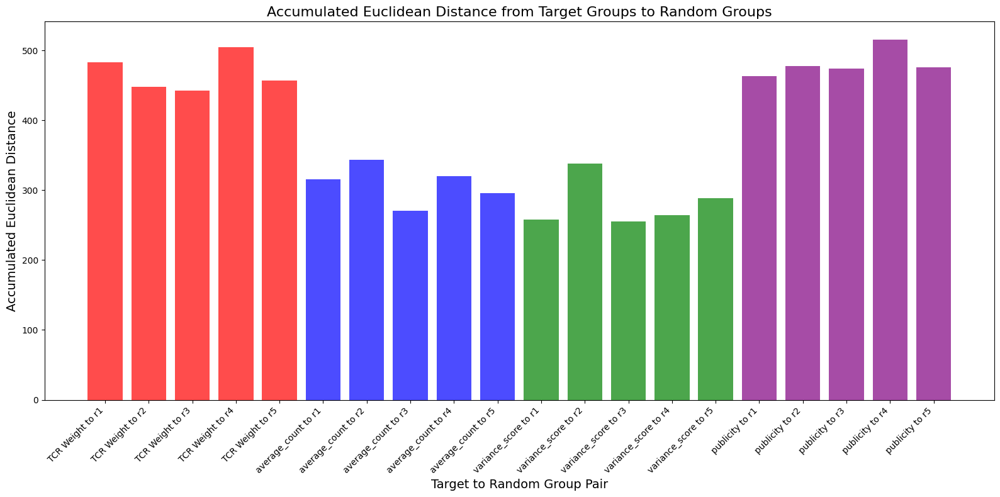

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import distance

# Load the CSV file into a DataFrame
file_path = 'f_final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Extract relevant columns
df = df[['amino_acid', 'selection_group']]

# Update group names to match the new naming convention
df['selection_group'] = df['selection_group'].replace({
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity'
})

# Filter for sequences of length 14
df = df[df['amino_acid'].str.len() == 14]

# Dynamically generate a list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna() for group in unique_groups}

# Process and remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = groups[group_name][~groups[group_name].str.contains('\*', na=False)].tolist()

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.")
for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Function to count amino acid presence at a specific position
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        aa = seq[position - 1]  # Position is 1-based
        presence_counts[aa] += 1
    return presence_counts

# Define groups of interest with updated names
target_groups = ['TCR Weight', 'average_count', 'variance_score', 'publicity']
random_groups = [f'r{i}' for i in range(1, 6)]

# Rename random selection groups
group_mapping = {f'random_selection_{i}': f'r{i}' for i in range(1, 6)}

# Initialize a dictionary to hold accumulated distances
accumulated_distances = {tg: {rg: 0 for rg in random_groups} for tg in target_groups}

# Loop through positions 1 to 14 (since sequences are length 14)
for position in range(1, 15):
    aa_presence = {group: amino_acid_presence_at_position(seqs, position) for group, seqs in groups.items()}
    data = pd.DataFrame.from_dict(aa_presence, orient='index').fillna(0)

    # Rename indices for the random selection groups
    data.rename(index=group_mapping, inplace=True)

    # Calculate distances from each target group to each random group and accumulate
    for tg in target_groups:
        for rg in random_groups:
            if tg in data.index and rg in data.index:
                distance_value = distance.euclidean(data.loc[tg], data.loc[rg])
                accumulated_distances[tg][rg] += distance_value

# Plotting the accumulated distances
plt.figure(figsize=(16, 8))

# Define colors for different groups with updated names
colors = {
    'TCR Weight': 'red',
    'average_count': 'blue',
    'variance_score': 'green',
    'publicity': 'purple'
}

# Prepare data for bar chart
x_labels = []
y_values = []
group_colors = []

for tg in target_groups:
    for rg in random_groups:
        x_labels.append(f'{tg} to {rg}')
        y_values.append(accumulated_distances[tg][rg])
        group_colors.append(colors[tg])

# Create the bar chart
plt.bar(x_labels, y_values, color=group_colors, alpha=0.7)
plt.title('Accumulated Euclidean Distance from Target Groups to Random Groups', fontsize=16)
plt.xlabel('Target to Random Group Pair', fontsize=14)
plt.ylabel('Accumulated Euclidean Distance', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.tight_layout()
plt.show()


Subsampling all groups to 318 sequences.

Group Sizes After Subsampling:
average_count_top: 318 sequences
consistency_area_top: 318 sequences
variance_score_top: 318 sequences
random_selection_1: 318 sequences
random_selection_2: 318 sequences
random_selection_3: 318 sequences
random_selection_4: 318 sequences
random_selection_5: 318 sequences
publicity_top: 318 sequences
Renamed Group Indices:
Index(['average_count', 'TCR Weight', 'variance_score', 'Random Group 1',
       'Random Group 2', 'Random Group 3', 'Random Group 4', 'Random Group 5',
       'publicity'],
      dtype='object')
Final Group Order in DataFrame:
Index(['average_count', 'TCR Weight', 'variance_score', 'Random Group 1',
       'Random Group 2', 'Random Group 3', 'Random Group 4', 'Random Group 5',
       'publicity'],
      dtype='object')


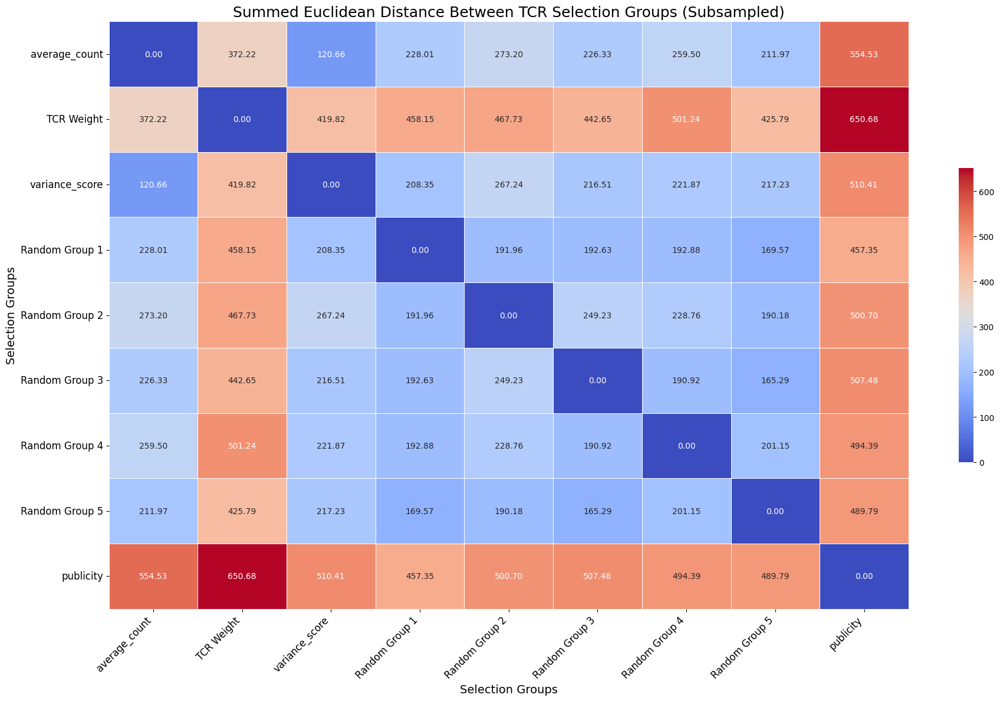

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance

# Load the main CSV file into a DataFrame
file_path = 'f_final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Filter for sequences with length 14
df['sequence_length'] = df['amino_acid'].str.len()
df = df[df['sequence_length'] == 14]


# Exclude irrelevant groups
df = df[df['selection_group'] != 'consistency_area2_top']
df = df[df['selection_group'] != 'explosion_area_top']

# Extract relevant columns
df = df[['amino_acid', 'selection_group']]

# Generate list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}


# Remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = [seq for seq in groups[group_name] if '*' not in seq]

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.\n")

for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Print the size of each group after subsampling
print("Group Sizes After Subsampling:")
for group_name, sequences in groups.items():
    print(f"{group_name}: {len(sequences)} sequences")

# Function to calculate amino acid presence at a specific position
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        if len(seq) >= position:
            aa = seq[position - 1]
            presence_counts[aa] += 1
    return presence_counts

# Initialize a matrix to hold the summed distances
summed_distances = None

# Loop through positions 1 to 20
for position in range(1, 21):
    aa_presence = {group: amino_acid_presence_at_position(seqs, position) for group, seqs in groups.items()}
    data = pd.DataFrame.from_dict(aa_presence, orient='index').fillna(0)

    # Calculate the Euclidean distances between each pair of groups
    distance_matrix = distance.squareform(distance.pdist(data, metric='euclidean'))

    # Sum the distances from each position
    if summed_distances is None:
        summed_distances = distance_matrix
    else:
        summed_distances += distance_matrix

# Convert the summed distances into a DataFrame
summed_distance_df = pd.DataFrame(summed_distances, index=data.index, columns=data.index)

# Apply renaming for the specific groups
group_name_map = {
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity',
    'random_selection_1': 'Random Group 1',
    'random_selection_2': 'Random Group 2',
    'random_selection_3': 'Random Group 3',
    'random_selection_4': 'Random Group 4',
    'random_selection_5': 'Random Group 5'
}

# Rename groups
summed_distance_df.rename(index=group_name_map, columns=group_name_map, inplace=True)

# Debugging step: Check renamed indices
print("Renamed Group Indices:")
print(summed_distance_df.index)

# Explicitly reorder to place 'publicity' at the end
non_publicity = [group for group in summed_distance_df.index if group != 'publicity']
final_order = non_publicity + ['publicity']

# Reindex the DataFrame
summed_distance_df = summed_distance_df.reindex(index=final_order, columns=final_order)

# Debugging step: Final check
print("Final Group Order in DataFrame:")
print(summed_distance_df.index)

# Plotting
plt.figure(figsize=(19, 12))
sns.heatmap(
    summed_distance_df,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    linewidths=.5,
    cbar_kws={'shrink': 0.5}
)
plt.title('Summed Euclidean Distance Between TCR Selection Groups (Subsampled)', fontsize=18)
plt.xlabel('Selection Groups', fontsize=14)
plt.ylabel('Selection Groups', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


Subsampling all groups to 408 sequences.

Group Sizes After Subsampling:
average_count_top: 408 sequences
consistency_area_top: 408 sequences
variance_score_top: 408 sequences
random_selection_1: 408 sequences
random_selection_2: 408 sequences
random_selection_3: 408 sequences
random_selection_4: 408 sequences
random_selection_5: 408 sequences
publicity_top: 408 sequences
Renamed Group Indices:
Index(['average_count', 'TCR Weight', 'variance_score', 'Random Group 1',
       'Random Group 2', 'Random Group 3', 'Random Group 4', 'Random Group 5',
       'publicity'],
      dtype='object')
Final Group Order in DataFrame:
Index(['average_count', 'TCR Weight', 'variance_score', 'Random Group 1',
       'Random Group 2', 'Random Group 3', 'Random Group 4', 'Random Group 5',
       'publicity'],
      dtype='object')


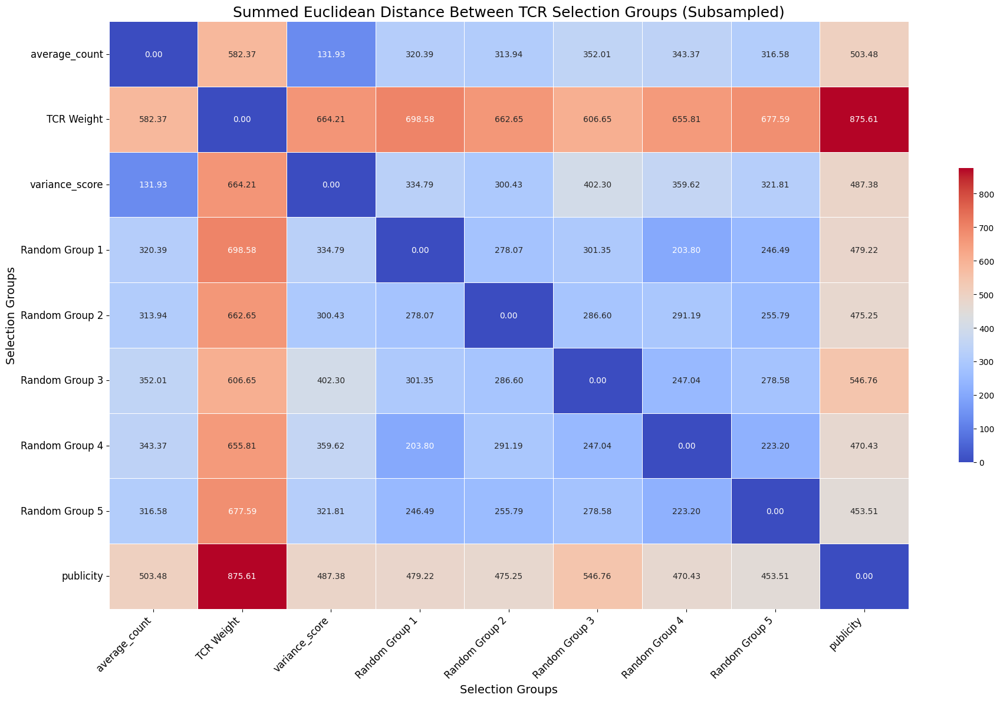

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance

# Load the main CSV file into a DataFrame
file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Filter for sequences with length 14
df['sequence_length'] = df['amino_acid'].str.len()
df = df[df['sequence_length'] == 14]


# Exclude irrelevant groups
df = df[df['selection_group'] != 'consistency_area2_top']
df = df[df['selection_group'] != 'explosion_area_top']

# Extract relevant columns
df = df[['amino_acid', 'selection_group']]

# Generate list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}


# Remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = [seq for seq in groups[group_name] if '*' not in seq]

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.\n")

for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Print the size of each group after subsampling
print("Group Sizes After Subsampling:")
for group_name, sequences in groups.items():
    print(f"{group_name}: {len(sequences)} sequences")

# Function to calculate amino acid presence at a specific position
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        if len(seq) >= position:
            aa = seq[position - 1]
            presence_counts[aa] += 1
    return presence_counts

# Initialize a matrix to hold the summed distances
summed_distances = None

# Loop through positions 1 to 20
for position in range(1, 21):
    aa_presence = {group: amino_acid_presence_at_position(seqs, position) for group, seqs in groups.items()}
    data = pd.DataFrame.from_dict(aa_presence, orient='index').fillna(0)

    # Calculate the Euclidean distances between each pair of groups
    distance_matrix = distance.squareform(distance.pdist(data, metric='euclidean'))

    # Sum the distances from each position
    if summed_distances is None:
        summed_distances = distance_matrix
    else:
        summed_distances += distance_matrix

# Convert the summed distances into a DataFrame
summed_distance_df = pd.DataFrame(summed_distances, index=data.index, columns=data.index)

# Apply renaming for the specific groups
group_name_map = {
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity',
    'random_selection_1': 'Random Group 1',
    'random_selection_2': 'Random Group 2',
    'random_selection_3': 'Random Group 3',
    'random_selection_4': 'Random Group 4',
    'random_selection_5': 'Random Group 5'
}

# Rename groups
summed_distance_df.rename(index=group_name_map, columns=group_name_map, inplace=True)

# Debugging step: Check renamed indices
print("Renamed Group Indices:")
print(summed_distance_df.index)

# Explicitly reorder to place 'publicity' at the end
non_publicity = [group for group in summed_distance_df.index if group != 'publicity']
final_order = non_publicity + ['publicity']

# Reindex the DataFrame
summed_distance_df = summed_distance_df.reindex(index=final_order, columns=final_order)

# Debugging step: Final check
print("Final Group Order in DataFrame:")
print(summed_distance_df.index)

# Plotting
plt.figure(figsize=(19, 12))
sns.heatmap(
    summed_distance_df,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    linewidths=.5,
    cbar_kws={'shrink': 0.5}
)
plt.title('Summed Euclidean Distance Between TCR Selection Groups (Subsampled)', fontsize=18)
plt.xlabel('Selection Groups', fontsize=14)
plt.ylabel('Selection Groups', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


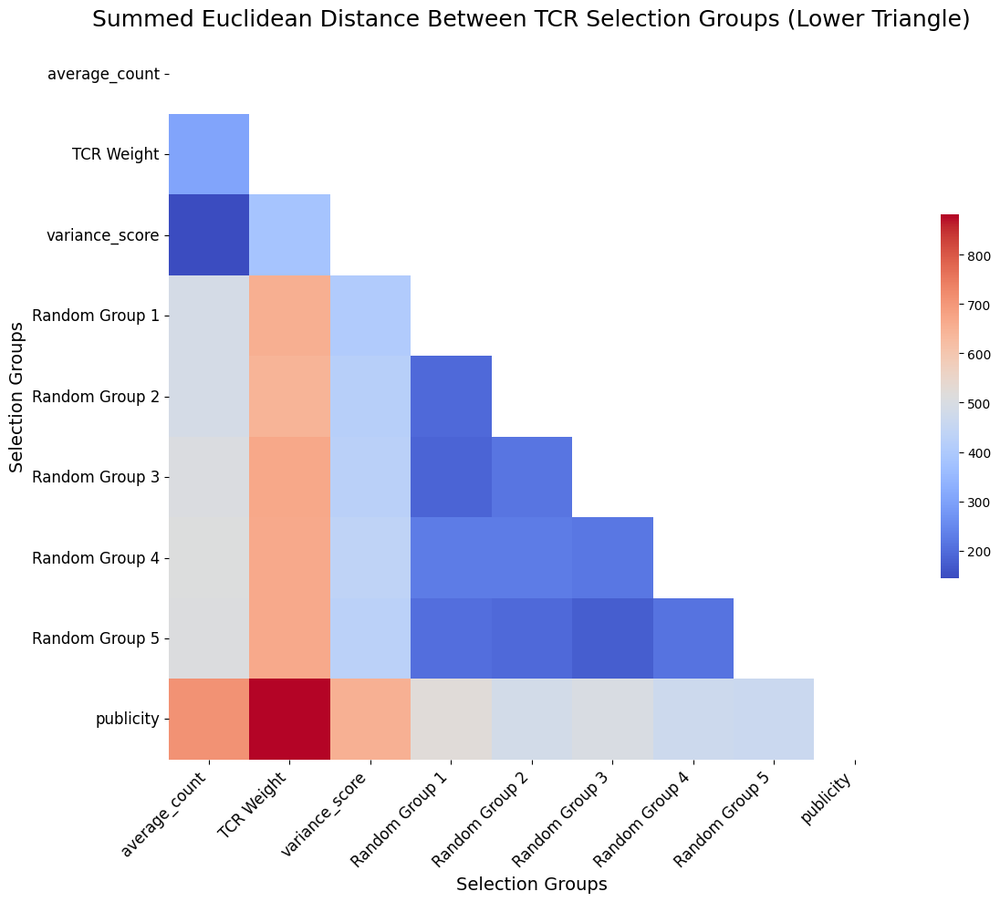

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance

# Load the main CSV file into a DataFrame
file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups1500.csv'
df = pd.read_csv(file_path)

# Filter for sequences with length 14
df['sequence_length'] = df['amino_acid'].str.len()
df = df[df['sequence_length'] == 14]

# Exclude irrelevant groups
df = df[df['selection_group'] != 'consistency_area2_top']
df = df[df['selection_group'] != 'explosion_area_top']

# Extract relevant columns
df = df[['amino_acid', 'selection_group']]

# Generate list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}

# Remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = [seq for seq in groups[group_name] if '*' not in seq]

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Function to calculate amino acid presence at a specific position
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        if len(seq) >= position:
            aa = seq[position - 1]
            presence_counts[aa] += 1
    return presence_counts

# Initialize a matrix to hold the summed distances
summed_distances = None

# Loop through positions 1 to 20
for position in range(1, 21):
    aa_presence = {group: amino_acid_presence_at_position(seqs, position) for group, seqs in groups.items()}
    data = pd.DataFrame.from_dict(aa_presence, orient='index').fillna(0)

    # Calculate the Euclidean distances between each pair of groups
    distance_matrix = distance.squareform(distance.pdist(data, metric='euclidean'))

    # Sum the distances from each position
    if summed_distances is None:
        summed_distances = distance_matrix
    else:
        summed_distances += distance_matrix

# Convert the summed distances into a DataFrame
summed_distance_df = pd.DataFrame(summed_distances, index=data.index, columns=data.index)

# Apply renaming for the specific groups
group_name_map = {
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity',
    'random_selection_1': 'Random Group 1',
    'random_selection_2': 'Random Group 2',
    'random_selection_3': 'Random Group 3',
    'random_selection_4': 'Random Group 4',
    'random_selection_5': 'Random Group 5'
}

# Rename groups
summed_distance_df.rename(index=group_name_map, columns=group_name_map, inplace=True)

# Explicitly reorder to place 'publicity' at the end
non_publicity = [group for group in summed_distance_df.index if group != 'publicity']
final_order = non_publicity + ['publicity']

# Reindex the DataFrame
summed_distance_df = summed_distance_df.reindex(index=final_order, columns=final_order)

# Select only the lower triangle
lower_triangle = np.tril(summed_distance_df.values, k=-1)

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    pd.DataFrame(lower_triangle, index=summed_distance_df.index, columns=summed_distance_df.columns),
    cmap='coolwarm',
    mask=(lower_triangle == 0),
    cbar_kws={'shrink': 0.5}
)
plt.title('Summed Euclidean Distance Between TCR Selection Groups (Lower Triangle)', fontsize=18)
plt.xlabel('Selection Groups', fontsize=14)
plt.ylabel('Selection Groups', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance

# Load the main CSV file into a DataFrame
file_path = 'f_final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Filter for sequences with length 14
df['sequence_length'] = df['amino_acid'].str.len()
df = df[df['sequence_length'] == 14]

# Exclude irrelevant groups
df = df[(df['selection_group'] != 'consistency_area2_top') & (df['selection_group'] != 'explosion_area_top')]

# Extract relevant columns
df = df[['amino_acid', 'selection_group']]

# Generate list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}

# Remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = [seq for seq in groups[group_name] if '*' not in seq]

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Function to calculate amino acid presence at a specific position
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        if len(seq) >= position:
            aa = seq[position - 1]
            presence_counts[aa] += 1
    return presence_counts

# Initialize a matrix to hold the summed distances
summed_distances = None

# Loop through positions 1 to 20
for position in range(1, 21):
    aa_presence = {group: amino_acid_presence_at_position(seqs, position) for group, seqs in groups.items()}
    data = pd.DataFrame.from_dict(aa_presence, orient='index').fillna(0)

    # Calculate the Euclidean distances between each pair of groups
    distance_matrix = distance.squareform(distance.pdist(data, metric='euclidean'))

    # Sum the distances from each position
    if summed_distances is None:
        summed_distances = distance_matrix
    else:
        summed_distances += distance_matrix

# Convert the summed distances into a DataFrame
summed_distance_df = pd.DataFrame(summed_distances, index=data.index, columns=data.index)

# Apply renaming for the specific groups
group_name_map = {
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity',
    'random_selection_1': 'Random Group 1',
    'random_selection_2': 'Random Group 2',
    'random_selection_3': 'Random Group 3',
    'random_selection_4': 'Random Group 4',
    'random_selection_5': 'Random Group 5'
}

# Rename groups
summed_distance_df.rename(index=group_name_map, columns=group_name_map, inplace=True)

# Explicitly reorder to place 'publicity' at the end
non_publicity = [group for group in summed_distance_df.index if group != 'publicity']
final_order = non_publicity + ['publicity']

# Reindex the DataFrame
summed_distance_df = summed_distance_df.reindex(index=final_order, columns=final_order)

# Select only the lower triangle
lower_triangle = np.tril(summed_distance_df.values, k=-1)

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    pd.DataFrame(lower_triangle, index=summed_distance_df.index, columns=summed_distance_df.columns),
    cmap='coolwarm',
    mask=(lower_triangle == 0),
    cbar_kws={'shrink': 0.5}
)
plt.title('Summed Euclidean Distance Between TCR Selection Groups (Lower Triangle)', fontsize=18)
plt.xlabel('Selection Groups', fontsize=14)
plt.ylabel('Selection Groups', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()

# Save as SVG file
svg_path = 'summed_euclidean_distance_heatmap_before_subset.svg'
plt.savefig(svg_path, format='svg')
plt.close()



<ipython-input-21-7eb65306f65f>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  age_df['accuracy'] = pd.to_numeric(age_df['accuracy'], errors='coerce')
<ipython-input-21-7eb65306f65f>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  age_df['original_num_features'] = pd.to_numeric(age_df['original_num_features'], errors='coerce')


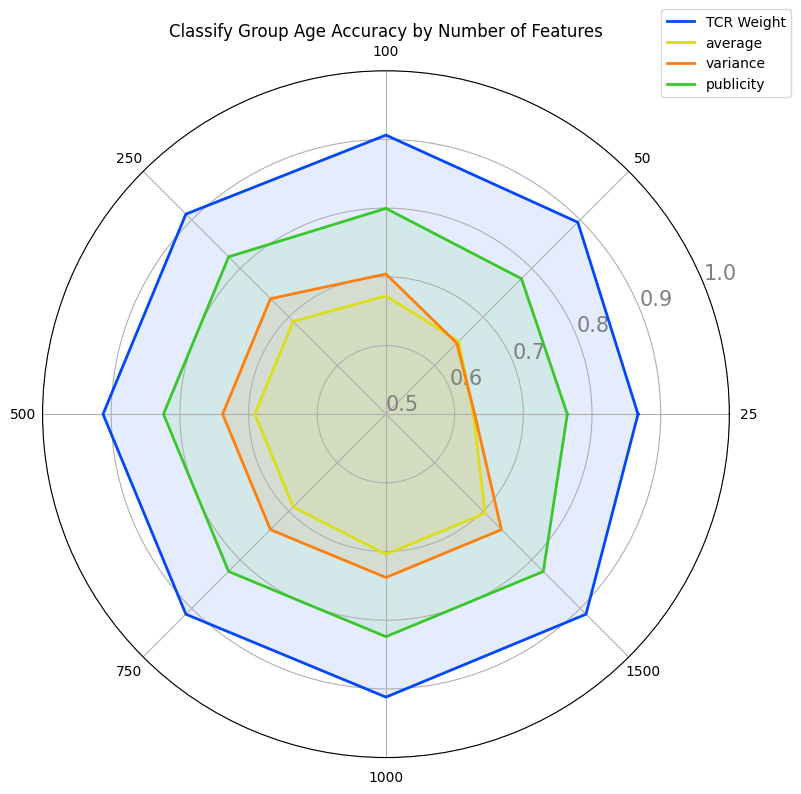

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from math import pi
import os

# Define the path where the results are stored
results_path = './'  # Adjust this to your actual path if different

# Load the data for age classification from the single file
age_df = pd.read_csv(os.path.join(results_path, 'model_results_binary_age_classification.csv'))

# Rename 'consistency_area_top' to 'TCR Weight' and filter out unwanted groups
age_df['file'] = age_df['file'].apply(lambda x: 'TCR Weight' if 'consistency_area_top' in x else x.split('_')[0])

# Strictly include only the groups we want: 'TCR Weight', 'average', 'variance', and 'publicity'
allowed_groups = ['TCR Weight', 'average', 'variance', 'publicity']
age_df = age_df[age_df['file'].isin(allowed_groups)]

# Ensure 'accuracy' and 'original_num_features' columns are numeric
age_df['accuracy'] = pd.to_numeric(age_df['accuracy'], errors='coerce')
age_df['original_num_features'] = pd.to_numeric(age_df['original_num_features'], errors='coerce')

# Drop rows with NaN values in 'accuracy' or 'original_num_features'
age_df = age_df.dropna(subset=['accuracy', 'original_num_features'])

# Remove duplicate labels in the 'original_num_features' column, keeping the first occurrence
age_df = age_df.drop_duplicates(subset=['file', 'original_num_features'])

# Define a distinct color map for each group
color_map = {
    'TCR Weight': '#0248f7',   # Blue
    'average': '#dbde18',      # Yellow
    'variance': '#ff7f0e',     # Orange
    'publicity': '#39c72c'     # Green
}

# Radar Chart
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# Get the list of unique 'original_num_features' for the angles
unique_features = sorted(age_df['original_num_features'].unique())
num_vars = len(unique_features)
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Complete the circle

# Iterate over each unique group in the file column
for group in allowed_groups:
    # Filter data for the group
    group_data = age_df[age_df['file'] == group]

    # Values for the radar chart
    values = group_data.set_index('original_num_features').reindex(unique_features)['accuracy'].fillna(0).tolist()
    values += values[:1]  # Repeat the first value to close the circle

    # Plotting each group on the radar chart
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=group, color=color_map.get(group, 'grey'))
    ax.fill(angles, values, alpha=0.1, color=color_map.get(group, 'grey'))

# Set the range for the radial axis (0.5 to 1)
ax.set_ylim(0.5, 1)

# Set the radial ticks
ax.set_yticks([0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
ax.set_yticklabels(['0.5', '0.6', '0.7', '0.8', '0.9', '1.0'], color="grey", size=15)

# Setting x-ticks to the feature numbers and closing the circle
plt.xticks(angles[:-1], [str(int(num)) for num in unique_features])

# Set title and legend
ax.set_title('Classify Group Age Accuracy by Number of Features')
ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))

# Display the plot
plt.tight_layout()
plt.show()


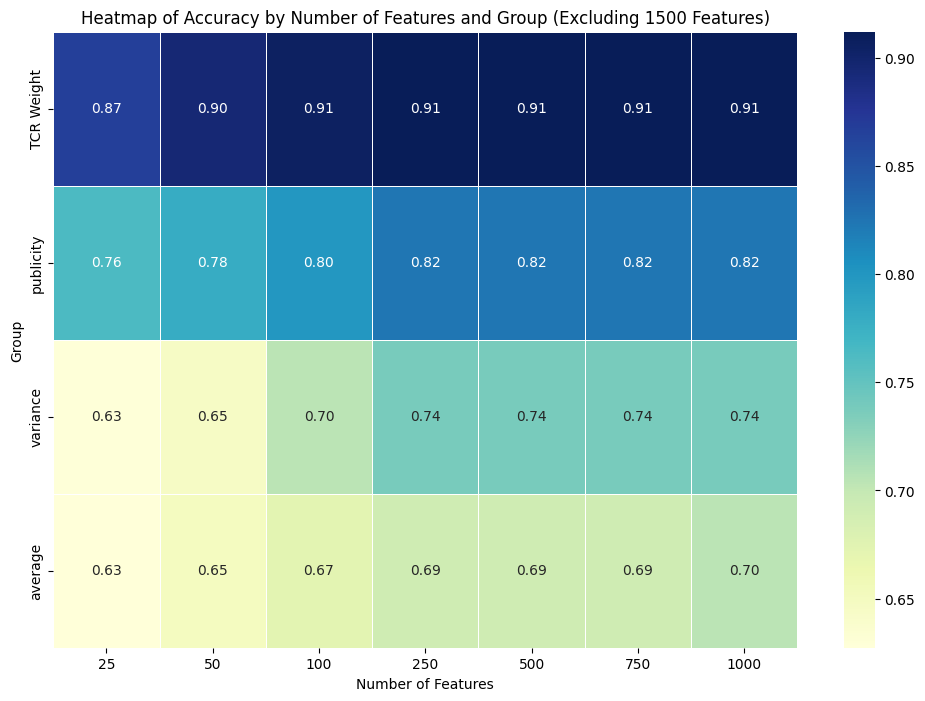

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Define the path where the results are stored
results_path = './'  # Adjust this to your actual path if different

# Function to process the 'file' column to rename 'consistency_area_top' to 'TCR Weight'
def process_file_column(file_column):
    return file_column.apply(lambda x: 'TCR Weight' if 'consistency_area_top' in x else x.split('_')[0])

# Load the data for age classification from both files
age_df = pd.read_csv(os.path.join(results_path, 'model_results_binary_age_classification.csv'))
age_df2 = pd.read_csv(os.path.join(results_path, 'model_results_binary_age_classification2.csv'))

# Process the 'file' column for renaming and filtering unwanted groups
age_df['file'] = process_file_column(age_df['file'])
age_df2['file'] = process_file_column(age_df2['file'])

# Combine the two dataframes
combined_df = pd.concat([age_df, age_df2], ignore_index=True)

# Filter to include only the specified groups
allowed_groups = ['TCR Weight', 'publicity', 'variance', 'average']
combined_df = combined_df[combined_df['file'].isin(allowed_groups)]

# Ensure 'accuracy' and 'original_num_features' columns are numeric
combined_df['accuracy'] = pd.to_numeric(combined_df['accuracy'], errors='coerce')
combined_df['original_num_features'] = pd.to_numeric(combined_df['original_num_features'], errors='coerce')

# Drop rows with NaN values in 'accuracy' or 'original_num_features'
combined_df = combined_df.dropna(subset=['accuracy', 'original_num_features'])

# Remove entries where 'original_num_features' is 1500
combined_df = combined_df[combined_df['original_num_features'] != 1500]

# Remove duplicate labels in the 'original_num_features' column, keeping the first occurrence
combined_df = combined_df.drop_duplicates(subset=['file', 'original_num_features'])

# Pivot the data to create a matrix of accuracy values
pivot_table = combined_df.pivot_table(values='accuracy', index='file', columns='original_num_features')

# Reorder the index (rows) according to the specified order
pivot_table = pivot_table.reindex(['TCR Weight', 'publicity', 'variance', 'average'])

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=.5)
plt.title('Heatmap of Accuracy by Number of Features and Group (Excluding 1500 Features)')
plt.xlabel('Number of Features')
plt.ylabel('Group')
plt.show()


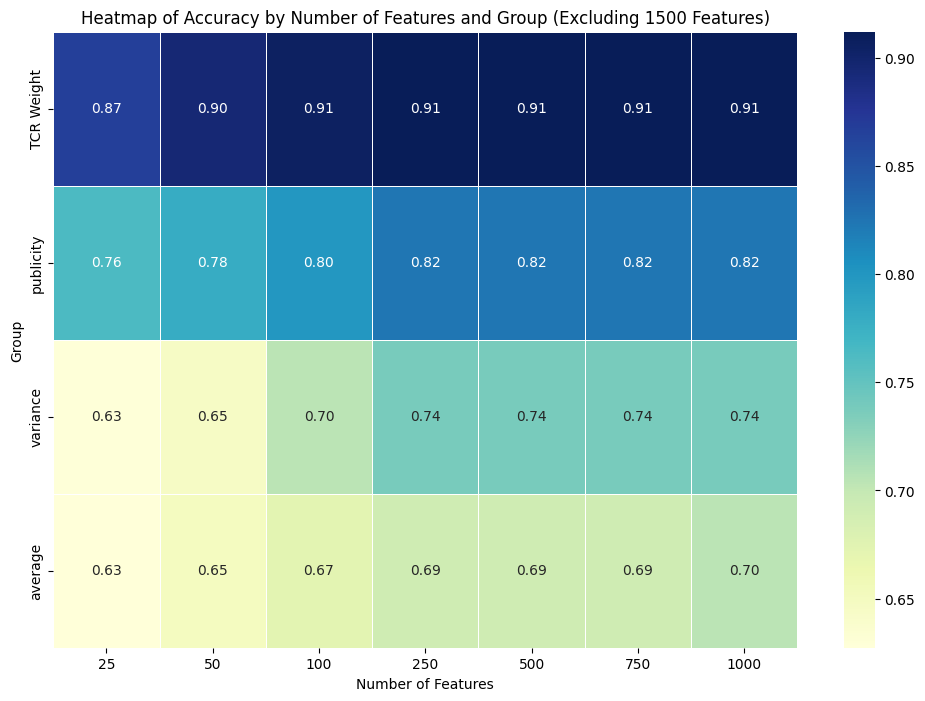

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Define the path where the results are stored
results_path = './'  # Adjust this to your actual path if different

# Function to process the 'file' column to extract the group names
def process_file_column(file_column, consistency_label):
    return file_column.apply(lambda x: consistency_label if 'consistency_area_top' in x else x.split('_')[0])

# Load the data for age classification from both files
age_df = pd.read_csv(os.path.join(results_path, 'model_results_binary_age_classification.csv'))
age_df2 = pd.read_csv(os.path.join(results_path, 'model_results_binary_age_classification2.csv'))

# Process the 'file' column for both dataframes
age_df['file'] = process_file_column(age_df['file'], 'consistency')
age_df2['file'] = process_file_column(age_df2['file'], 'consistency_threshold')

# Combine the two dataframes
combined_df = pd.concat([age_df, age_df2], ignore_index=True)

# Ensure the 'original_num_features' and 'accuracy' columns are numeric
combined_df['accuracy'] = pd.to_numeric(combined_df['accuracy'], errors='coerce')
combined_df['original_num_features'] = pd.to_numeric(combined_df['original_num_features'], errors='coerce')

# Drop rows with NaN values in 'accuracy' or 'original_num_features'
combined_df = combined_df.dropna(subset=['accuracy', 'original_num_features'])

# Remove entries where 'original_num_features' is 1500
combined_df = combined_df[combined_df['original_num_features'] != 1500]

# Remove duplicate labels in the 'original_num_features' column, keeping the first occurrence
combined_df = combined_df.drop_duplicates(subset=['file', 'original_num_features'])

# Pivot the data to create a matrix of accuracy values
pivot_table = combined_df.pivot_table(values='accuracy', index='file', columns='original_num_features')

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=.5)
plt.title('Heatmap of Accuracy by Number of Features and Group (Excluding 1500 Features)')
plt.xlabel('Number of Features')
plt.ylabel('Group')
plt.show()


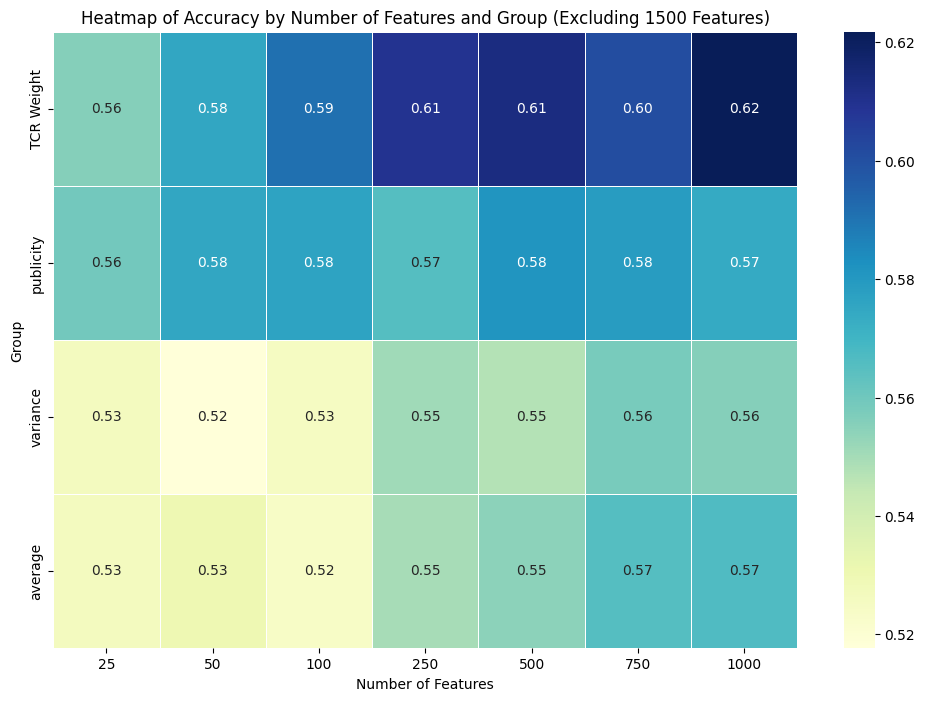

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Define the path where the results are stored
results_path = './'  # Adjust this to your actual path if different

# Function to process the 'file' column to rename 'consistency_area_top' to 'TCR Weight'
def process_file_column(file_column):
    return file_column.apply(lambda x: 'TCR Weight' if 'consistency_area_top' in x else x.split('_')[0])

# Load the data for sex classification from both files
sex_df = pd.read_csv(os.path.join(results_path, 'model_results_binary_sex_classification.csv'))
sex_df2 = pd.read_csv(os.path.join(results_path, 'model_results_binary_sex_classification2.csv'))

# Process the 'file' column for renaming and filtering unwanted groups
sex_df['file'] = process_file_column(sex_df['file'])
sex_df2['file'] = process_file_column(sex_df2['file'])

# Combine the two dataframes
combined_df = pd.concat([sex_df, sex_df2], ignore_index=True)

# Filter to include only the specified groups
allowed_groups = ['TCR Weight', 'publicity', 'variance', 'average']
combined_df = combined_df[combined_df['file'].isin(allowed_groups)]

# Ensure 'accuracy' and 'original_num_features' columns are numeric
combined_df['accuracy'] = pd.to_numeric(combined_df['accuracy'], errors='coerce')
combined_df['original_num_features'] = pd.to_numeric(combined_df['original_num_features'], errors='coerce')

# Drop rows with NaN values in 'accuracy' or 'original_num_features'
combined_df = combined_df.dropna(subset=['accuracy', 'original_num_features'])

# Remove entries where 'original_num_features' is 1500
combined_df = combined_df[combined_df['original_num_features'] != 1500]

# Remove duplicate labels in the 'original_num_features' column, keeping the first occurrence
combined_df = combined_df.drop_duplicates(subset=['file', 'original_num_features'])

# Pivot the data to create a matrix of accuracy values
pivot_table = combined_df.pivot_table(values='accuracy', index='file', columns='original_num_features')

# Reorder the index (rows) according to the specified order
pivot_table = pivot_table.reindex(['TCR Weight', 'publicity', 'variance', 'average'])

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=.5)
plt.title('Heatmap of Accuracy by Number of Features and Group (Excluding 1500 Features)')
plt.xlabel('Number of Features')
plt.ylabel('Group')
plt.show()


# article code section until here

the 14 length section

Downsampling both groups to 318 sequences.


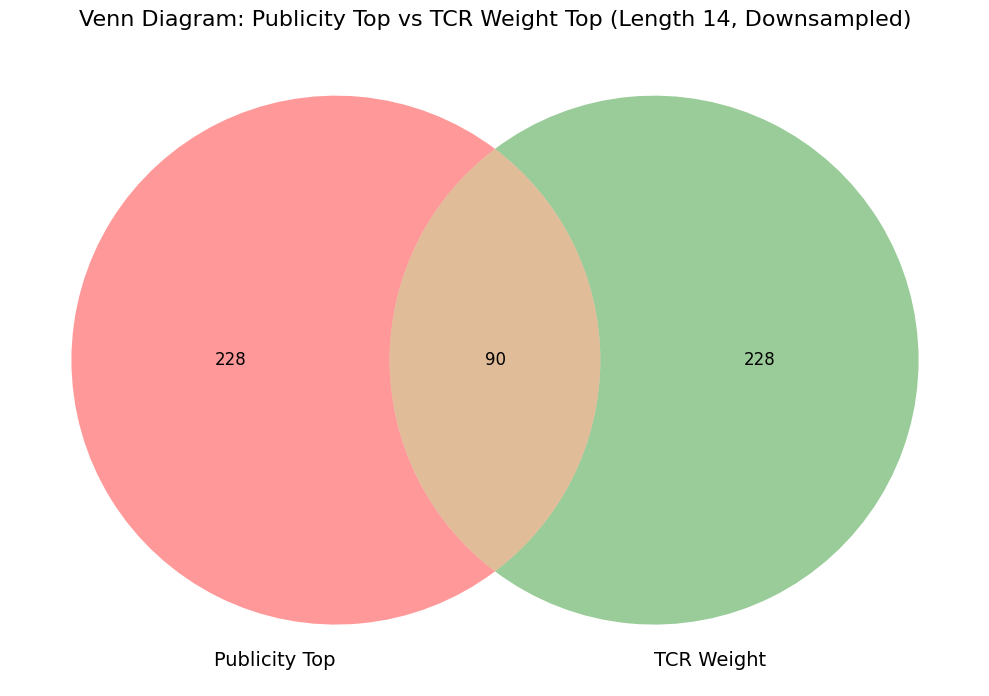

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import numpy as np

# Load the CSV file into a DataFrame
file_path = 'f_final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Filter for sequences of length 14
df = df[df['amino_acid'].str.len() == 14]

# Remove the 'explosion_area_top' group
df = df[df['selection_group'] != 'explosion_area_top']

# Define the two remaining groups of interest
group_publicity = df[df['selection_group'] == 'publicity_top']['amino_acid'].dropna().tolist()
group_consistency = df[df['selection_group'] == 'consistency_area_top']['amino_acid'].dropna().tolist()

# Downsample both groups to the size of the smaller group
min_size = min(len(group_publicity), len(group_consistency))
print(f"Downsampling both groups to {min_size} sequences.")

group_publicity = np.random.choice(group_publicity, min_size, replace=False)
group_consistency = np.random.choice(group_consistency, min_size, replace=False)

# Convert the downsampled groups to sets
set_publicity = set(group_publicity)
set_consistency = set(group_consistency)

# Create the Venn diagram for the two groups
plt.figure(figsize=(10, 8))
venn = venn2([set_publicity, set_consistency],
             ('Publicity Top', 'TCR Weight'))

# Customize the appearance (optional)
for text in venn.set_labels:
    text.set_fontsize(14)

for text in venn.subset_labels:
    if text:  # Ensure that the subset is not empty
        text.set_fontsize(12)

plt.title('Venn Diagram: Publicity Top vs TCR Weight Top (Length 14, Downsampled)', fontsize=16)
plt.tight_layout()
plt.show()


Downsampling both groups to 408 sequences.


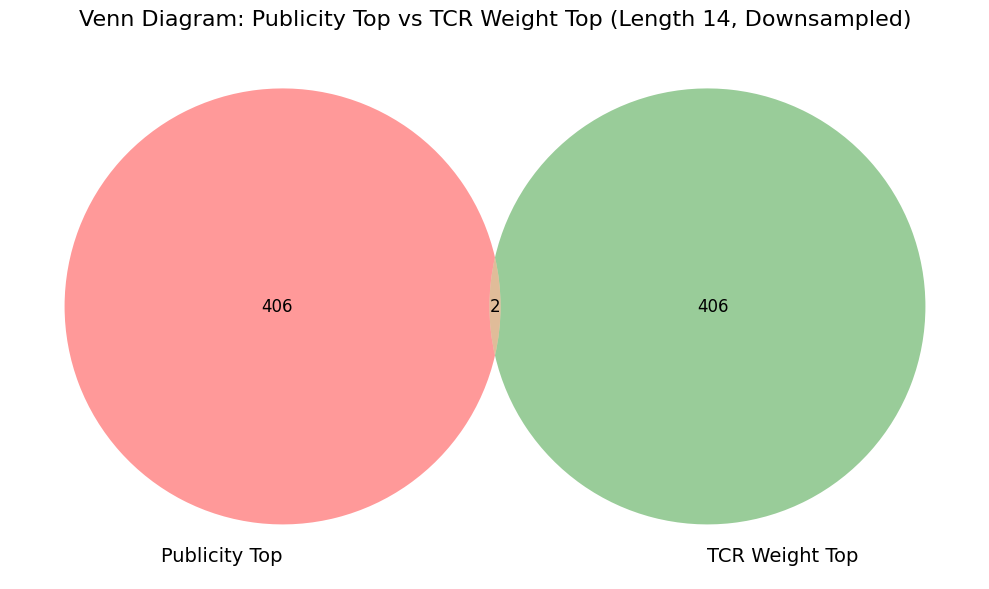

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import numpy as np

# Load the CSV file into a DataFrame
file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups.csv'
df = pd.read_csv(file_path)

# Filter for sequences of length 14
df = df[df['amino_acid'].str.len() == 14]

# Remove the 'explosion_area_top' group
df = df[df['selection_group'] != 'explosion_area_top']

# Define the two remaining groups of interest
group_publicity = df[df['selection_group'] == 'publicity_top']['amino_acid'].dropna().tolist()
group_consistency = df[df['selection_group'] == 'consistency_area_top']['amino_acid'].dropna().tolist()

# Downsample both groups to the size of the smaller group
min_size = min(len(group_publicity), len(group_consistency))
print(f"Downsampling both groups to {min_size} sequences.")

group_publicity = np.random.choice(group_publicity, min_size, replace=False)
group_consistency = np.random.choice(group_consistency, min_size, replace=False)

# Convert the downsampled groups to sets
set_publicity = set(group_publicity)
set_consistency = set(group_consistency)

# Create the Venn diagram for the two groups
plt.figure(figsize=(10, 8))
venn = venn2([set_publicity, set_consistency],
             ('Publicity Top', 'TCR Weight Top'))

# Customize the appearance (optional)
for text in venn.set_labels:
    text.set_fontsize(14)

for text in venn.subset_labels:
    if text:  # Ensure that the subset is not empty
        text.set_fontsize(12)

plt.title('Venn Diagram: Publicity Top vs TCR Weight Top (Length 14, Downsampled)', fontsize=16)
plt.tight_layout()
plt.show()


# dean dataset extract 1500 no threshold

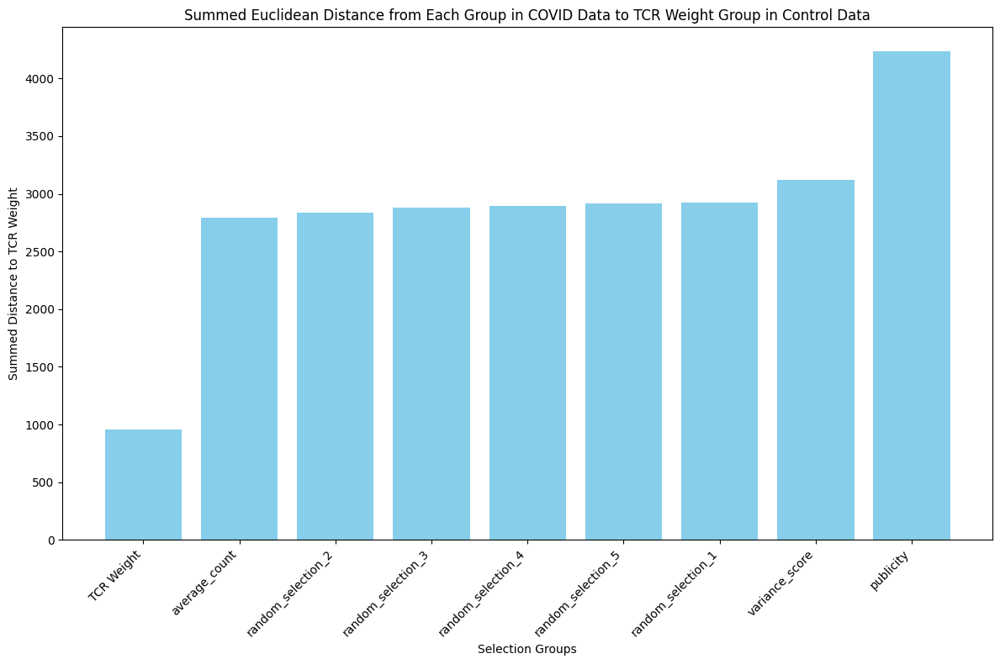

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import distance

# Load the main CSV file and additional file with the consistency group
file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups.csv'
consistency_file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups1500.csv'

df = pd.read_csv(file_path)
consistency_df = pd.read_csv(consistency_file_path)

# Extract all 'consistency_area_top' features (full size) from the consistency file
consistency_area_top = (
    consistency_df[consistency_df['selection_group'] == 'consistency_area_top']
    ['amino_acid']
    .dropna()
    .tolist()
)

# Exclude the 'consistency_area2_top' and 'explosion_area_top' groups from the main data
df = df[~df['selection_group'].isin(['consistency_area2_top', 'explosion_area_top'])]

# Rename groups according to the specified naming convention and include random groups
group_name_map = {
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity'
}

# Map the `selection_group` column and keep random groups unchanged
df['selection_group'] = df['selection_group'].apply(lambda x: group_name_map.get(x, x))

# Remove any rows with NaN in 'selection_group' due to unmapped groups
df = df.dropna(subset=['selection_group'])

# Extract relevant columns and create groups with full sizes
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}

# Function to calculate amino acid presence at a specific position, skipping sequences with '*'
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        if '*' in seq:  # Skip sequences with '*'
            continue
        if len(seq) >= position:
            aa = seq[position - 1]
            if aa in presence_counts:
                presence_counts[aa] += 1
    return presence_counts

# Create amino acid presence profiles for each group and for the consistency_area_top group
profiles = {group: [amino_acid_presence_at_position(seqs, pos) for pos in range(1, 21)] for group, seqs in groups.items()}
consistency_profile = [amino_acid_presence_at_position(consistency_area_top, pos) for pos in range(1, 21)]

# Calculate the summed distance of each group to the consistency_area_top
summed_distances = {}
for group, profile in profiles.items():
    total_distance = 0
    for pos in range(20):  # Loop through positions 1 to 20
        group_data = pd.DataFrame.from_dict(profile[pos], orient='index').fillna(0)
        consistency_data = pd.DataFrame.from_dict(consistency_profile[pos], orient='index').fillna(0)

        # Calculate the Euclidean distance for this position
        distance_matrix = distance.cdist(group_data.T, consistency_data.T, metric='euclidean')
        total_distance += np.sum(distance_matrix)
    summed_distances[group] = total_distance

# Sort summed distances
sorted_summed_distances = dict(sorted(summed_distances.items(), key=lambda item: item[1]))

# Plot the sorted summed distances as a bar chart
plt.figure(figsize=(12, 8))
plt.bar(sorted_summed_distances.keys(), sorted_summed_distances.values(), color='skyblue')
plt.title('Summed Euclidean Distance from Each Group in COVID Data to TCR Weight Group in Control Data')
plt.xlabel('Selection Groups')
plt.ylabel('Summed Distance to TCR Weight')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Subsampling all groups to 392 sequences.

Group Sizes After Subsampling:
average_count_top: 392 sequences
consistency_area_top: 392 sequences
variance_score_top: 392 sequences
publicity_top: 392 sequences
random_selection_1: 392 sequences
random_selection_2: 392 sequences
random_selection_3: 392 sequences
random_selection_4: 392 sequences
random_selection_5: 392 sequences
Renamed Group Indices:
Index(['average_count', 'TCR Weight', 'variance_score', 'publicity',
       'Random Group 1', 'Random Group 2', 'Random Group 3', 'Random Group 4',
       'Random Group 5'],
      dtype='object')
Final Group Order in DataFrame:
Index(['average_count', 'TCR Weight', 'variance_score', 'Random Group 1',
       'Random Group 2', 'Random Group 3', 'Random Group 4', 'Random Group 5',
       'publicity'],
      dtype='object')


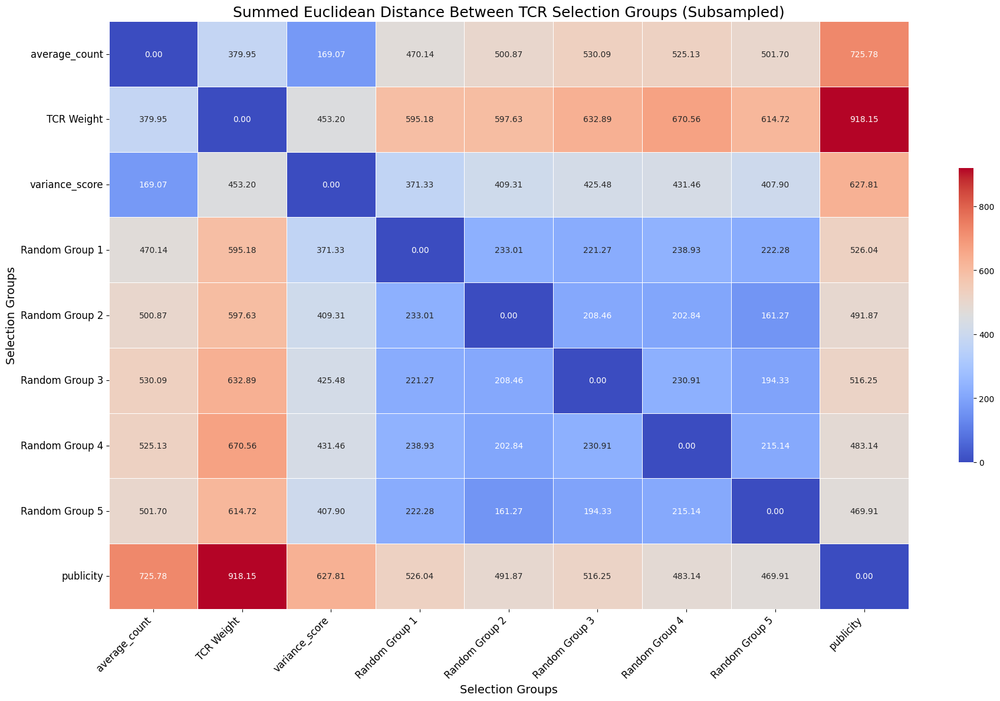

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance

# Load the main CSV file into a DataFrame
file_path = 'final_tcr_selection_adjusted_distribution_with_random_groups1500.csv'
df = pd.read_csv(file_path)

# Filter for sequences with length 14
df['sequence_length'] = df['amino_acid'].str.len()
df = df[df['sequence_length'] == 14]


# Exclude irrelevant groups
df = df[df['selection_group'] != 'consistency_area2_top']
df = df[df['selection_group'] != 'explosion_area_top']

# Extract relevant columns
df = df[['amino_acid', 'selection_group']]

# Generate list of groups including all random groups
unique_groups = df['selection_group'].unique()
groups = {group: df[df['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}

# Add the 'consistency_area_top' group
groups['consistency_area_top'] = consistency_area_top_main.tolist()

# Remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = [seq for seq in groups[group_name] if '*' not in seq]

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.\n")

for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Print the size of each group after subsampling
print("Group Sizes After Subsampling:")
for group_name, sequences in groups.items():
    print(f"{group_name}: {len(sequences)} sequences")

# Function to calculate amino acid presence at a specific position
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'  # List of all 20 standard amino acids
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        if len(seq) >= position:
            aa = seq[position - 1]
            presence_counts[aa] += 1
    return presence_counts

# Initialize a matrix to hold the summed distances
summed_distances = None

# Loop through positions 1 to 20
for position in range(1, 21):
    aa_presence = {group: amino_acid_presence_at_position(seqs, position) for group, seqs in groups.items()}
    data = pd.DataFrame.from_dict(aa_presence, orient='index').fillna(0)

    # Calculate the Euclidean distances between each pair of groups
    distance_matrix = distance.squareform(distance.pdist(data, metric='euclidean'))

    # Sum the distances from each position
    if summed_distances is None:
        summed_distances = distance_matrix
    else:
        summed_distances += distance_matrix

# Convert the summed distances into a DataFrame
summed_distance_df = pd.DataFrame(summed_distances, index=data.index, columns=data.index)

# Apply renaming for the specific groups
group_name_map = {
    'consistency_area_top': 'TCR Weight',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity',
    'random_selection_1': 'Random Group 1',
    'random_selection_2': 'Random Group 2',
    'random_selection_3': 'Random Group 3',
    'random_selection_4': 'Random Group 4',
    'random_selection_5': 'Random Group 5'
}

# Rename groups
summed_distance_df.rename(index=group_name_map, columns=group_name_map, inplace=True)

# Debugging step: Check renamed indices
print("Renamed Group Indices:")
print(summed_distance_df.index)

# Explicitly reorder to place 'publicity' at the end
non_publicity = [group for group in summed_distance_df.index if group != 'publicity']
final_order = non_publicity + ['publicity']

# Reindex the DataFrame
summed_distance_df = summed_distance_df.reindex(index=final_order, columns=final_order)

# Debugging step: Final check
print("Final Group Order in DataFrame:")
print(summed_distance_df.index)

# Plotting
plt.figure(figsize=(19, 12))
sns.heatmap(
    summed_distance_df,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    linewidths=.5,
    cbar_kws={'shrink': 0.5}
)
plt.title('Summed Euclidean Distance Between TCR Selection Groups (Subsampled)', fontsize=18)
plt.xlabel('Selection Groups', fontsize=14)
plt.ylabel('Selection Groups', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


Subsampling all groups to 386 sequences.

Group Sizes After Subsampling:
average_count_top: 386 sequences
consistency_area_top: 386 sequences
variance_score_top: 386 sequences
random_selection_1: 386 sequences
random_selection_2: 386 sequences
random_selection_3: 386 sequences
random_selection_4: 386 sequences
random_selection_5: 386 sequences
publicity_top: 386 sequences
TCR Weight: 386 sequences
Final Group Order in DataFrame:
Index(['average_count', 'TCR Weight', 'TCR Weight healthy', 'variance_score',
       'Random Group 1', 'Random Group 2', 'Random Group 3', 'Random Group 4',
       'Random Group 5', 'publicity'],
      dtype='object')


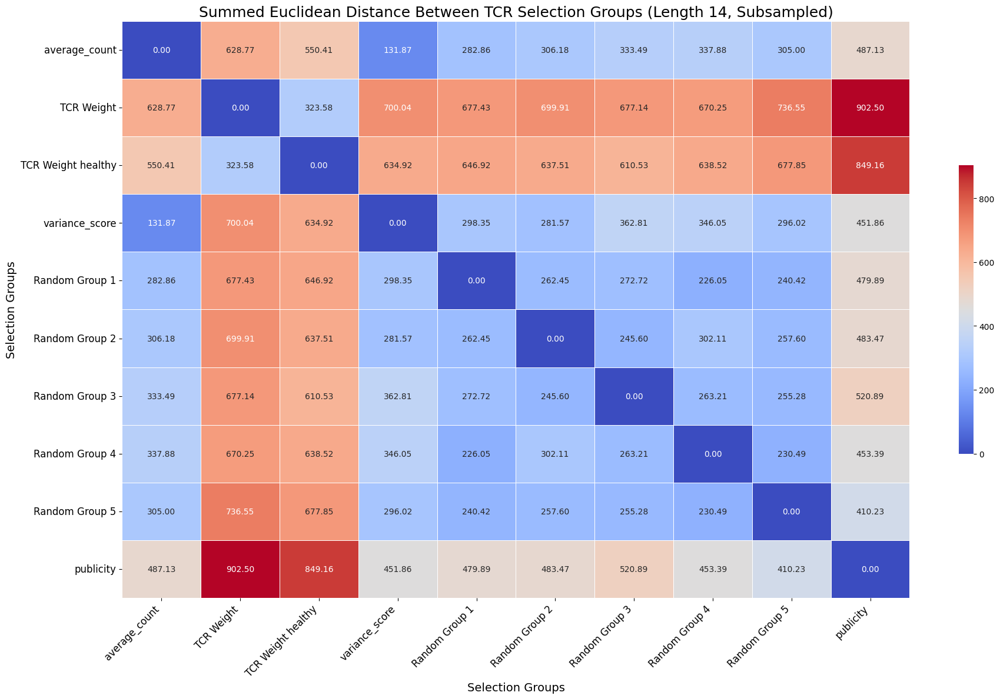

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance

# Load the main CSV file into DataFrames
file_path_main = 'final_tcr_selection_adjusted_distribution_with_random_groups1500.csv'
file_path_covid = 'final_tcr_selection_adjusted_distribution_with_random_groups.csv'

df_main = pd.read_csv(file_path_main)
df_covid = pd.read_csv(file_path_covid)

# Exclude irrelevant groups
df_main = df_main[df_main['selection_group'] != 'consistency_area2_top']
df_main = df_main[df_main['selection_group'] != 'explosion_area_top']

df_covid = df_covid[df_covid['selection_group'] != 'consistency_area2_top']
df_covid = df_covid[df_covid['selection_group'] != 'explosion_area_top']

# Filter for sequences with length 14
df_main['sequence_length'] = df_main['amino_acid'].str.len()
df_covid['sequence_length'] = df_covid['amino_acid'].str.len()

df_main = df_main[df_main['sequence_length'] == 14]
df_covid = df_covid[df_covid['sequence_length'] == 14]

# Extract the 'consistency_area_top' group from the main file
consistency_main = df_main[df_main['selection_group'] == 'consistency_area_top']['amino_acid'].dropna().tolist()

# Extract all other groups from the COVID file
unique_groups = df_covid['selection_group'].unique()
groups = {group: df_covid[df_covid['selection_group'] == group]['amino_acid'].dropna().tolist() for group in unique_groups}

# Add the 'consistency_area_top' group from the main file as 'TCR Weight'
groups['TCR Weight'] = consistency_main

# Remove sequences containing '*' for each group
for group_name in groups:
    groups[group_name] = [seq for seq in groups[group_name] if '*' not in seq]

# Subsample all groups to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling all groups to {min_size} sequences.\n")

for group_name in groups:
    groups[group_name] = np.random.choice(groups[group_name], min_size, replace=False).tolist()

# Print the size of each group after subsampling
print("Group Sizes After Subsampling:")
for group_name, sequences in groups.items():
    print(f"{group_name}: {len(sequences)} sequences")

# Function to calculate amino acid presence at a specific position
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        if len(seq) >= position:
            aa = seq[position - 1]
            presence_counts[aa] += 1
    return presence_counts

# Initialize a matrix to hold the summed distances
summed_distances = None

# Loop through positions 1 to 20
for position in range(1, 21):
    aa_presence = {group: amino_acid_presence_at_position(seqs, position) for group, seqs in groups.items()}
    data = pd.DataFrame.from_dict(aa_presence, orient='index').fillna(0)

    # Calculate the Euclidean distances between each pair of groups
    distance_matrix = distance.squareform(distance.pdist(data, metric='euclidean'))

    # Sum the distances from each position
    if summed_distances is None:
        summed_distances = distance_matrix
    else:
        summed_distances += distance_matrix

# Convert the summed distances into a DataFrame
summed_distance_df = pd.DataFrame(summed_distances, index=data.index, columns=data.index)

# Apply renaming for the specific groups
group_name_map = {
    'consistency_area_top': 'TCR Weight healthy',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity',
    'random_selection_1': 'Random Group 1',
    'random_selection_2': 'Random Group 2',
    'random_selection_3': 'Random Group 3',
    'random_selection_4': 'Random Group 4',
    'random_selection_5': 'Random Group 5',
    'TCR Weight 1500': 'TCR Weight'
}

# Rename groups
summed_distance_df.rename(index=group_name_map, columns=group_name_map, inplace=True)

# Reorder columns and rows based on the specified order
final_order = [
    'average_count', 'TCR Weight', 'TCR Weight healthy', 'variance_score',
    'Random Group 1', 'Random Group 2', 'Random Group 3', 'Random Group 4',
    'Random Group 5', 'publicity'
]
summed_distance_df = summed_distance_df.reindex(index=final_order, columns=final_order)

# Debugging step: Final check
print("Final Group Order in DataFrame:")
print(summed_distance_df.index)

# Plotting
plt.figure(figsize=(19, 12))
sns.heatmap(
    summed_distance_df,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    linewidths=.5,
    cbar_kws={'shrink': 0.5}
)
plt.title('Summed Euclidean Distance Between TCR Selection Groups (Length 14, Subsampled)', fontsize=18)
plt.xlabel('Selection Groups', fontsize=14)
plt.ylabel('Selection Groups', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


Subsampling each group to 386 sequences.

average_count_top: 386
consistency_area_top: 386
variance_score_top: 386
random_selection_1: 386
random_selection_2: 386
random_selection_3: 386
random_selection_4: 386
random_selection_5: 386
publicity_top: 386
TCR Weight: 386

Final Group Order in DataFrame:
Index(['average_count', 'TCR Weight', 'TCR Weight healthy', 'variance_score',
       'Random Group 1', 'Random Group 2', 'Random Group 3', 'Random Group 4',
       'Random Group 5', 'publicity'],
      dtype='object')


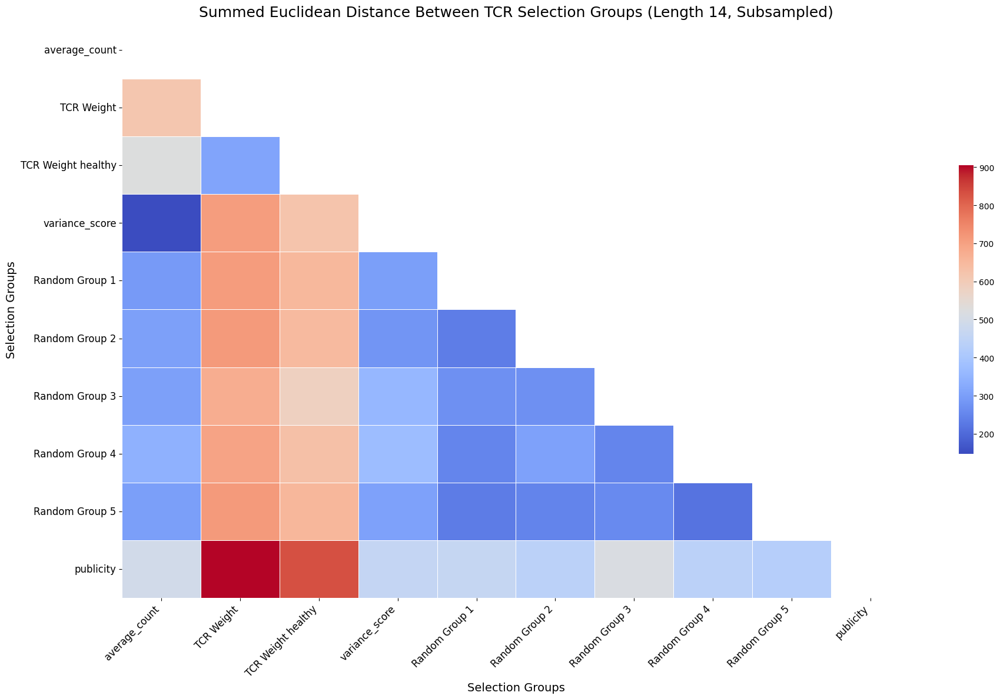

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance

# --------------------------------------------------------------
# 1. READ & PREPARE THE DATA
# --------------------------------------------------------------

# Load the main CSV file into DataFrames
file_path_main = 'final_tcr_selection_adjusted_distribution_with_random_groups1500.csv'
file_path_covid = 'final_tcr_selection_adjusted_distribution_with_random_groups.csv'

df_main = pd.read_csv(file_path_main)
df_covid = pd.read_csv(file_path_covid)

# Exclude irrelevant groups
df_main = df_main[~df_main['selection_group'].isin(['consistency_area2_top','explosion_area_top'])]
df_covid = df_covid[~df_covid['selection_group'].isin(['consistency_area2_top','explosion_area_top'])]

# Filter for sequences of length 14
df_main['sequence_length'] = df_main['amino_acid'].str.len()
df_covid['sequence_length'] = df_covid['amino_acid'].str.len()
df_main = df_main[df_main['sequence_length'] == 14]
df_covid = df_covid[df_covid['sequence_length'] == 14]

# Extract the 'consistency_area_top' group from the main file
consistency_main = df_main.loc[df_main['selection_group'] == 'consistency_area_top', 'amino_acid'].dropna().tolist()

# Extract all other groups from the COVID file
unique_groups = df_covid['selection_group'].unique()
groups = {
    group: df_covid.loc[df_covid['selection_group'] == group, 'amino_acid'].dropna().tolist()
    for group in unique_groups
}

# Add the 'consistency_area_top' group from the main file as 'TCR Weight'
groups['TCR Weight'] = consistency_main

# Remove any sequences with '*'
for g in groups:
    groups[g] = [seq for seq in groups[g] if '*' not in seq]

# Subsample each group to the size of the smallest group
min_size = min(len(seqs) for seqs in groups.values())
print(f"Subsampling each group to {min_size} sequences.\n")
for g in groups:
    groups[g] = np.random.choice(groups[g], min_size, replace=False).tolist()

# Print final group sizes
for g, seqs in groups.items():
    print(f"{g}: {len(seqs)}")

# --------------------------------------------------------------
# 2. SUMMED EUCLIDEAN DISTANCE ACROSS POSITIONS
# --------------------------------------------------------------

# Function to count presence of each amino acid at a specific position
def amino_acid_presence_at_position(group_seqs, position):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'
    presence_counts = {aa: 0 for aa in amino_acids}
    for seq in group_seqs:
        # position - 1 because Python is 0-indexed but we label positions 1..20
        if len(seq) >= position:
            aa = seq[position - 1]
            presence_counts[aa] += 1
    return presence_counts

summed_distances = None

# Loop through positions 1 to 20
for pos in range(1, 21):
    # Build a DataFrame of amino-acid presence for each group at this position
    aa_presence = {g: amino_acid_presence_at_position(seqs, pos) for g, seqs in groups.items()}
    data = pd.DataFrame.from_dict(aa_presence, orient='index').fillna(0)

    # Calculate Euclidean distance matrix for this position
    dist_matrix = distance.squareform(distance.pdist(data, metric='euclidean'))

    # Accumulate distances
    if summed_distances is None:
        summed_distances = dist_matrix
    else:
        summed_distances += dist_matrix

# Put into a DataFrame
summed_distance_df = pd.DataFrame(summed_distances, index=data.index, columns=data.index)

# --------------------------------------------------------------
# 3. RENAME & REORDER THE GROUPS
# --------------------------------------------------------------

group_name_map = {
    'consistency_area_top': 'TCR Weight healthy',
    'average_count_top': 'average_count',
    'variance_score_top': 'variance_score',
    'publicity_top': 'publicity',
    'random_selection_1': 'Random Group 1',
    'random_selection_2': 'Random Group 2',
    'random_selection_3': 'Random Group 3',
    'random_selection_4': 'Random Group 4',
    'random_selection_5': 'Random Group 5',
    'TCR Weight 1500': 'TCR Weight'
}

summed_distance_df.rename(index=group_name_map, columns=group_name_map, inplace=True)

# Desired order (edit as needed)
final_order = [
    'average_count',
    'TCR Weight',
    'TCR Weight healthy',
    'variance_score',
    'Random Group 1',
    'Random Group 2',
    'Random Group 3',
    'Random Group 4',
    'Random Group 5',
    'publicity'
]

summed_distance_df = summed_distance_df.reindex(index=final_order, columns=final_order)

print("\nFinal Group Order in DataFrame:")
print(summed_distance_df.index)

# --------------------------------------------------------------
# 4. PLOT ONLY THE LOWER-TRIANGLE HEATMAP WITHOUT VALUES
# --------------------------------------------------------------

plt.figure(figsize=(19, 12))

# Create a mask to hide the upper triangle (including the diagonal)
mask = np.triu(np.ones_like(summed_distance_df, dtype=bool))

# Plot using seaborn's heatmap
sns.heatmap(
    summed_distance_df,
    mask=mask,
    cmap='coolwarm',
    linewidths=.5,
    cbar_kws={'shrink': 0.5},
    annot=False  # no numeric text in the cells
)

plt.title('Summed Euclidean Distance Between TCR Selection Groups (Length 14, Subsampled)', fontsize=18)
plt.xlabel('Selection Groups', fontsize=14)
plt.ylabel('Selection Groups', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()
